#### In order to run the following code, the following packages from evolve binary

In [1]:
# Setting up required packages
# FOLLOW GITHUB INSTRUCTIONS OR MAY NOT WORK 

import juliacall
import numpy as np
import fit_modeler
import mcfacts.external.evolve_binary.evolve_binary as evolve_binary
import pandas as pd
import time
import surrogate
from astropy import constants as const
import matplotlib.pyplot as plt

np.set_printoptions(legacy='1.13')

Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython


In [2]:
# Setting up empty lists to read McFACTS output data files names
# Uploading surrogate file to run Post Newtonian Methods on Binary Black Holes Mergers

gal = [str(i).zfill(3) for i in range(100)]
obj = [str(i) for i in range(100)]
runs = [[] for _ in range(len(gal))]
print(runs)
for i in range(len(gal)):
    for j in range(len(obj)):
        temp = '/Users/sray/Documents/Saavik_Barry/test_mcfacts/runs/gal' + gal[i] + '/output_bh_binary_' + obj[j] + '.dat'
        runs[i].append(temp)
print(gal)
print(obj)
print(runs)
surrogate = fit_modeler.GPRFitters.read_from_file(f"surrogate.joblib")

[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
['000', '001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012', '013', '014', '015', '016', '017', '018', '019', '020', '021', '022', '023', '024', '025', '026', '027', '028', '029', '030', '031', '032', '033', '034', '035', '036', '037', '038', '039', '040', '041', '042', '043', '044', '045', '046', '047', '048', '049', '050', '051', '052', '053', '054', '055', '056', '057', '058', '059', '060', '061', '062', '063', '064', '065', '066', '067', '068', '069', '070', '071', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '082', '083', '084', '08

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

In [3]:
# Setting up a function to estimate the BBH seperations allowing for faster run times

def new_bin_sep(freq, i):
    active_bin = pd.read_csv(i, delimiter=' ', header = 0)
    mass_1 = active_bin['mass_1']
    mass_2 = active_bin['mass_2']
    print(mass_1)
    G = const.G.value
    M_dot = 2e30
    grav_freq = freq
    
    #print('mass_1: ', active_bin['mass_1'])
    #print('grav_freq: ', active_bin['gw_freq'])
    
    a_bin = ((G * (mass_1 + mass_2) * M_dot * np.pi**2) / grav_freq**2) ** (1/3)
    #a_bin = ((G * (mass_1 + mass_2) * M_dot) / (16 * grav_freq**2 * np.pi**2))**1/3
    a_bin_rg = a_bin / 1.5e11
    return a_bin_rg

In [19]:
# Bulk of calculations in which McFACTS outputs are loaded in 
# Once those outputs are loaded in the cell will check for mergers and continuously monitor the status of each binary system as the program runs
# once a merger is detected, the cell will call the Post Newtonian methods and calculate the final parameters of the remant black hole 
# The final parameters include: remnant mass in units of solar masses, remnant spin in a dimensionless quantity, and remnant kick velocity in units of c
# Run time for Apple MacBook Air with M3 chip, 16GB RAM, and 8 cores is approximately 11min.

total_mass_final = []
total_spin_final = []
total_velocity_final = []

num_of_obj_mergers = []
num_of_gal_mergers = []


for i in range(len(gal)):
    merger_counter_gal = []
    total_start_mass1 = []
    total_start_mass2 = []
    total_start_spin1 = []
    total_start_spin2 = []
    print('===================================   NEW GALAXY   =================================')
    for j in range(len(obj)):
        if j == 0:
            continue
        merger_counter_obj = []
        
        #The following logic systems use the current binary as the base for checks
        active_bin = pd.read_csv(runs[i][j], delimiter=' ', header = 0)
        print('----------------     NEW TIMESTEP     ----------------')
        mass_final = []
        spin_final = []
        velocity_final = []
        starting_mass1 = []
        starting_mass2 = []
        starting_spin1 = []
        starting_spin2 = []
        
        # This checks if the current timestep is empty
        if active_bin.empty:
            print('Galaxy ', gal[i], ' and run ', obj[j])
            print('file is empty. Checking for previous binaries and moving onto next system')
            act_bin_prev = pd.read_csv(runs[i][j-1], delimiter=' ', header = 0)
            
            bh_prev = act_bin_prev['id_num']
            bh = active_bin['id_num']
            
            #This loop checks if there are any previously generated binaries
            # If there are any previously merged binaries, then this must mean those binaries have merged
            #  since the current timestep is empty.
            if bh_prev.empty:
                print('no previously merged binaries')
            else:
                for values in bh_prev:
                    print('binary ', values, ' has merged...beginning surrogate model')
                    #merger_counter_obj.append(obj[j])
                    for i in range(len(act_bin_prev['mass_1'])):
                        mass_1 = act_bin_prev['mass_1'][i]
                        mass_2 = act_bin_prev['mass_2'][i]
                        spin_1_mag = act_bin_prev['spin_1'][i]
                        spin_2_mag = act_bin_prev['spin_2'][i]
                        spin_angle_1 = act_bin_prev['spin_angle_1'][i]
                        spin_angle_2 = act_bin_prev['spin_angle_2'][i]
                        phi_12 = spin_angle_2 - spin_angle_1
                        # This should be in units of mass_1 + mass_2
                        bin_sep = 1000
                        bin_inc = [0, 0, 1]
                        bin_phase = 0
                        # These next three are used to correct the remnant velocity;
                        # If they are None, no correction is applied.
                        bin_orb_a = None
                        mass_SMBH = None
                        spin_SMBH = None

                        surrogate = fit_modeler.GPRFitters.read_from_file(f"surrogate.joblib")

                        start = time.time()
                        M_f, spin_f, v_f = evolve_binary.evolve_binary(
                            mass_1,
                            mass_2,
                            spin_1_mag,
                            spin_2_mag,
                            spin_angle_1,
                            spin_angle_2,
                            phi_12,
                            bin_sep,
                            bin_inc,
                            bin_phase,
                            bin_orb_a,
                            mass_SMBH,
                            spin_SMBH,
                            surrogate,
                            verbose=True,
                        )
                        end = time.time()
                        
                        run_time = end - start

                        mass_final.append(M_f)
                        spin_final.append(spin_f)
                        velocity_final.append(v_f)
                        
                    print("M_f = ", M_f)
                    print("spin_f = ", spin_f)
                    print("v_f = ", v_f)
                    print("Merger took ", run_time, " seconds")
        
        else:
            print('binary found at galaxy ', gal[i], ' and binary ', obj[j])
            act_bin_prev = pd.read_csv(runs[i][j-1], delimiter=' ', header = 0)
            
            mass_1 = act_bin_prev['mass_1']
            mass_2 = act_bin_prev['mass_2']
            spin_1 = act_bin_prev['spin_1']
            spin_2 = act_bin_prev['spin_2']
            spin_angle_1 = act_bin_prev['spin_angle_1']
            spin_angle_2 = act_bin_prev['spin_angle_2']
            
            bh_prev = act_bin_prev['id_num'].values
            bh = active_bin['id_num'].values
            
            #This loop check to see if any binaries have formed
            for value in bh:
                if act_bin_prev.empty:
                    print('binary ', value, ' has formed')
                elif value not in bh_prev:
                    print('binary ', value, ' has formed')
                else:
                    print('binary ', value, ' has not yet mergered')
            
            for value in bh_prev:
                if value not in bh:
                    print('binary ', value, ' has merged...beginning surrogate model')
                    #merger_counter_obj.append(obj[j])
                    for k in range(len(act_bin_prev['mass_1'])):
                        mass_1 = act_bin_prev['mass_1'][k]
                        mass_2 = act_bin_prev['mass_2'][k]
                        spin_1_mag = act_bin_prev['spin_1'][k]
                        spin_2_mag = act_bin_prev['spin_2'][k]
                        spin_angle_1 = act_bin_prev['spin_angle_1'][k]
                        spin_angle_2 = act_bin_prev['spin_angle_2'][k]
                        phi_12 = spin_angle_2 - spin_angle_1
                        # This should be in units of mass_1 + mass_2
                        bin_sep = 1000
                        bin_inc = [0, 0, 1]
                        bin_phase = 0
                        # These next three are used to correct the remnant velocity;
                        # If they are None, no correction is applied.
                        bin_orb_a = None
                        mass_SMBH = None
                        spin_SMBH = None

                        surrogate = fit_modeler.GPRFitters.read_from_file(f"surrogate.joblib")

                        start = time.time()
                        M_f, spin_f, v_f = evolve_binary.evolve_binary(
                            mass_1,
                            mass_2,
                            spin_1_mag,
                            spin_2_mag,
                            spin_angle_1,
                            spin_angle_2,
                            phi_12,
                            bin_sep,
                            bin_inc,
                            bin_phase,
                            bin_orb_a,
                            mass_SMBH,
                            spin_SMBH,
                            surrogate,
                            verbose=True,
                        )
                        end = time.time()
                        
                        run_time = end - start

                        mass_final.append(M_f)
                        spin_final.append(spin_f)
                        velocity_final.append(v_f)
                        
                        starting_mass1.append(mass_1)
                        starting_mass2.append(mass_2)
                        starting_spin1.append(spin_1)
                        starting_spin2.append(spin_2)
                        
                    print("M_f = ", M_f)
                    print("spin_f = ", spin_f)
                    print("v_f = ", v_f)
                    print("Merger took ", run_time, " seconds")
        #merger_counter_gal.append(merger_counter_obj)
                    
        #merger_counter_gal.append(merger_counter_obj)
        #print('galaxy ', gal[i], ' had mergers at timesteps ', merger_counter_gal)
        total_mass_final.append(mass_final)
        total_spin_final.append(spin_final)
        total_velocity_final.append(velocity_final)
        total_start_mass1.append(starting_mass1)
        total_start_mass2.append(starting_mass2)
        total_start_spin1.append(starting_spin1)
        total_start_spin2.append(starting_spin2)

print(total_mass_final)
print(total_spin_final)
print(total_velocity_final)
print(total_start_mass1)
print(total_start_mass2)
print(total_start_spin1)
print(total_start_spin2)
                    
        

===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  3
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  4
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  5
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.06152510643005371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     N

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.057314157485961914  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05704998970031738  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  64
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  65
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  66
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  67
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrog

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05601000785827637  seconds


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05862998962402344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.13130903244018555  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.024634838104248047  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03899717330932617  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.036173105239868164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07177305221557617  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07235574722290039  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05167365074157715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05189323425292969  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05792403221130371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022829771041870117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03708481788635254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.15175700187683105  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
-

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.08652687072753906  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07376217842102051  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.1610636891
spin_f =  [-0.0386199 -0.0219985  0.6911161]
v_f =  [ -6.48495154e-05   3.94114291e-05   6.50879611e-04]
Merger took  0.02390599250793457  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  30
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  31
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  32
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  33
binary  369.0  has not yet merger

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4826146546
spin_f =  [ 0.00634333 -0.00960728  0.67868473]
v_f =  [  7.66553417e-05   8.84312703e-05   1.97070827e-04]
Merger took  0.06291794776916504  seconds
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4826146546
spin_f =  [ 0.00634333 -0.00960728  0.67868473]
v_f =  [  7.66553417e-05   8.84312703e-05   1.97070827e-04]
Merger took  0.027543067932128906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  37
binary  373.0  has not yet mergered
binary  376.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.8771277329
spin_f =  [ 0.03338435 -0.02885782  0.71974269]
v_f =  [ -2.85607204e-05   1.12508157e-04  -8.87687340e-04]
Merger took  0.06587600708007812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  38
binary  373.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  39
binary  376.0  has not yet mergered
binary  379.0  has formed
binary  380.0  has formed
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.9008570287
spin_f =  [ 0.02641071  0.01331994  0.72252255]
v_f =  [  4.63528069e-05   4.96085349e-05  -8.30885013e-05]
Merger took  0.08812403678894043  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  40
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  41
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  42
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  382.0  has formed
----------------     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  65.0037448524
spin_f =  [-0.02685631 -0.3360585   0.57217855]
v_f =  [-0.00086693 -0.00194977  0.00174238]
Merger took  0.026981830596923828  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  44
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  45
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  46
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  382.0  has not yet mergered
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.4240758872
spin_f =  [ 0.00319447 -0.0063271   0.69594369]
v_f =  [-0.00023814 -0.00010858 -0.00036674]
Merger took  0.07738399505615234  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  49
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has formed
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.5763609644
spin_f =  [-0.00393471  0.00321255  0.69108022]
v_f =  [ -5.54758259e-05   1.02286509e-04  -2.93604160e-06]
Merger took  0.02460193634033203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  50
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  51
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  57.3961721003
spin_f =  [ 0.00091053 -0.00421561  0.64060893]
v_f =  [ -2.70221291e-04  -3.99513889e-04  -5.71974795e-06]
Merger took  0.023273944854736328  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  52
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  396.0  has formed
binary  393.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.8459254256
spin_f =  [-0.04900651 -0.03384906  0.53913552]
v_f =  [-0.00058448 -0.00020994  0.00033755]
Merger took  0.03680109977722168  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  53
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  396.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0863024001
spin_f =  [-0.01147362 -0.00453133  0.68935535]
v_f =  [  6.89133766e-05  -8.28840668e-05   5.88773382e-04]
Merger took  0.04840898513793945  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0863024001
spin_f =  [-0.01147362 -0.00453133  0.68935535]
v_f =  [  6.89133766e-05  -8.28840668e-05   5.88773382e-04]
Merger took  0.04821014404296875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  54
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  396.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0910071202
spin_f =  [-0.01232852 -0.00181222  0.6901315 ]
v_f =  [  5.89083318e-05  -9.28591646e-05   5.75675706e-04]
Merger took  0.05054807662963867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  55
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  56
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
binary  399.0  has formed
binary  392.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.8926654032
spin_f =  [ 0.00756594 -0.01292117  0.54024075]
v_f =  [-0.00049772  0.00033068  0.00014701]
Merger took  0.03810000419616699  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  57
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
binary  399.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  58
binary  399.0  has not yet mergered
binary  400.0  has formed
binary  389.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.9719298643
spin_f =  [ 0.0620412  -0.0397202   0.73469066]
v_f =  [ -2.92485616e-05   4.29932926e-05  -6.81847394e-04]
Merger took  0.06363797187805176  seconds
binary  394.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.9719298643
spin_f =  [ 0.0620412  -0.0397202   0.73469066]
v_f =  [ -2.92485616e-05   4.29932926e-05  -6.81847394e-04]
Merger took  0.06513595581054688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  59
binary  399.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  60
binary  399.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  61
binary  399.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has formed
-------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.9010899475
spin_f =  [ 0.01804974 -0.01224678  0.67539838]
v_f =  [ 0.00012703  0.00012762  0.00039489]
Merger took  0.10162830352783203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  64
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
binary  405.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  65
binary  401.0  has not yet mergered
binary  405.0  has not yet mergered
binary  400.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  25.9994766128
spin_f =  [ 0.06439098 -0.03956875  0.74006489]
v_f =  [ -9.82348670e-06   5.43988917e-06  -1.97321755e-04]
Merger took  0.06599092483520508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  66
binary  405.0  has not yet mergered
binary  406.0  has formed
binary  401.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.0242267768
spin_f =  [ 0.07715849  0.06425111  0.72717248]
v_f =  [-0.00013398 -0.00024188 -0.00135884]
Merger took  0.07514214515686035  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  67
binary  405.0  has not yet mergered
binary  406.0  has not yet mergered
binary  407.0  has formed
binary  408.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  68
binary  405.0  has not yet mergered
binary  406.0  has not yet mergered
binary  407.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  69
binary  405.0  has not yet mergered
binary  406.0  has not yet mergered
binary  407.0  has not yet mergered
binary  40

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.4466863721
spin_f =  [ 0.34606213 -0.18106045  0.66067203]
v_f =  [  1.68514999e-05   3.98114224e-04   1.16984435e-04]
Merger took  0.04387807846069336  seconds
binary  407.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.4466863721
spin_f =  [ 0.34606213 -0.18106045  0.66067203]
v_f =  [  1.68514999e-05   3.98114224e-04   1.16984435e-04]
Merger took  0.04681205749511719  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  73
binary  406.0  has not yet mergered
binary  408.0  has not yet mergered
binary  409.0  has not yet mergered
binary  413.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  74
binary  406.0  has not yet mergered
binary  408.0  has not yet mergered
binary  413.0  has not yet mergered
binary  409.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.0292211667
spin_f =  [ 0.17025774 -0.01819112  0.72516834]
v_f =  [ -2.34003789e-04   9.43622805e-05  -8.82272351e-04]
Merger took  0.06342387199401855  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  75
binary  406.0  has not yet mergered
binary  408.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  76
binary  408.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has not yet mergered
binary  406.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  56.710799296
spin_f =  [ 0.00539427  0.00488904  0.62466886]
v_f =  [ 0.00042515  0.00026986 -0.00011211]
Merger took  0.0225369930267334  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  77
binary  408.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  78
binary  408.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  79
binary  408.0  has not yet mergered
binary  414.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  56.7409185342
spin_f =  [ 0.00521602  0.0057102   0.62766865]
v_f =  [  4.31204748e-04   2.49949688e-04  -5.44124847e-05]
Merger took  0.028661012649536133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  80
binary  408.0  has not yet mergered
binary  414.0  has not yet mergered
binary  415.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  81
binary  408.0  has not yet mergered
binary  415.0  has not yet mergered
binary  414.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  86.9226891746
spin_f =  [ 0.51500475 -0.00098548  0.56712124]
v_f =  [  1.57626840e-03   5.74831031e-05   1.27340094e-03]
Merger took  0.01927804946899414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  82
binary  408.0  has not yet mergered
binary  415.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  83
binary  408.0  has not yet mergered
binary  415.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  84
binary  408.0  has not yet mergered
binary  415.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  86.986076796
spin_f =  [ 0.54099944  0.01015799  0.54593041]
v_f =  [  2.06348951e-03   8.77390096e-05   1.63372817e-03]
Merger took  0.019114017486572266  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  86
binary  408.0  has not yet mergered
binary  417.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  87
binary  408.0  has not yet mergered
binary  417.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  70.0615190766
spin_f =  [-0.12013287 -0.42164855  0.61200872]
v_f =  [-0.0001101  -0.00175541  0.00196997]
Merger took  0.0251767635345459  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  88
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  89
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  90
binary  408.0  has not yet mergered
binary  418.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  91
binary  408.0  has not yet mergered
bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  63.1965360824
spin_f =  [-0.00511761 -0.01180969  0.671893  ]
v_f =  [ -1.62089165e-04   4.46414307e-05  -2.14190139e-04]
Merger took  0.020357847213745117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  98
binary  418.0  has not yet mergered
binary  422.0  has not yet mergered
binary  423.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  002  and binary  99
binary  418.0  has not yet mergered
binary  422.0  has not yet mergered
binary  423.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     --------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.1448799459
spin_f =  [  5.08748681e-04   2.76703380e-04   7.01953797e-01]
v_f =  [ -8.19793955e-05  -8.79410523e-05   5.20529664e-05]
Merger took  0.0489959716796875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  36
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  37
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  38
binary  369.0  has not yet mergered
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  39
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.3464651313
spin_f =  [  3.90224988e-04  -2.41038614e-04   5.68099840e-01]
v_f =  [  3.12934739e-05  -5.99531042e-04   1.05185842e-05]
Merger took  0.0401918888092041  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  53
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  54
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
binary  374.0  has not yet mergered
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.3571921414
spin_f =  [  3.64821877e-04  -7.10130818e-04   5.71887410e-01]
v_f =  [ -1.42252768e-04  -5.76968294e-04   1.03138109e-05]
Merger took  0.04043698310852051  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  55
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  56
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equatio

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.6627989396
spin_f =  [ -5.41776851e-04  -7.34924310e-03   6.93860744e-01]
v_f =  [  1.05751719e-04   4.13432668e-05  -3.28815945e-04]
Merger took  0.17890000343322754  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  57
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.9686375084
spin_f =  [ 0.03166393 -0.03134791  0.62201843]
v_f =  [  1.81523064e-05  -4.47118198e-04   1.85791174e-04]
Merger took  0.051793813705444336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  58
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.9741950894
spin_f =  [ 0.03186086 -0.0291537   0.62273299]
v_f =  [  2.43719571e-05  -4.43922521e-04   1.49383194e-04]
Merger took  0.05011105537414551  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  59
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  60
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  61
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  378

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  45.486745535
spin_f =  [ 0.02165138  0.19450522  0.70917604]
v_f =  [ -2.74445134e-05  -2.30380056e-03  -5.45802181e-03]
Merger took  0.030469894409179688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  64
binary  370.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  65
binary  370.0  has not yet mergered
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has formed
binary  378.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.4161139505
spin_f =  [  2.81640557e-03  -8.89673047e-05   5.92523214e-01]
v_f =  [  5.16072623e-04  -2.18264405e-04   8.83090731e-05]
Merger took  0.04155588150024414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  66
binary  370.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0188109766
spin_f =  [ 0.00272895  0.00610667  0.62966241]
v_f =  [ -4.18386413e-04  -5.90979490e-05   4.71747727e-04]
Merger took  0.049410104751586914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  67
binary  370.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  68
binary  370.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  69
binary  370.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     --------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0570479436
spin_f =  [ 0.00813749 -0.00839229  0.63664609]
v_f =  [  4.41209417e-05   4.27832637e-04  -1.12861900e-04]
Merger took  0.04879403114318848  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  75
binary  370.0  has not yet mergered
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  76
binary  370.0  has not yet mergered
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.4817384656
spin_f =  [ 0.00150595  0.00603747  0.61623581]
v_f =  [  3.26697973e-04   4.04693994e-04   4.27395495e-05]
Merger took  0.03967905044555664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  79
binary  370.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  80
binary  370.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  81
binary  370.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.9177089588
spin_f =  [-0.00126524  0.00592259  0.66890758]
v_f =  [ 0.0002731   0.00021672  0.0002636 ]
Merger took  0.04117107391357422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  89
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has formed
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.9236815648
spin_f =  [-0.00087014  0.00592861  0.66995812]
v_f =  [ 0.00030583  0.00015974  0.00025092]
Merger took  0.039396047592163086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  90
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  91
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  92
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.7444822579
spin_f =  [-0.01368806  0.02753695  0.62528499]
v_f =  [-0.00045138 -0.00017413  0.0007323 ]
Merger took  0.030936002731323242  seconds
binary  392.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.7444822579
spin_f =  [-0.01368806  0.02753695  0.62528499]
v_f =  [-0.00045138 -0.00017413  0.0007323 ]
Merger took  0.03184700012207031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  95
binary  397.0  has not yet mergered
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
binary  396.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.8808592659
spin_f =  [ -3.75472819e-03   5.87087008e-04   6.66037324e-01]
v_f =  [ 0.00025625 -0.00019712 -0.00019129]
Merger took  0.06922507286071777  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  96
binary  397.0  has not yet mergered
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
binary  405.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  97
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
binary  405.0  has not yet mergered
binary  397.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.0625913785
spin_f =  [-0.05743394 -0.0521494   0.61456322]
v_f =  [-0.00065931 -0.00035259 -0.00040749]
Merger took  0.1395280361175537  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  98
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
binary  405.0  has not yet mergered
binary  406.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  003  and binary  99
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
binary  405.0  has not yet mergered
binary  406.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  004  and run  1
file is empty. Checking for previous binarie

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.5760216837
spin_f =  [ 0.0035273   0.01836936  0.6969841 ]
v_f =  [ 0.00011543  0.00023413  0.00011639]
Merger took  0.06355500221252441  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  59
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  60
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  61
binary  372.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.5807403112
spin_f =  [ 0.09424729 -0.07270694  0.68788256]
v_f =  [-0.00058174  0.00053937 -0.00149085]
Merger took  0.046793222427368164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  62
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  63
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  64
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  65
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.4232830821
spin_f =  [ 0.01723377 -0.0117583   0.67082559]
v_f =  [ -6.13254129e-05  -2.27586225e-05   1.69451949e-04]
Merger took  0.0816659927368164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  74
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  75
binary  376.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.4284433663
spin_f =  [ 0.01252691 -0.01586633  0.67318767]
v_f =  [ -6.85600238e-05   1.73428752e-06   3.92166011e-05]
Merger took  0.06807208061218262  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  76
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  77
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  78
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  79
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  80
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.9807873023
spin_f =  [ 0.01849824  0.00279498  0.69130761]
v_f =  [ -2.68664344e-05   2.76004158e-05  -3.13226857e-05]
Merger took  0.0783989429473877  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  88
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  89
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  90
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  91
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  48.3981464027
spin_f =  [ 0.00257475 -0.00070007  0.47815518]
v_f =  [  5.57976292e-04  -6.49919632e-05  -3.96698550e-05]
Merger took  0.030369043350219727  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  93
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  94
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  95
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.6460958481
spin_f =  [-0.02151175 -0.01025037  0.66005608]
v_f =  [ -3.09276391e-04   3.51344072e-05  -2.04718328e-04]
Merger took  0.022642850875854492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  96
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  97
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  98
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  004  and binary  99
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.2363971979
spin_f =  [ -5.43551564e-04   6.35377757e-04   6.90890011e-01]
v_f =  [ -8.43234475e-05   2.12797597e-05  -4.22458396e-05]
Merger took  0.05853891372680664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  005  and binary  39
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.6323720667
spin_f =  [ 0.08475959  0.03118887  0.56702434]
v_f =  [-0.00029777 -0.00053394 -0.00033734]
Merger took  0.027138233184814453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  005  and binary  40
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.6416820966
spin_f =  [ 0.07157126  0.04637574  0.56893404]
v_f =  [-0.00013836 -0.00059014 -0.00028703]
Merger took  0.02659893035888672  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  005  and binary  41
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  005  and binary  42
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.0761292564
spin_f =  [ 0.00652428 -0.00136526  0.63882387]
v_f =  [ -1.51627902e-04   6.27598724e-05   3.95192650e-04]
Merger took  0.08464193344116211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  005  and binary  43
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  005  and binary  44
binary  374.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.0821439065
spin_f =  [ 0.00723492  0.00891839  0.64114686]
v_f =  [ -5.07470076e-05   1.60953108e-04   5.00729300e-04]
Merger took  0.10350584983825684  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  005  and run  45
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  22.0850610039
spin_f =  [ 0.00687319  0.0092465   0.64237481]
v_f =  [ -3.84089339e-05   1.64315543e-04   4.73820179e-04]
Merger took  0.08292913436889648  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  49
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.06950712203979492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04546308517456055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.037783145904541016  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04686403274536133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.022873878479003906  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.030292034149169922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03339433670043945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029922962188720703  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.034288883209228516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024775266647338867  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.026319265365600586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.4228249369
spin_f =  [-0.02648277  0.0008222   0.67692699]
v_f =  [ -6.94998123e-05  -3.17928411e-04   3.44072089e-04]
Merger took  0.056858062744140625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  40
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  41
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  42
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  43
binary  370.0  has not yet m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.8666903047
spin_f =  [ 0.01406747  0.00203146  0.62946422]
v_f =  [ 0.00035109  0.00027073 -0.0002755 ]
Merger took  0.05416512489318848  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  46
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  47
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  48
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  49
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  50
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ---------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.805732579
spin_f =  [-0.01789419 -0.0570539   0.50514295]
v_f =  [ -5.91092386e-04   1.60741788e-04  -9.35873361e-05]
Merger took  0.03467369079589844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  54
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  006  and binary  55
binary  372.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.7979705825
spin_f =  [-0.01109944 -0.18432241  0.48200306]
v_f =  [-0.00026071  0.00068734 -0.00039407]
Merger took  0.033675193786621094  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  006  and run  56
file is empty. Checking for previous binaries and moving onto next system
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9099452231
spin_f =  [ 0.00612834  0.00333243  0.64652678]
v_f =  [  4.16121317e-04   3.40955286e-05  -2.22258194e-04]
Merger took  0.05449700355529785  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIME

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03841519355773926  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04619288444519043  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.024466991424560547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.023101091384887695  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.02842879295349121  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030346393585205078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029848814010620117  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030933856964111328  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024126052856445312  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024990081787109375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.1583596816
spin_f =  [ -1.01124749e-04  -1.52351380e-02   6.86063491e-01]
v_f =  [ -1.53180340e-04   3.44650901e-05   7.28760226e-04]
Merger took  0.07454991340637207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  51
binary  369.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  52
binary  369.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has formed
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  53

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  24.6871220056
spin_f =  [ 0.00342852  0.02599678  0.68649609]
v_f =  [ -2.27822839e-05   1.46594060e-04   1.75690946e-04]
Merger took  0.06567001342773438  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  56
binary  375.0  has not yet mergered
binary  378.0  has formed
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6881171279
spin_f =  [ 0.00968315  0.01127625  0.68734945]
v_f =  [ -8.81767453e-05  -1.27216296e-04  -4.16614534e-04]
Merger took  0.06701207160949707  seconds
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6881171279
spin_f =  [ 0.00968315  0.01127625  0.68734945]
v_f =  [ -8.81767453e-05  -1.27216296e-04  -4.16614534e-04]
Merger took  0.06571006774902344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  57
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  58
binary  378.0  has not yet mergered
binary  379.0  has formed
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.2000288784
spin_f =  [-0.01578056  0.00924342  0.69387457]
v_f =  [ -1.05956876e-04  -1.02530595e-04  -9.60349292e-06]
Merger took  0.059433937072753906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  59
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  60
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  61
binary  378.0  has not yet mergered
binary  379.0  has merged...b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.1744420558
spin_f =  [-0.00160875  0.30177334  0.6678011 ]
v_f =  [-0.00021413 -0.00064287 -0.00052162]
Merger took  0.036073923110961914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  62
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  63
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  64
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  65
binary  378.0  has not yet mergered
----------------     NEW T

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.5767509824
spin_f =  [ 0.01828636 -0.01378079  0.62393143]
v_f =  [  4.89328422e-04  -6.78182964e-05   4.03714409e-04]
Merger took  0.03610992431640625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  74
binary  378.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  75
binary  378.0  has not yet mergered
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.5998783683
spin_f =  [ 0.02232692  0.00370604  0.62470061]
v_f =  [ 0.00043742 -0.00023494  0.00059403]
Merger took  0.03676605224609375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  76
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  77
binary  384.0  has formed
binary  378.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.2543221805
spin_f =  [  6.08161402e-04  -2.95914043e-03   7.14754144e-01]
v_f =  [  4.43495455e-05  -1.23337497e-04  -3.27889780e-04]
Merger took  0.059600114822387695  seconds
----------------     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  80
binary  384.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  56.1077815048
spin_f =  [ 0.04049804 -0.05786434  0.62577957]
v_f =  [-0.00011564 -0.00050561  0.00027711]
Merger took  0.039251089096069336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  81
binary  386.0  has formed
binary  384.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.2465488801
spin_f =  [-0.0118786   0.00855147  0.6697822 ]
v_f =  [ -6.07807499e-05  -2.18307293e-04   5.24223327e-04]
Merger took  0.07538676261901855  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  007  and binary  82
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  007  and run  83
f

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.031238794326782227  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.043128252029418945  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03162097930908203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02387714385986328  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02414703369140625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.0975222011
spin_f =  [ 0.02266824 -0.01847894  0.570052  ]
v_f =  [  7.99901798e-07  -5.27755928e-04  -1.32939176e-04]
Merger took  0.03088092803955078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  47
binary  370.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6932448267
spin_f =  [-0.01434212  0.03734719  0.64984631]
v_f =  [ -1.30650881e-04   4.21634944e-04  -5.95679558e-05]
Merger took  0.06948995590209961  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  48
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  49
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  50
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  51
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  370.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.9923998289
spin_f =  [ 0.01254592  0.0116825   0.67043406]
v_f =  [  2.89733409e-04  -8.29009994e-05  -5.85010854e-05]
Merger took  0.06560468673706055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  52
binary  373.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.006671627
spin_f =  [ 0.02419482  0.02252306  0.66813076]
v_f =  [-0.0002218   0.00020313  0.00016778]
Merger took  0.06485223770141602  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  53
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  54
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  55
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  56
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at ga

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.0098255136
spin_f =  [-0.02866434  0.00541026  0.6534645 ]
v_f =  [ 0.00018512  0.00036514 -0.00021685]
Merger took  0.06512689590454102  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  64
binary  376.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.0167575701
spin_f =  [-0.01167725  0.00526071  0.65421273]
v_f =  [  3.32492903e-04   2.42552196e-04  -5.34159993e-05]
Merger took  0.06469488143920898  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  65
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  008  and binary  66
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  008  and run  67
file is empty. Checking for previous binaries and moving onto next system
binary  376.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.038673038
spin_f =  [-0.02341474 -0.01364063  0.65395921]
v_f =  [ 0.00022072 -0.00034999  0.00023453]
Merger

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  71
binary  380.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02291584014892578  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f = 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028339147567749023  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030710935592651367  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030132055282592773  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029947996139526367  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024461746215820312  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.025221824645996094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.0190715524
spin_f =  [ 0.00509764  0.01845396  0.70119614]
v_f =  [ -6.78330484e-05  -6.56107394e-06   9.51456374e-05]
Merger took  0.08640575408935547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  009  and binary  53
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  009  and binary  54
binary  371.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  009  and binary  55
binary  371.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.1756189831
spin_f =  [-0.01794524 -0.0395372   0.63401561]
v_f =  [-0.00030145  0.00037784 -0.00041898]
Merger took  0.022649765014648438  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  009  and binary  56
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  009  and run  57
file is empty. Checking for previous binaries and moving onto next system
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.0952311159
spin_f =  [-0.04456727  0.02151464  0.70340031]
v_f =  [  6.72204318e-06   6.16500326e-05   2.60248211e-04]
Merger took  0.06295609474182129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  5

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.038706064224243164  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04735517501831055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.0374908447265625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.02342081069946289  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.029153108596801758  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03100895881652832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030477046966552734  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030755043029785156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.06048297882080078  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.025435924530029297  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  010  and run  43
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  010  and run  44
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  010  and run  45
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  010  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  47
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  48
binary  370.0  has not yet mergered
----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.2779614593
spin_f =  [ -3.04008397e-04   3.18667400e-03   5.48975577e-01]
v_f =  [  4.93325142e-04   3.31083257e-04   3.88440064e-05]
Merger took  0.033406972885131836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  62
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  63
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  64
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  65
binary  370.0  has not yet mergered
bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.2824855531
spin_f =  [ 0.01492017 -0.01637691  0.67134683]
v_f =  [  4.42777027e-05  -2.57227825e-04   3.93651805e-04]
Merger took  0.07164192199707031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  69
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  70
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  71
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
binary  376.0  has merged...beginning su

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.9059955034
spin_f =  [ 0.11415599 -0.02254753  0.46596495]
v_f =  [  7.01889849e-05  -5.51850664e-04  -1.15250349e-04]
Merger took  0.029887914657592773  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  72
binary  370.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  73
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has formed
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.3583089057
spin_f =  [-0.0421098   0.0072032   0.53138708]
v_f =  [-0.00035161 -0.00048121  0.00034133]
Merger took  0.04577326774597168  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  74
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  75
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.4579983887
spin_f =  [-0.00091075 -0.00325079  0.67485699]
v_f =  [ -1.53751771e-04   5.38746107e-05  -2.09991852e-04]
Merger took  0.04850578308105469  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  76
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  77
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  78
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.4831317274
spin_f =  [-0.01028672 -0.00459143  0.67859362]
v_f =  [  6.32665513e-05  -1.40231581e-04   8.33734121e-05]
Merger took  0.04880809783935547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  81
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  82
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  389.0  has formed
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.0421919001
spin_f =  [ 0.00823756 -0.01564844  0.47486499]
v_f =  [ -5.60908137e-04  -4.62678580e-05   1.62562791e-04]
Merger took  0.03076624870300293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  83
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  84
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  85
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.4811360847
spin_f =  [ 0.01535081  0.00963808  0.53018464]
v_f =  [  6.04237683e-04   4.91245444e-05   2.06295393e-04]
Merger took  0.03484988212585449  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  88
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  89
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7324239812
spin_f =  [ 0.00716871  0.00235738  0.68184673]
v_f =  [  1.13543635e-05  -2.59177737e-05  -1.18169536e-04]
Merger took  0.05814194679260254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  91
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  92
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
binary  393.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.2054882595
spin_f =  [-0.00923224  0.0137943   0.64411263]
v_f =  [-0.00012631 -0.00037562 -0.00027629]
Merger took  0.0460820198059082  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  93
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  94
binary  385.0  has not yet mergered
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  95
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
binary  398.0  has formed
binary  385.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.2183706836
spin_f =  [-0.00993624  0.00402769  0.64789051]
v_f =  [  4.62696855e-05  -3.83143396e-04  -2.86860457e-04]
Merger took  0.05966782569885254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  96
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
binary  398.0  has not yet mergered
binary  399.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  97
binary  389.0  has not yet mergered
binary  394.0  has not yet mergered
binary  398.0  has not yet mergered
binary  399.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galax

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.6215680617
spin_f =  [-0.15406624  0.19549685  0.64918965]
v_f =  [ 0.00095138 -0.001339   -0.00214963]
Merger took  0.041258811950683594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  010  and binary  99
binary  394.0  has not yet mergered
binary  398.0  has not yet mergered
binary  399.0  has not yet mergered
binary  402.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  011  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  368.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.4640033164
spin_f =  [ 0.0058055  -0.008152    0.63234437]
v_f =  [ -4.55862644e-04  -1.77784870e-04  -4.05533925e-05]
Merger took  0.022886991500854492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  43
binary  370

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05460524559020996  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05614209175109863  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05437421798706055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05349302291870117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.057743072509765625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023865938186645508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.036570072174072266  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03838610649108887  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07274603843688965  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.10884213447570801  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7278904928
spin_f =  [-0.00293229  0.00163748  0.6777423 ]
v_f =  [ -7.24401005e-05  -1.14788766e-04   6.25272088e-05]
Merger took  0.10944509506225586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  012  and binary  35
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  012  and binary  36
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  012  and binary  37
binary  369.0  has not yet mergered
binary  372.0  has not yet mergered
binary  371.0  has merged...beginning surrog

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.600516264
spin_f =  [ 0.00764347 -0.0032497   0.68362951]
v_f =  [ -4.12366675e-05   1.65639064e-04   2.17234881e-04]
Merger took  0.0662221908569336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  012  and binary  38
binary  369.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6031106726
spin_f =  [ 0.00630369 -0.00397891  0.68488703]
v_f =  [ -1.30072476e-05   1.70013435e-04   2.20497223e-04]
Merger took  0.16588687896728516  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  012  and run  39
file is empty. Checking for previous binaries and moving onto next system
binary  369.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7426732133
spin_f =  [-0.00343246 -0.00326893  0.68316155]
v_f =  [  6.09170121e-05  -1.14426279e-04  -1.83246048e-04]
Merger took  0.08417892456054688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  43
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  44
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  45
file is empty. Checking for previous binaries and moving onto next system
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05580282211303711  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.056793928146362305  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
-----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05836296081542969  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.07273006439208984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.057520151138305664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022886276245117188  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.036360979080200195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.0690000057220459  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07642292976379395  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07233119010925293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.8087724532
spin_f =  [ 0.00288438 -0.00841929  0.66404644]
v_f =  [-0.00041356 -0.0001223  -0.00022114]
Merger took  0.05709195137023926  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  48
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  49
binary  369.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  50
binary  369.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  51
binary  372.0  has not yet mergered
binary  375.0  has formed
binary  369.0  has merged...beginning surrogate mod

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.7316746267
spin_f =  [-0.01152809 -0.00133002  0.61353321]
v_f =  [ 0.00041556 -0.00037952  0.00023722]
Merger took  0.049831390380859375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  52
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  53
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  54
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TI

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.6921380137
spin_f =  [ 0.01235785  0.01670534  0.65192606]
v_f =  [ 0.00039821 -0.00014882  0.00059058]
Merger took  0.027167081832885742  seconds
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.6921380137
spin_f =  [ 0.01235785  0.01670534  0.65192606]
v_f =  [ 0.00039821 -0.00014882  0.00059058]
Merger took  0.02764725685119629  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  58
binary  372.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  59
binary  372.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  60
binary  372.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  013  and binary  61
binary  372.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.8530218454
spin_f =  [ 0.00097289  0.00158652  0.66199961]
v_f =  [ -3.44863548e-04  -2.42890305e-04  -6.00502376e-05]
Merger took  0.04760384559631348  seconds
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.8530218454
spin_f =  [ 0.00097289  0.00158652  0.66199961]
v_f =  [ -3.44863548e-04  -2.42890305e-04  -6.00502376e-05]
Merger took  0.04717707633972168  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  013  and run  63
file is empty. Checking for previous binaries and moving onto next system
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.7868920273
spin_f =  [ -5.58888730e-04   4.69633199e-04   6.27531391e-01]
v_f =  [  1.68519756e-05  -5.49411556e-04   5.18111948e-06]
Merger took  0.04904007911682129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NE

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022912025451660156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.023221969604492188  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.029248952865600586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.031397104263305664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.031310081481933594  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030717849731445312  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02443695068359375  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023253917694091797  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  014  and run  44
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  014  and run  45
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  014  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  014  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  014  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.061720848083496094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
--------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03921079635620117  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04571795463562012  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02305912971496582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f = 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028057098388671875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03100895881652832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030051708221435547  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030273914337158203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023743867874145508  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023760080337524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  28.9012456784
spin_f =  [ -4.93831743e-04   2.78391293e-02   5.97100301e-01]
v_f =  [-0.00055877 -0.00029687 -0.00073057]
Merger took  0.05533909797668457  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  33
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  34
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  35
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  36
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  37
binary  370.0  has not yet mergered
binary  36

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03572702407836914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05483126640319824  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05491995811462402  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.06853485107421875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05473518371582031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05602407455444336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023134946823120117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03661489486694336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03607487678527832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.10213899612426758  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07375907897949219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.0797413266
spin_f =  [-0.00597185 -0.00425536  0.64395059]
v_f =  [ -2.75288540e-04   3.69607658e-04  -6.88783084e-05]
Merger took  0.05315804481506348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  55
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  56
binary  374.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.3465058009
spin_f =  [ 0.03613858  0.02272828  0.67575044]
v_f =  [  1.88694746e-04  -9.60889259e-05   2.38112746e-04]
Merger took  0.04668283462524414  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.3465058009
spin_f =  [ 0.03613858  0.02272828  0.67575044]
v_f =  [  1.88694746e-04  -9.60889259e-05   2.38112746e-04]
Merger took  0.045710086822509766  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  57
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  58
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  59
binary  374.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  60
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary fou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  19.6798400623
spin_f =  [-0.00578941 -0.00085887  0.70164701]
v_f =  [  6.60647185e-05   1.62287453e-05  -2.27887049e-04]
Merger took  0.10343813896179199  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  62
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  63
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  64
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  65
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  016  and binary  66
binary  375.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
M_f =  19.6979835479
spin_f =  [-0.00830364 -0.00298628  0.70898853]
v_f =  [  7.07524411e-05  -3.34793965e-06  -2.05296536e-04]
Merger took  0.11930108070373535  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  68
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  69
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  70
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  71
binary  380.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022533178329467773  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.029359102249145508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030501127243041992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030030012130737305  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03089594841003418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023424863815307617  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.12526607513427734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  26.1748122916
spin_f =  [ 0.02059336 -0.01132617  0.68737877]
v_f =  [  3.40388770e-04   3.66953382e-05  -5.60624611e-04]
Merger took  0.06220126152038574  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  52
binary  371.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  53
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  54
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.5061634808
spin_f =  [ 0.00143974 -0.00468873  0.58089093]
v_f =  [  5.73820206e-04  -8.72982305e-05   2.08546982e-04]
Merger took  0.04185914993286133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  55
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  56
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  57
binary  374.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.523700402
spin_f =  [ -7.19987004e-05  -2.37048636e-03   5.85788874e-01]
v_f =  [  5.69455509e-04   1.04992829e-05   1.90755305e-04]
Merger took  0.04133915901184082  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  58
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  59
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  60
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  017  and binary  61
binary  374.0  has not yet mergere

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.5584654796
spin_f =  [ 0.00074919 -0.00104271  0.59572678]
v_f =  [  5.46007615e-04  -4.66455911e-05   1.10583827e-04]
Merger took  0.04142904281616211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  67
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022092103958129883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.029296875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.029809236526489258  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030059099197387695  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030183076858520508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024255990982055664  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023286104202270508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  369.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  018  and binary  55
binary  372.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.4174419037
spin_f =  [ 0.00663882 -0.03880886  0.7187377 ]
v_f =  [  8.12605770e-05   1.46132409e-04   1.50848255e-04]
Merger took  0.060150146484375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  018  and binary  56
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  018  and run  57
file is empty. Checking for previous binaries and moving onto next system
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.4109224356
spin_f =  [-0.01010752  0.00932615  0.72048032]
v_f =  [ 0.00013687  0.00014408  0.0010139 ]
Merger took  0.05922412872314453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.06418824195861816  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04673290252685547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022944927215576172  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028227806091308594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03052210807800293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03008413314819336  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030392885208129883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023211956024169922  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023612260818481445  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  33.8940511869
spin_f =  [ 0.00933653  0.00605475  0.68322622]
v_f =  [  7.77782147e-05   1.26343657e-04   1.63980979e-04]
Merger took  0.038581132888793945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  66
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  384.0  has formed
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.6623141661
spin_f =  [ 0.08490567 -0.00226083  0.58020748]
v_f =  [-0.00014027  0.00059306  0.00035295]
Merger took  0.03340601921081543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  67
binary  371.0  has not yet mergered
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7442393135
spin_f =  [ 0.00631415 -0.01250778  0.67957628]
v_f =  [  1.69256592e-05  -1.14562814e-04  -3.23689118e-05]
Merger took  0.08431315422058105  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  68
binary  371.0  has not yet mergered
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  69
binary  371.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has formed
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Ev

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7528620832
spin_f =  [-0.00570403  0.00108083  0.6808183 ]
v_f =  [ -1.02347372e-04  -6.41277046e-05   3.01308412e-04]
Merger took  0.08502793312072754  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  70
binary  371.0  has not yet mergered
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has not yet mergered
binary  381.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.9196154051
spin_f =  [ 0.01417989  0.00810267  0.68781985]
v_f =  [  7.28704413e-05   1.34213404e-04   2.59939693e-04]
Merger took  0.03848385810852051  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  71
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.9255045661
spin_f =  [ 0.01617261  0.00456161  0.68872141]
v_f =  [  9.53803602e-05   1.20120616e-04   3.19012836e-04]
Merger took  0.03768587112426758  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  72
binary  380.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  73
binary  380.0  has not yet mergered
binary  387.0  has not yet mergered
binary  391.0  has formed
binary  384.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.9346361137
spin_f =  [ 0.01633978  0.01026537  0.69042405]
v_f =  [  6.40018637e-05   1.42027546e-04   2.98175810e-04]
Merger took  0.0381472110748291  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  74
binary  380.0  has not yet mergered
binary  387.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  75
binary  380.0  has not yet mergered
binary  387.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTE

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  48.771395078
spin_f =  [ 0.00304836  0.00200952  0.54966239]
v_f =  [ -4.27540423e-05  -5.94979611e-04   4.07430049e-05]
Merger took  0.029124021530151367  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  78
binary  380.0  has not yet mergered
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  398.0  has not yet mergered
binary  399.0  has formed
binary  396.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7855500049
spin_f =  [ -3.20620382e-03  -2.25604103e-04   6.86815418e-01]
v_f =  [ -8.17839335e-05  -1.09225017e-04   3.08188724e-06]
Merger took  0.08404397964477539  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  79
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  398.0  has not yet mergered
binary  399.0  has not yet mergered
binary  402.0  has formed
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.581105943
spin_f =  [ 0.00934458 -0.0067832   0.67436598]
v_f =  [  1.36255711e-05   1.40360841e-05   2.44037773e-04]
Merger took  0.040827035903930664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  80
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  398.0  has not yet mergered
binary  399.0  has not yet mergered
binary  402.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  81
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  402.0  has not yet mergered
binary  405.0  has formed
binary  398.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2057582206
spin_f =  [ 0.00762323  0.00239719  0.69436173]
v_f =  [-0.0002443  -0.0002478  -0.00048784]
Merger took  0.026092052459716797  seconds
binary  399.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2057582206
spin_f =  [ 0.00762323  0.00239719  0.69436173]
v_f =  [-0.0002443  -0.0002478  -0.00048784]
Merger took  0.02695298194885254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  82
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  402.0  has not yet mergered
binary  405.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  83
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  402.0  has not yet mergered
binary  405.0  has not yet mergered
binary  409.0  has formed
binary  410.0  has formed
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8013101151
spin_f =  [-0.00113343 -0.00135458  0.69042627]
v_f =  [  3.77602726e-06   1.43364331e-04   7.52444576e-05]
Merger took  0.0859673023223877  seconds
binary  392.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8013101151
spin_f =  [-0.00113343 -0.00135458  0.69042627]
v_f =  [  3.77602726e-06   1.43364331e-04   7.52444576e-05]
Merger took  0.08568191528320312  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  84
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  402.0  has not yet mergered
binary  405.0  has not yet mergered
binary  409.0  has not yet mergered
binary  410.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  85
binary  393.0  has not yet mergered
binary  397.0  has not yet mergered
binary  402.0  has not yet mergered
binary  405.0  has not yet mergered
binary  409.0  has not yet mergered
binary  410.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.241965329
spin_f =  [ 0.00133768  0.00095499  0.67095606]
v_f =  [ -3.78094811e-04   3.91126174e-05  -3.39740825e-04]
Merger took  0.0680379867553711  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  87
binary  402.0  has not yet mergered
binary  409.0  has not yet mergered
binary  410.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has formed
binary  393.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8150603341
spin_f =  [ -7.02508890e-04  -1.07690428e-04   6.93350617e-01]
v_f =  [  8.74188693e-05  -1.15209211e-04   8.46048168e-05]
Merger took  0.10962820053100586  seconds
binary  397.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8150603341
spin_f =  [ -7.02508890e-04  -1.07690428e-04   6.93350617e-01]
v_f =  [  8.74188693e-05  -1.15209211e-04   8.46048168e-05]
Merger took  0.08437919616699219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  88
binary  409.0  has not yet mergered
binary  410.0  has not yet mergered
binary  414.0  has not yet mergered
binary  419.0  has formed
binary  420.0  has formed
binary  402.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.6934477467
spin_f =  [ 0.46066435 -0.1373201   0.3509312 ]
v_f =  [ 0.00113361 -0.00093733  0.00017832]
Merger took  0.02815103530883789  seconds
binary  413.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.6934477467
spin_f =  [ 0.46066435 -0.1373201   0.3509312 ]
v_f =  [ 0.00113361 -0.00093733  0.00017832]
Merger took  0.029288768768310547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  89
binary  409.0  has not yet mergered
binary  410.0  has not yet mergered
binary  414.0  has not yet mergered
binary  419.0  has not yet mergered
binary  420.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  90
binary  410.0  has not yet mergered
binary  419.0  has not yet mergered
binary  420.0  has not yet mergered
binary  425.0  has formed
binary  426.0  has formed
binary  409.0  has merged...

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8253302872
spin_f =  [ -5.57315531e-04  -1.03234677e-03   6.95756342e-01]
v_f =  [ -1.44848512e-04  -3.02004185e-05  -4.81413682e-04]
Merger took  0.08652019500732422  seconds
binary  414.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.8253302872
spin_f =  [ -5.57315531e-04  -1.03234677e-03   6.95756342e-01]
v_f =  [ -1.44848512e-04  -3.02004185e-05  -4.81413682e-04]
Merger took  0.08591794967651367  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  91
binary  410.0  has not yet mergered
binary  419.0  has not yet mergered
binary  420.0  has not yet mergered
binary  425.0  has not yet mergered
binary  426.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  92
binary  410.0  has not yet mergered
binary  425.0  has not yet mergered
binary  426.0  has not yet mergered
binary  432.0  has formed
binary  433.0  has formed
binary  419.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.7688280902
spin_f =  [ 0.36547138 -0.31898103  0.30136216]
v_f =  [ 0.00056182 -0.00173585  0.00058963]
Merger took  0.028779029846191406  seconds
binary  420.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.7688280902
spin_f =  [ 0.36547138 -0.31898103  0.30136216]
v_f =  [ 0.00056182 -0.00173585  0.00058963]
Merger took  0.05282115936279297  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  93
binary  410.0  has not yet mergered
binary  425.0  has not yet mergered
binary  426.0  has not yet mergered
binary  432.0  has not yet mergered
binary  433.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  94
binary  410.0  has not yet mergered
binary  425.0  has not yet mergered
binary  426.0  has not yet mergered
binary  432.0  has not yet mergered
binary  433.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  95
binary  410.0  has not yet mergered
binary  432.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8400977773
spin_f =  [ 0.00089829 -0.00197418  0.69963805]
v_f =  [  1.11883806e-04   9.35011709e-05   7.16818995e-04]
Merger took  0.08298802375793457  seconds
binary  426.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.8400977773
spin_f =  [ 0.00089829 -0.00197418  0.69963805]
v_f =  [  1.11883806e-04   9.35011709e-05   7.16818995e-04]
Merger took  0.10511994361877441  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  96
binary  432.0  has not yet mergered
binary  433.0  has not yet mergered
binary  438.0  has not yet mergered
binary  439.0  has not yet mergered
binary  410.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  82.2482089251
spin_f =  [ 0.36854836  0.2335813   0.61728767]
v_f =  [  2.72614980e-04   1.16804263e-05  -4.91566818e-05]
Merger took  0.019359827041625977  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  97
binary  432.0  has not yet mergered
binary  433.0  has not yet mergered
binary  438.0  has not yet mergered
binary  439.0  has not yet mergered
binary  440.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  019  and binary  98
binary  432.0  has not yet mergered
binary  433.0  has not yet mergered
binary  438.0  has not yet mergered
binary  439.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.5344746584
spin_f =  [-0.17933487  0.19175448  0.54502298]
v_f =  [-0.00053108 -0.00085395 -0.0016752 ]
Merger took  0.03980588912963867  seconds
binary  433.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.5344746584
spin_f =  [-0.17933487  0.19175448  0.54502298]
v_f =  [-0.00053108 -0.00085395 -0.0016752 ]
Merger took  0.04043912887573242  seconds
binary  438.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  42.5344746584
spin_f =  [-0.17933487  0.19175448  0.54502298]
v_f =  [-0.00053108 -0.00085395 -0.0016752 ]
Merger took  0.05340313911437988  seconds
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  020  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  020  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  020  and run  3
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  020  and run  4
file is empty. Checking for previous binaries and moving onto next system
no previ

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.1080054876
spin_f =  [ 0.0156428  -0.00284662  0.66740977]
v_f =  [  1.74934690e-04  -8.68810507e-05  -2.62647465e-04]
Merger took  0.04644608497619629  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  31
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  32
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  33
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  34
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.0658498173
spin_f =  [ 0.00927893 -0.00855987  0.65296561]
v_f =  [-0.00032846 -0.00020068 -0.00036038]
Merger took  0.04394674301147461  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  36
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  37
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  38
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  39


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.285343081
spin_f =  [-0.00765234 -0.01764228  0.55845698]
v_f =  [  1.37000233e-05   5.73481413e-04  -6.44463091e-05]
Merger took  0.03150320053100586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  41
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  42
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  43
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  44
binary  372.0  has not yet mergered
bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.1796863873
spin_f =  [ -9.47150270e-03  -3.35615429e-04   6.45770930e-01]
v_f =  [-0.00021637  0.00010762 -0.00038228]
Merger took  0.0995173454284668  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  46
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  47
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.7136475374
spin_f =  [ 0.00152338 -0.00152073  0.56698306]
v_f =  [ -2.64312465e-04  -5.43117477e-04   3.21984547e-05]
Merger took  0.029861927032470703  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  48
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.3383554364
spin_f =  [ 0.00630338  0.015787    0.6882876 ]
v_f =  [ -1.30441100e-05  -1.27485331e-05   9.40688074e-04]
Merger took  0.04209113121032715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  49
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  50
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.349298214
spin_f =  [ 0.02404985  0.02938303  0.68880348]
v_f =  [  9.58326415e-07   1.02319479e-05   1.00365398e-03]
Merger took  0.042237281799316406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  51
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  52
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.7672489763
spin_f =  [ 0.02130604 -0.00879172  0.51758182]
v_f =  [ 0.00053964 -0.00025492  0.00020147]
Merger took  0.03639507293701172  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  53
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  54
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  020  and binary  55
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.8188307741
spin_f =  [-0.01028742 -0.00629201  0.51790855]
v_f =  [  2.64861126e-05  -5.91432454e-04   1.76591828e-04]
Merger took  0.034819841384887695  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  020  and run  58
file is empty. Checking for previous binaries and moving onto next system
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.3894820257
spin_f =  [ 0.00924748  0.02927637  0.69613128]
v_f =  [  6.59822399e-05  -1.68318445e-07  -9.15169916e-04]
Merger took  0.07197690010070801  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  61
binary  374.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03766489028930664  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04549217224121094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02247309684753418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.042971134185791016  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.02758502960205078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.02956390380859375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029891252517700195  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03010416030883789  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024245023727416992  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02319169044494629  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.4930868256
spin_f =  [-0.0048718  -0.01313226  0.68051921]
v_f =  [ -1.40769862e-04   6.96361477e-05   1.09560693e-03]
Merger took  0.04456615447998047  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  53
binary  371.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  54
binary  371.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  55
binary  375.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.8466758451
spin_f =  [  8.74450033e-03  -4.84643497e-04   6.41489715e-01]
v_f =  [ -5.05740864e-04  -7.26694337e-05  -2.24133641e-04]
Merger took  0.05018496513366699  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  56
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  57
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  58
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  59
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  45.5719245346
spin_f =  [ 0.02550308  0.01480475  0.50282865]
v_f =  [-0.00041258  0.00046336  0.00047352]
Merger took  0.11020088195800781  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  65
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  45.5777361439
spin_f =  [ 0.01124416 -0.00680117  0.50426239]
v_f =  [-0.0005305   0.00033451  0.00040203]
Merger took  0.03458404541015625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  66
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  67
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
E

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.6467447235
spin_f =  [-0.14087251 -0.0643593   0.65218076]
v_f =  [  1.76398352e-05   1.05855657e-03  -3.62286257e-03]
Merger took  0.05065011978149414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  68
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.6146241326
spin_f =  [-0.18751603 -0.17138338  0.63203073]
v_f =  [ 0.00071639  0.00192614 -0.00389623]
Merger took  0.05006909370422363  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  69
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  70
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  71
binary  3

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.3362837103
spin_f =  [-0.57787886 -0.08457981  0.54281491]
v_f =  [ 0.00148185  0.00020656 -0.00140521]
Merger took  0.05041003227233887  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  73
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  74
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  75
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.1338048277
spin_f =  [-0.0086382  -0.01906256  0.68512034]
v_f =  [ -2.24151470e-04  -5.95009911e-05  -7.78388258e-04]
Merger took  0.07794475555419922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  78
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has formed
binary  381.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.1387365787
spin_f =  [-0.02097815 -0.00361706  0.68541817]
v_f =  [ -2.47225368e-04   1.26796953e-05  -4.93554640e-04]
Merger took  0.07928299903869629  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  79
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  80
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
binary  393.0  has formed
binary  394.0  has formed
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.5816605597
spin_f =  [ 0.00385569 -0.00129968  0.69515013]
v_f =  [ -1.07521481e-04  -2.59408392e-04   6.37445387e-05]
Merger took  0.03813004493713379  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  81
binary  390.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  45.7195064484
spin_f =  [ 0.00564994  0.00402821  0.51827767]
v_f =  [-0.00051241  0.00036038  0.00017723]
Merger took  0.030632734298706055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  82
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  45.7268852248
spin_f =  [ 0.00298638 -0.00319358  0.51948858]
v_f =  [-0.00057212  0.00025432  0.00014402]
Merger took  0.03213810920715332  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  83
binary  394.0  has not yet mergered
binary  393.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  45.7337736084
spin_f =  [ 0.00763092 -0.01589014  0.52051911]
v_f =  [ -6.25768842e-04   1.83942960e-06   8.01164665e-05]
Merger took  0.031310081481933594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  84
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  85
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  86
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  87
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  021  and binary  88
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP    

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.5573862762
spin_f =  [ 0.00183953  0.00963383  0.66912785]
v_f =  [ -1.99464785e-04  -1.03168417e-04   8.70040042e-05]
Merger took  0.05571579933166504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  49
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  376.0  has formed
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.5618517755
spin_f =  [-0.00322468  0.00528762  0.66990129]
v_f =  [ -2.23687176e-04   3.59749507e-05   2.61721333e-04]
Merger took  0.05512499809265137  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  50
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  51
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  52
binary  370.0  has not yet mergered
binary  376.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.8872113331
spin_f =  [ 0.09417991 -0.10547616  0.5556018 ]
v_f =  [ -2.77081036e-04  -5.11748648e-04  -5.87779406e-05]
Merger took  0.0265500545501709  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  53
binary  370.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  54
binary  370.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  55
binary  376.0  has not yet mergered
binary  380.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.9295739349
spin_f =  [ 0.06994638 -0.09621019  0.55844518]
v_f =  [ -3.49492047e-04  -4.81553761e-04   3.06438263e-05]
Merger took  0.027283906936645508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  56
binary  376.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  57
binary  376.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  58
binary  376.0  has not yet mergered
binary  380.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7074673233
spin_f =  [-0.0081719   0.00122692  0.70368451]
v_f =  [ -9.44887703e-06   4.69184059e-05   8.62691799e-05]
Merger took  0.0867757797241211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  65
binary  383.0  has formed
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7090817242
spin_f =  [ -9.41168746e-03  -1.51243592e-04   7.04987591e-01]
v_f =  [ -1.46153128e-05   4.62801087e-05   9.62917668e-05]
Merger took  0.08506298065185547  seconds
binary  381.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.7090817242
spin_f =  [ -9.41168746e-03  -1.51243592e-04   7.04987591e-01]
v_f =  [ -1.46153128e-05   4.62801087e-05   9.62917668e-05]
Merger took  0.1064767837524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  66
binary  383.0  has not yet mergered
binary  384.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  67
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  68
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  69
binary  383.0  has not yet

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.395439914
spin_f =  [-0.03261575  0.10242836  0.55421934]
v_f =  [  2.69959834e-04   6.24643325e-04   2.48387225e-05]
Merger took  0.02924203872680664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  72
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  73
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  74
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has formed
--------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.4806591863
spin_f =  [-0.00886199 -0.0039321   0.68161819]
v_f =  [  1.84849358e-04  -2.21958166e-06   1.96786113e-04]
Merger took  0.09411215782165527  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  77
binary  384.0  has not yet mergered
binary  383.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.3257677538
spin_f =  [-0.10529623  0.29692407  0.64420764]
v_f =  [-0.00061152  0.00020314  0.0002388 ]
Merger took  0.06846976280212402  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  78
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  79
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  80
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  81
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  82
binary  384.0  has not yet mergered
binary  389.0  has formed
----------------     NEW TI

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.4485171457
spin_f =  [ 0.02545025  0.01112613  0.57907125]
v_f =  [-0.00025425  0.0005478   0.00028293]
Merger took  0.04314112663269043  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  87
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  88
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  89
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  90
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  022  and binary  91
binary  384.0  has not yet mergered
binary  390.0  has formed
----------------     NEW TI

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.1926543542
spin_f =  [ 0.02674842  0.08013633  0.64284591]
v_f =  [  2.60181928e-05   3.87922598e-04   9.85205009e-04]
Merger took  0.024866104125976562  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  022  and run  94
file is empty. Checking for previous binaries and moving onto next system
binary  390.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.2054453638
spin_f =  [ 0.04291384  0.07212325  0.64376104]
v_f =  [ 0.00013182  0.00037704  0.00120821]
Merger took  0.022465944290161133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.025381088256835938  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02489018440246582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5509596097
spin_f =  [-0.02498708  0.02148807  0.63013071]
v_f =  [ 0.00037968 -0.00026039  0.0002173 ]
Merger took  0.04189109802246094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  37
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  40
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  41
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ---------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  19.9163935838
spin_f =  [ 0.00216212 -0.00096918  0.68007407]
v_f =  [  4.91752533e-05  -8.96481002e-07  -1.55909074e-04]
Merger took  0.10692596435546875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  44
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  45
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  46
binary  372.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  47
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  48
binary  372.0  has not yet mergered
binary  373.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.8995398734
spin_f =  [ 0.00362053  0.00340109  0.55591803]
v_f =  [ 0.00047888 -0.00034659  0.00030354]
Merger took  0.033312082290649414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  50
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  51
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  52
binary  373.0  has not yet mergered
binary  376.0  has formed
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.8699184655
spin_f =  [ 0.00478944 -0.008135    0.64278131]
v_f =  [  4.26080224e-04  -9.86282896e-05   1.31760903e-04]
Merger took  0.06085205078125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  53
binary  376.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.2233920901
spin_f =  [ 0.24850383  0.0682761   0.7449282 ]
v_f =  [-0.00098961 -0.00038461 -0.00295869]
Merger took  0.04828476905822754  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  54
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  55
binary  376.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  56
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  57
b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.7334935901
spin_f =  [-0.16992507  0.16814294  0.68579809]
v_f =  [-0.00026451  0.00054686  0.0015351 ]
Merger took  0.029275894165039062  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  61
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  62
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  63
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  64
binary  376.0  has not yet mergered
----------------     NEW T

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.7655512479
spin_f =  [ 0.00115276 -0.00104726  0.70298926]
v_f =  [ 0.00010781 -0.00011027 -0.00032505]
Merger took  0.04964494705200195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  71
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  72
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  73
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.2858611053
spin_f =  [ 0.45342795  0.07316261  0.68841583]
v_f =  [-0.00030985  0.00017784 -0.00026832]
Merger took  0.07006573677062988  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  76
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  77
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  78
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  79
binary  382.0  has not yet mergered
----------------     NEW TI

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  91
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  023  and binary  92
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  023  and run  93
file is empty. Checking for previous binaries and moving onto next system
binary  382.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.0093375143
spin_f =  [ 0.47561133 -0.06368419  0.74783772]
v_f =  [ -4.89049213e-05   5.88403395e-05  -5.97999561e-05]
Merger took  0.04911494255065918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02597498893737793  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.025076866149902344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03813505172729492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05713605880737305  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05696702003479004  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  54
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  55
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  56
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  57
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  58
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  59
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.057599782943725586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05426669120788574  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.058454036712646484  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02443099021911621  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.04052901268005371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03981375694274902  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07887887954711914  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07607102394104004  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6020858712
spin_f =  [ 0.00860922 -0.00102753  0.69563296]
v_f =  [ 0.00016183  0.00012739 -0.00034337]
Merger took  0.07624292373657227  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  68
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  69
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  70
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  71
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.751629883
spin_f =  [ 0.00216596  0.12795466  0.5400892 ]
v_f =  [ 0.00035252 -0.00058522 -0.00047141]
Merger took  0.060339927673339844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  76
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  77
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
binary  374.0  has merged...beginning surrogat

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.7801698749
spin_f =  [ 0.01740772  0.13308913  0.5344994 ]
v_f =  [ 0.00024421 -0.0006488  -0.00047871]
Merger took  0.030596017837524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  78
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  19.9826896751
spin_f =  [ 0.02299308 -0.02768873  0.68147641]
v_f =  [  3.08238472e-06   1.57845012e-05  -4.65569830e-04]
Merger took  0.11127805709838867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  79
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  80
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.1017774376
spin_f =  [-0.00326022 -0.01281417  0.68688492]
v_f =  [ -1.51833466e-04   4.04431460e-06  -9.00011163e-05]
Merger took  0.0798790454864502  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  81
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has formed
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.1041812822
spin_f =  [-0.01149424 -0.01438604  0.68765738]
v_f =  [ -1.44146026e-04   4.74663337e-05   9.32324126e-05]
Merger took  0.0926518440246582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  82
binary  378.0  has not yet mergered
binary  380.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.4026834973
spin_f =  [-0.05509585 -0.00201921  0.68070958]
v_f =  [ -5.91768027e-04  -2.81425922e-05   3.36396201e-03]
Merger took  0.02404189109802246  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  83
binary  378.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  84
binary  380.0  has not yet mergered
binary  384.0  has formed
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.4392189
spin_f =  [-0.01660834 -0.01082279  0.68511061]
v_f =  [-0.00029068 -0.00021106  0.00270592]
Merger took  0.025938034057617188  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  85
binary  384.0  has not yet mergered
binary  385.0  has formed
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.0084200762
spin_f =  [ 0.0097412  -0.01015448  0.68540065]
v_f =  [  2.55810994e-05   1.15249382e-05  -4.80282078e-04]
Merger took  0.12252616882324219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  86
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  87
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  88
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  89
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.9364345013
spin_f =  [-0.00761875 -0.04587557  0.69282542]
v_f =  [ -1.36013425e-04   6.50061439e-05   4.19804852e-04]
Merger took  0.03840994834899902  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  91
binary  385.0  has not yet mergered
binary  390.0  has formed
binary  384.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2883248252
spin_f =  [-0.22126338 -0.29680358  0.59776479]
v_f =  [ 0.00207959  0.00141182 -0.00286532]
Merger took  0.03190922737121582  seconds
binary  387.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2883248252
spin_f =  [-0.22126338 -0.29680358  0.59776479]
v_f =  [ 0.00207959  0.00141182 -0.00286532]
Merger took  0.03163409233093262  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  92
binary  385.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  93
binary  385.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  94
binary  385.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  95
binary  385.0  has not yet mergered
binary  390.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.0465103013
spin_f =  [ 0.00288586 -0.00465721  0.69227764]
v_f =  [  6.45855384e-05   2.43944294e-05  -2.28409715e-04]
Merger took  0.12390685081481934  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  97
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  98
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  025  and binary  99
binary  390.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  026  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     --

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  42
binary  370.0  has not yet mergered
binary  372.0  has formed
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  43
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  44
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.3171070164
spin_f =  [-0.0065705   0.03573417  0.65785741]
v_f =  [ -5.36714434e-05   2.64361457e-04   4.40815592e-04]
Merger took  0.031111955642700195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  45
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  46
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has formed
binary  376.0  has formed
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.8582592344
spin_f =  [  2.93128093e-03   1.48581131e-04   6.74484373e-01]
v_f =  [ -3.44505692e-04   3.87140963e-05   8.18119144e-06]
Merger took  0.08418083190917969  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  47
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.0901099649
spin_f =  [ 0.05155253 -0.04168507  0.55103286]
v_f =  [ 0.00034018  0.00049877 -0.00020558]
Merger took  0.026590824127197266  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  48
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.1002374299
spin_f =  [ 0.04176081 -0.03983643  0.55194097]
v_f =  [ 0.00039656  0.00045208 -0.00022799]
Merger took  0.05700397491455078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  49
binary  376.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.1127462342
spin_f =  [ 0.04439408 -0.03465998  0.5517318 ]
v_f =  [ 0.00034191  0.00049522 -0.00018384]
Merger took  0.027189970016479492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  50
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  51
binary  376.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  52
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  53
binary  376.0  has not yet mergered
binary  3

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.0107809424
spin_f =  [ 0.01933979  0.03018946  0.62573601]
v_f =  [  1.29294835e-05   5.14041194e-04   3.70442596e-04]
Merger took  0.06063199043273926  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  55
binary  379.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  73.748820045
spin_f =  [-0.32824948 -0.03471087  0.6359757 ]
v_f =  [-0.00179876 -0.00021278  0.00291761]
Merger took  0.020667076110839844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  026  and binary  56
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  026  and run  57
file is empty. Checking for previous binaries and moving onto next system
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  73.844956916
spin_f =  [-0.33856558  0.07521394  0.61737313]
v_f =  [-0.00147424  0.00036054  0.00255383]
Merger took  0.02020120620727539  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  61
binary  374.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03709697723388672  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.17067217826843262  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.021811962127685547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.02229595184326172  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.027642011642456055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030493974685668945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03056812286376953  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.02995896339416504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.0230867862701416  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.056427955627441406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.9975740688
spin_f =  [ 0.001674    0.00938543  0.68341642]
v_f =  [  8.28276783e-05  -3.85958404e-05   1.84633299e-04]
Merger took  0.052757978439331055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  43
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  57.1665743171
spin_f =  [  3.34655051e-04  -3.77413396e-03   6.62113424e-01]
v_f =  [ 0.00023643  0.00042582 -0.00021594]
Merger took  0.022331953048706055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  44
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  45
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  46
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  47
binary  370.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.0500758039
spin_f =  [ 0.00847846  0.00301475  0.69946658]
v_f =  [  4.96061826e-05  -5.24646729e-06   4.49625399e-04]
Merger took  0.08981108665466309  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  50
binary  374.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.053634859
spin_f =  [ 0.01023234  0.00389023  0.70033019]
v_f =  [  4.68041659e-05  -1.40765719e-05   4.71600775e-04]
Merger took  0.0883018970489502  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  51
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  52
binary  374.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  53
binary  374.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  54
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.8490026153
spin_f =  [-0.01496446 -0.00350452  0.56595913]
v_f =  [  4.76560591e-05  -6.17310924e-04   1.48845320e-04]
Merger took  0.029424190521240234  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  55
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  56
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  57
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.3732584055
spin_f =  [-0.0355162  -0.12793528  0.64259016]
v_f =  [ 0.0002231   0.00169546 -0.0034926 ]
Merger took  0.05449700355529785  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  63
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  64
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  65
binary  377.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
binary  378.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.3527555083
spin_f =  [ -3.74841541e-04   9.59428542e-03   6.34185707e-01]
v_f =  [  3.00483747e-04  -8.10003926e-05  -9.97054639e-05]
Merger took  0.059600830078125  seconds
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.3527555083
spin_f =  [ -3.74841541e-04   9.59428542e-03   6.34185707e-01]
v_f =  [  3.00483747e-04  -8.10003926e-05  -9.97054639e-05]
Merger took  0.08258318901062012  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  66
binary  377.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.752944533
spin_f =  [ -6.69077538e-04   3.26035632e-02   6.85721760e-01]
v_f =  [ 0.00010369 -0.00030278 -0.00021456]
Merger took  0.0632169246673584  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  67
binary  381.0  has not yet mergered
binary  385.0  has formed
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.3637162648
spin_f =  [ 0.04741443  0.00111838  0.63137853]
v_f =  [ -4.15304362e-05   2.52307384e-04   1.07840429e-03]
Merger took  0.06112098693847656  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  68
binary  381.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  69
binary  381.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  70
binary  381.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.2162155472
spin_f =  [ 0.03872128  0.03412568  0.68306314]
v_f =  [ -6.78003703e-05   1.93277261e-05  -8.87176172e-04]
Merger took  0.08406686782836914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  74
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  75
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  76
binary  385.0  has not yet mergered
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.2329643941
spin_f =  [ 0.02694234  0.04416705  0.68485647]
v_f =  [ -5.38090225e-05  -1.96705182e-06  -5.83198633e-04]
Merger took  0.10232114791870117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  78
binary  387.0  has not yet mergered
binary  392.0  has formed
binary  393.0  has formed
binary  386.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  86.2020989628
spin_f =  [ 0.0118486   0.24843857  0.64274442]
v_f =  [-0.00050452 -0.00118157 -0.0044178 ]
Merger took  0.019627094268798828  seconds
binary  391.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  86.2020989628
spin_f =  [ 0.0118486   0.24843857  0.64274442]
v_f =  [-0.00050452 -0.00118157 -0.0044178 ]
Merger took  0.019582033157348633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  79
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  80
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  81
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has merged...beginning surrog

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.7347487969
spin_f =  [-0.05778517  0.19939996  0.75223459]
v_f =  [ 0.00014493  0.00115585  0.00414967]
Merger took  0.030253887176513672  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  82
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  396.0  has formed
binary  397.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  83
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has formed
binary  393.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger wi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  45.7946611648
spin_f =  [ 0.34542922 -0.08880389  0.75540857]
v_f =  [ 0.00212942 -0.00080572  0.00505998]
Merger took  0.04637789726257324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  84
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  85
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.361168498
spin_f =  [  8.07421751e-05  -4.77424719e-05   6.85829293e-01]
v_f =  [  1.90374467e-04   5.91713904e-05  -5.17698356e-06]
Merger took  0.07504391670227051  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  88
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  89
binary  387.0  has not yet mergered
binary  392.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  h

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.3684015346
spin_f =  [ 0.00108908  0.00243978  0.6895846 ]
v_f =  [  1.50144072e-04  -1.24307746e-04   1.38434501e-05]
Merger took  0.07293176651000977  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  91
binary  392.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  404.0  has formed
binary  387.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5918571655
spin_f =  [ 0.01485658  0.00370396  0.65844227]
v_f =  [  1.48408056e-04   3.50402669e-05  -6.88328544e-04]
Merger took  0.03147482872009277  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  92
binary  392.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  93
binary  392.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  22.2961671365
spin_f =  [ 0.02570995  0.01364915  0.69738545]
v_f =  [  2.71616370e-05   3.71380558e-06  -2.73026171e-04]
Merger took  0.0802152156829834  seconds
binary  397.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.2961671365
spin_f =  [ 0.02570995  0.01364915  0.69738545]
v_f =  [  2.71616370e-05   3.71380558e-06  -2.73026171e-04]
Merger took  0.08093595504760742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  95
binary  404.0  has not yet mergered
binary  408.0  has formed
binary  400.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.2983487277
spin_f =  [  1.18049900e-02  -3.55327306e-04   6.98738260e-01]
v_f =  [  3.46107806e-05  -2.26896778e-05  -5.84926536e-05]
Merger took  0.1112220287322998  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  96
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  97
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  98
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  027  and binary  99
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
===============

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03509092330932617  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.053579092025756836  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05285906791687012  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.052172183990478516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.054524898529052734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.07564187049865723  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022400856018066406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03545784950256348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03548598289489746  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
-

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07127499580383301  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07104921340942383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  029  and run  16
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  029  and run  17
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  029  and run  18
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  029  and run  19
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  029  and run  20
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.9331301394
spin_f =  [ 0.00156061  0.00111941  0.65348367]
v_f =  [  4.13277912e-04   1.89701760e-04  -2.82075595e-05]
Merger took  0.030611276626586914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  54
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  55
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  56
binary  370.0  has not yet mergered
binary  373.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.9528455157
spin_f =  [ 0.00161545  0.0048421   0.66052288]
v_f =  [  6.37333027e-06   4.42361085e-04   1.24781355e-04]
Merger took  0.030076265335083008  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  59
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  60
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  61
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  029  and binary  62
binary  373.0  has not yet mergered
-----------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.984250969
spin_f =  [ 0.00693468  0.00844566  0.67005251]
v_f =  [-0.00012479  0.0004072   0.00028795]
Merger took  0.08041787147521973  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  67
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  68
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  69
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02213287353515625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f = 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.027779102325439453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03031611442565918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029695987701416016  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030066251754760742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02568674087524414  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02310013771057129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  030  and run  36
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  030  and run  37
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  030  and run  38
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  030  and run  39
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  030  and run  40
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.5354079336
spin_f =  [ 0.00349214  0.00175314  0.6728158 ]
v_f =  [ -1.14097205e-04  -4.62613018e-05  -3.60178270e-04]
Merger took  0.04470705986022949  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  63
binary  372.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.7115632967
spin_f =  [ 0.00257024 -0.00413716  0.67569673]
v_f =  [ -1.46616799e-04   8.44756499e-05   1.84727036e-04]
Merger took  0.021713972091674805  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  64
binary  372.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  65
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  66
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.2834927112
spin_f =  [-0.00187294  0.00206788  0.65685361]
v_f =  [  3.58768371e-04  -5.08928414e-05  -1.66252715e-04]
Merger took  0.045751094818115234  seconds
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.2834927112
spin_f =  [-0.00187294  0.00206788  0.65685361]
v_f =  [  3.58768371e-04  -5.08928414e-05  -1.66252715e-04]
Merger took  0.042665958404541016  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  68
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  69
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  70
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  71
binary  378.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1529589686
spin_f =  [-0.00253116 -0.00134459  0.65935638]
v_f =  [  3.27103015e-04   1.46524924e-05   2.83492061e-05]
Merger took  0.05265998840332031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  76
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  77
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.8077173518
spin_f =  [-0.00979784 -0.00616793  0.69244229]
v_f =  [ -5.95154177e-05  -1.39269998e-04   3.61416607e-05]
Merger took  0.022008180618286133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  78
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.8128961628
spin_f =  [-0.00959109 -0.00662711  0.69369211]
v_f =  [ -5.86266767e-05  -1.38386109e-04   5.29870778e-05]
Merger took  0.021754741668701172  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  79
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  381.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.8185058516
spin_f =  [-0.00975528 -0.00477843  0.69494742]
v_f =  [ -8.47128665e-05  -1.23127595e-04   9.12137370e-05]
Merger took  0.021770000457763672  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  80
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  81
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  82
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  83
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIM

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.8459764184
spin_f =  [-0.00331576 -0.01007504  0.70263965]
v_f =  [  1.34107135e-05  -1.41358290e-04   9.56703258e-05]
Merger took  0.032225847244262695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  86
binary  386.0  has not yet mergered
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  87
binary  386.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  88
binary  386.0  has not yet mergered
binary  388.0  has not yet mergered
binary  389.0  has formed
binary  390.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  89
binary  386.0  has not yet mergered
binary  388.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.4959035464
spin_f =  [ 0.01982911  0.03258753  0.59020635]
v_f =  [ 0.00022956  0.00049562  0.00013627]
Merger took  0.027013063430786133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  91
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has formed
binary  388.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.4074929026
spin_f =  [ 0.16258513  0.12044235  0.6260154 ]
v_f =  [  4.71108471e-04   3.05795530e-05   1.96871797e-03]
Merger took  0.03658604621887207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  92
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  93
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.6222011048
spin_f =  [ 0.01918003 -0.02472237  0.62907699]
v_f =  [  4.13793671e-04   7.17082603e-05  -7.39015414e-04]
Merger took  0.051808834075927734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  96
binary  386.0  has not yet mergered
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  395.0  has not yet mergered
binary  398.0  has not yet mergered
binary  392.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5433016453
spin_f =  [ 0.00547233  0.05656053  0.59895282]
v_f =  [ -5.14975985e-05   5.35344060e-04   1.28370004e-04]
Merger took  0.026946067810058594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  97
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  398.0  has not yet mergered
binary  403.0  has formed
binary  404.0  has formed
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5518520055
spin_f =  [-0.0012316   0.05838285  0.60038322]
v_f =  [-0.00012502  0.00051999  0.00010702]
Merger took  0.026257753372192383  seconds
binary  395.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5518520055
spin_f =  [-0.0012316   0.05838285  0.60038322]
v_f =  [-0.00012502  0.00051999  0.00010702]
Merger took  0.02623295783996582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  98
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  398.0  has not yet mergered
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  030  and binary  99
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  398.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has formed
binary  403.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.6431610379
spin_f =  [ 0.01779731  0.02008773  0.63057173]
v_f =  [ 0.00033061 -0.00025214 -0.0008259 ]
Merger took  0.052160024642944336  seconds
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  031  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  031  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  031  and run  3
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.7671483464
spin_f =  [ 0.00545526  0.0203812   0.59999729]
v_f =  [-0.00029832  0.00046934  0.00011287]
Merger took  0.04156494140625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  47
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  48
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  49
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  50
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  51
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6440256214
spin_f =  [ 0.01106184  0.04392717  0.6746329 ]
v_f =  [ -1.16301441e-05   2.69596857e-04   5.14118986e-04]
Merger took  0.0918421745300293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  57
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  58
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  59
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole lab

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  22.976184844
spin_f =  [ 0.0236892   0.00288723  0.69969006]
v_f =  [ -6.44437666e-06   2.15884427e-04  -5.38021700e-04]
Merger took  0.12214183807373047  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  60
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  61
binary  373.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has formed
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.4859819896
spin_f =  [-0.00404146  0.00490579  0.67682836]
v_f =  [  1.96098551e-04   1.87827447e-05   7.38014811e-05]
Merger took  0.05060720443725586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  62
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  383.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.8257787501
spin_f =  [-0.00145131 -0.00516836  0.69660153]
v_f =  [ 0.00013028  0.00010857 -0.0001559 ]
Merger took  0.06558990478515625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  63
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  64
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  65
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  66
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6970361115
spin_f =  [ 0.00300197  0.01970352  0.67668676]
v_f =  [-0.00011144  0.00023443  0.00019186]
Merger took  0.09322810173034668  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  67
binary  376.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  68
binary  376.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  69
binary  376.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has formed
----------------     NEW TIMESTEP     --------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.776566277
spin_f =  [-0.25968545  0.46820726  0.52259403]
v_f =  [-0.00136575  0.00238393  0.00175327]
Merger took  0.03971409797668457  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.776566277
spin_f =  [-0.25968545  0.46820726  0.52259403]
v_f =  [-0.00136575  0.00238393  0.00175327]
Merger took  0.037626028060913086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  71
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  72
binary  388.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.5392120347
spin_f =  [-0.00411556  0.00882228  0.68282777]
v_f =  [  1.92248720e-04  -6.00361608e-07  -2.29979802e-04]
Merger took  0.05083775520324707  seconds
binary  385.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.5392120347
spin_f =  [-0.00411556  0.00882228  0.68282777]
v_f =  [  1.92248720e-04  -6.00361608e-07  -2.29979802e-04]
Merger took  0.05180191993713379  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  73
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  74
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  75
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  76
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
binary  392.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  82
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  83
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  395.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  84
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  396.0  has form

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.7670849855
spin_f =  [ -4.80248809e-05  -5.21400718e-04   6.78435449e-01]
v_f =  [ -1.44784343e-05  -3.06387732e-05  -2.59266112e-05]
Merger took  0.035366058349609375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  85
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has formed
binary  388.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.2329886359
spin_f =  [-0.12467414  0.1191742   0.6834751 ]
v_f =  [ -1.92328525e-04   4.57977889e-07   8.70551589e-06]
Merger took  0.028114795684814453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  86
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  87
binary  392.0  has not yet mergered
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
binary  391.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  19.7879742186
spin_f =  [ -4.22843995e-06   6.57414101e-03   6.81431211e-01]
v_f =  [ -1.14259759e-05  -1.57682477e-05  -2.83033709e-04]
Merger took  0.15922307968139648  seconds
binary  396.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  19.7879742186
spin_f =  [ -4.22843995e-06   6.57414101e-03   6.81431211e-01]
v_f =  [ -1.14259759e-05  -1.57682477e-05  -2.83033709e-04]
Merger took  0.10176682472229004  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  88
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
binary  392.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  19.7923239588
spin_f =  [ 0.03748432  0.00259603  0.67971219]
v_f =  [ -2.95345224e-05  -6.65496113e-06  -6.30857382e-04]
Merger took  0.12535810470581055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  89
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  90
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
binary  394.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  19.7988993958
spin_f =  [  4.80066009e-04   6.39464635e-03   6.82860112e-01]
v_f =  [ -2.08975887e-06  -7.36364591e-06  -1.04828280e-04]
Merger took  0.24092698097229004  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  91
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  92
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  93
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  94
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  03

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  19.8176676604
spin_f =  [ 0.03083887 -0.00821151  0.68423162]
v_f =  [ -2.48562854e-05   1.73838942e-05  -6.78080798e-04]
Merger took  0.10684680938720703  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  96
binary  395.0  has not yet mergered
binary  399.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  97
binary  399.0  has not yet mergered
binary  395.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  61.148204359
spin_f =  [ 0.00581933  0.16939001  0.78434609]
v_f =  [-0.00044297 -0.0001403  -0.00135651]
Merger took  0.027233123779296875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  98
binary  399.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  031  and binary  99
binary  399.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  032  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  032  and run  2
file is empty. Checking for previous binaries and moving onto next

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.2522785776
spin_f =  [-0.00108762  0.00213715  0.66139577]
v_f =  [  3.67301504e-04  -2.47096105e-05  -1.06319016e-04]
Merger took  0.025259017944335938  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  032  and binary  33
binary  367.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  032  and binary  34
binary  367.0  has not yet mergered
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  032  and binary  35
binary  367.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  032  and binary  36
binary  367.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at gal

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0026156671
spin_f =  [ -2.89537650e-04  -5.13434196e-03   7.05897607e-01]
v_f =  [ -3.12118468e-05   2.72507667e-05  -1.59885254e-05]
Merger took  0.04574084281921387  seconds
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0026156671
spin_f =  [ -2.89537650e-04  -5.13434196e-03   7.05897607e-01]
v_f =  [ -3.12118468e-05   2.72507667e-05  -1.59885254e-05]
Merger took  0.0468442440032959  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  39
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  40
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  41
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  42
file is empty. Checkin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05330991744995117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.17472624778747559  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.055433034896850586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023566007614135742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03607606887817383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03563404083251953  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
-

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07198023796081543  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.0746300220489502  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  98
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.2012461006
spin_f =  [  1.49232900e-04  -3.94706534e-03   6.59943086e-01]
v_f =  [  4.58685415e-06  -3.62648193e-04   8.49818736e-05]
Merger took  0.06618285179138184  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  32
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  33
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  34
binary  370.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.0399740625
spin_f =  [ 0.01077039 -0.00570787  0.68970863]
v_f =  [  1.18702450e-04   6.43399644e-05   2.01492162e-04]
Merger took  0.046241044998168945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  35
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  36
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  37
binary  370.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.4200996839
spin_f =  [ 0.00846255  0.01364071  0.658912  ]
v_f =  [  1.98043336e-04  -3.58541909e-04  -2.19573695e-05]
Merger took  0.024132966995239258  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  40
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  41
binary  370.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  42
binary  370.0  has not yet mergered
binary  373

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.4708132727
spin_f =  [ 0.00299762  0.00638666  0.67609719]
v_f =  [  1.36326770e-04   2.81271708e-05  -2.74236427e-04]
Merger took  0.05121898651123047  seconds
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.4708132727
spin_f =  [ 0.00299762  0.00638666  0.67609719]
v_f =  [  1.36326770e-04   2.81271708e-05  -2.74236427e-04]
Merger took  0.05098390579223633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  47
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  033  and binary  48
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  033  and run  49
file is empty. Checking for previous binaries and moving onto next system
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.4822585826
spin_f =

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.05711793899536133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04543900489807129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03841400146484375  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04528999328613281  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022367000579833984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.02451610565185547  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.02824997901916504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03005504608154297  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.04296588897705078  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03191184997558594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02576589584350586  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02367115020751953  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  28
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  29
binary  368.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  30
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  31
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  32
binary  368.0  has not yet mergered
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  33
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.037187814712524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.0782930850982666  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05418205261230469  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05231285095214844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05292987823486328  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.055998802185058594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022295236587524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.0360562801361084  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.05818486213684082  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07216501235961914  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07329392433166504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  31.0053506643
spin_f =  [ 0.01061881 -0.0084741   0.66345238]
v_f =  [ -4.32498431e-05   3.55081044e-04   3.64683518e-05]
Merger took  0.05063772201538086  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  27
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  28
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  29
binary  368.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  30
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  31
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.039574623107910156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.1025228500366211  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.0667121410369873  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
-------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.0595550537109375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05268096923828125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05847597122192383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02442312240600586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.07270693778991699  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.0377657413482666  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07759475708007812  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07833099365234375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  57.3276450232
spin_f =  [ -6.47588828e-06   8.71039033e-04   6.68658992e-01]
v_f =  [  7.73237437e-05  -4.28293035e-05   2.65342752e-04]
Merger took  0.02463507652282715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  46
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  47
binary  371.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  48
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  49
binary  372.0  has not yet mergered
bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5191368604
spin_f =  [-0.00665207 -0.01141456  0.66528598]
v_f =  [  3.49393788e-04  -2.54121597e-05  -1.10937335e-04]
Merger took  0.02472710609436035  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  50
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  51
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  52
binary  372.0  has not yet mergered
bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.1847781606
spin_f =  [-0.0058391   0.00992697  0.68365076]
v_f =  [ -2.55276154e-04   1.14617122e-05  -6.10635705e-04]
Merger took  0.0457000732421875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  54
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  55
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  56
binary  375.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.5814845429
spin_f =  [ 0.0038451   0.00523323  0.63082022]
v_f =  [ -4.49101115e-04  -3.23242893e-05  -3.65438785e-04]
Merger took  0.04775595664978027  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  58
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
binary  383.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8497053935
spin_f =  [ 0.01351863 -0.00085524  0.68552833]
v_f =  [  2.74748886e-04  -4.28482721e-06  -1.31342261e-04]
Merger took  0.03625607490539551  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  59
binary  376.0  has not yet mergered
binary  383.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8543003811
spin_f =  [ 0.00573274  0.00112505  0.6868982 ]
v_f =  [ 0.00025194  0.00010479 -0.00023723]
Merger took  0.03504800796508789  seconds
binary  381.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8543003811
spin_f =  [ 0.00573274  0.00112505  0.6868982 ]
v_f =  [ 0.00025194  0.00010479 -0.00023723]
Merger took  0.034040212631225586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  60
binary  376.0  has not yet mergered
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8593114768
spin_f =  [  3.47548498e-03  -2.15336207e-04   6.88136270e-01]
v_f =  [ 0.00023542  0.00013633 -0.00027101]
Merger took  0.0339961051940918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  61
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  62
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  63
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  64
binary  376.0  has not yet mergered
-------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.9738979364
spin_f =  [ 0.00125     0.00069775  0.6377308 ]
v_f =  [ -4.10771965e-04   1.43157489e-04  -3.32951089e-06]
Merger took  0.055005788803100586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  69
binary  385.0  has not yet mergered
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  70
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  71
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  72
binary  385.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  81.5668383747
spin_f =  [-0.07592937  0.19904674  0.64003583]
v_f =  [ 0.00017488 -0.00103261 -0.00232656]
Merger took  0.04512596130371094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  73
binary  386.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.5992547756
spin_f =  [ -4.09197200e-04  -5.90438810e-03   6.74022764e-01]
v_f =  [  1.32652462e-04  -1.01448526e-04  -1.54140987e-05]
Merger took  0.09303593635559082  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  74
binary  386.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  75
binary  386.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  76
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
binary  388.0  has merged...beginning surrogate model
Evolving binary...
Evolving binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6104329871
spin_f =  [-0.00217147 -0.00209673  0.67678659]
v_f =  [  1.85786224e-05  -1.68205059e-04   3.26757435e-05]
Merger took  0.06624913215637207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  77
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  78
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  79
binary  390.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.2448474575
spin_f =  [ 0.0457175  -0.00791303  0.66404369]
v_f =  [  6.74993990e-05  -2.44347581e-05   5.01496199e-04]
Merger took  0.054208993911743164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  80
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  395.0  has formed
binary  396.0  has formed
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.2491905537
spin_f =  [ 0.04174387 -0.00831683  0.66481869]
v_f =  [  6.27756395e-05  -2.26617389e-05   4.87489066e-04]
Merger took  0.05430769920349121  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  81
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  395.0  has not yet mergered
binary  396.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  82
binary  392.0  has not yet mergered
binary  395.0  has not yet mergered
binary  396.0  has not yet mergered
binary  391.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6314358326
spin_f =  [ -5.53754225e-04   2.80733739e-03   6.82157919e-01]
v_f =  [ -1.72756446e-04   1.08620792e-05  -3.90286819e-05]
Merger took  0.06916618347167969  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  83
binary  392.0  has not yet mergered
binary  395.0  has not yet mergered
binary  396.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  84
binary  395.0  has not yet mergered
binary  396.0  has not yet mergered
binary  392.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6398999063
spin_f =  [ 0.00303981  0.01095743  0.68382329]
v_f =  [ -9.37676396e-05   1.48282856e-04   8.74024823e-05]
Merger took  0.06574296951293945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  85
binary  396.0  has not yet mergered
binary  395.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6445701602
spin_f =  [ 0.00928217  0.0093506   0.68467388]
v_f =  [  7.64148559e-06   1.77046742e-04   1.74366351e-04]
Merger took  0.06610298156738281  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  86
binary  396.0  has not yet mergered
binary  398.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  87
binary  396.0  has not yet mergered
binary  398.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  88
binary  396.0  has not yet mergered
binary  398.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  89
binary  396.0  has not yet mergered
binary  398.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0382656047
spin_f =  [  1.10466464e-03   6.38515151e-04   6.41875070e-01]
v_f =  [-0.00039637 -0.00019341  0.00015869]
Merger took  0.04947185516357422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  91
binary  396.0  has not yet mergered
binary  399.0  has not yet mergered
binary  400.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  92
binary  396.0  has not yet mergered
binary  399.0  has not yet mergered
binary  400.0  has not yet mergered
binary  402.0  has formed
binary  403.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  93
binary  400.0  has not yet mergered
binary  402.0  has not yet mergered
binary  403.0  has not yet mergered
binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.5111538652
spin_f =  [ 0.00565011  0.00116076  0.67695533]
v_f =  [  1.46819572e-04  -4.68185886e-05   6.25322488e-04]
Merger took  0.07397890090942383  seconds
binary  399.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.5111538652
spin_f =  [ 0.00565011  0.00116076  0.67695533]
v_f =  [  1.46819572e-04  -4.68185886e-05   6.25322488e-04]
Merger took  0.07268595695495605  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  94
binary  402.0  has not yet mergered
binary  403.0  has not yet mergered
binary  406.0  has not yet mergered
binary  409.0  has formed
binary  400.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6808874978
spin_f =  [ 0.02118256  0.01293712  0.6919878 ]
v_f =  [  6.61513461e-05   1.78804936e-04   4.49528872e-04]
Merger took  0.07301998138427734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  95
binary  402.0  has not yet mergered
binary  403.0  has not yet mergered
binary  406.0  has not yet mergered
binary  409.0  has not yet mergered
binary  410.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  96
binary  402.0  has not yet mergered
binary  403.0  has not yet mergered
binary  409.0  has not yet mergered
binary  410.0  has not yet mergered
binary  413.0  has formed
binary  414.0  has formed
binary  406.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.1292695043
spin_f =  [-0.01555577 -0.02520166  0.65513423]
v_f =  [-0.00011035  0.00028614 -0.00057419]
Merger took  0.06932210922241211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  97
binary  402.0  has not yet mergered
binary  403.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has not yet mergered
binary  419.0  has formed
binary  420.0  has formed
binary  409.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6919781653
spin_f =  [ 0.00891916  0.00704922  0.69487515]
v_f =  [ 0.00015361  0.00011158  0.00036901]
Merger took  0.06603717803955078  seconds
binary  410.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6919781653
spin_f =  [ 0.00891916  0.00704922  0.69487515]
v_f =  [ 0.00015361  0.00011158  0.00036901]
Merger took  0.09128379821777344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  98
binary  403.0  has not yet mergered
binary  413.0  has not yet mergered
binary  414.0  has not yet mergered
binary  419.0  has not yet mergered
binary  420.0  has not yet mergered
binary  421.0  has formed
binary  422.0  has formed
binary  402.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.1371441954
spin_f =  [-0.02031823 -0.00204438  0.6573273 ]
v_f =  [ 0.00015737  0.00025414 -0.00058746]
Merger took  0.07356715202331543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  036  and binary  99
binary  403.0  has not yet mergered
binary  421.0  has not yet mergered
binary  422.0  has not yet mergered
binary  429.0  has formed
binary  430.0  has formed
binary  431.0  has formed
binary  413.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.3293289483
spin_f =  [-0.07881918 -0.37281937  0.69749805]
v_f =  [ 0.0002072   0.00069382 -0.00104906]
Merger took  0.043176889419555664  seconds
binary  414.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.3293289483
spin_f =  [-0.07881918 -0.37281937  0.69749805]
v_f =  [ 0.0002072   0.00069382 -0.00104906]
Merger took  0.04211592674255371  seconds
binary  419.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.3293289483
spin_f =  [-0.07881918 -0.37281937  0.69749805]
v_f =  [ 0.0002072   0.00069382 -0.00104906]
Merger took  0.06771397590637207  seconds
binary  420.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.3293289483
spin_f =  [-0.07881918 -0.37281937  0.69749805]
v_f =  [ 0.0002072   0.00069382 -0.00104906]
Merger took  0.04144692420959473  seconds
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  037  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  037  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  037  and run  3
file is empty. Checking for previous 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.3373834499
spin_f =  [ 0.03283324 -0.01425114  0.74173874]
v_f =  [  1.37953262e-04  -2.17822713e-04   9.49427491e-05]
Merger took  0.03955721855163574  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  30
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  31
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  32
binary  368.0  has not yet mergered
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  33
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.06764626502990723  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.0549771785736084  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.08928108215332031  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.051896095275878906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05239701271057129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.08710598945617676  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.0225069522857666  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.0357670783996582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.05108928680419922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07274222373962402  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07218408584594727  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.9225029469
spin_f =  [-0.0157682  -0.01309132  0.66059911]
v_f =  [-0.00015037  0.00020649 -0.00027509]
Merger took  0.06372714042663574  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  038  and binary  43
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.0350015888
spin_f =  [  1.49378758e-03   6.27282493e-04   6.80496395e-01]
v_f =  [  2.01692384e-05  -2.47047750e-05  -3.07934625e-05]
Merger took  0.09769821166992188  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  038  and binary  44
binary  374.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.0372295148
spin_f =  [  7.57629749e-04   5.79444395e-04   6.81806469e-01]
v_f =  [  2.59028527e-05  -1.83190140e-05  -2.49280760e-05]
Merger took  0.09823393821716309  seconds
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  20.0372295148
spin_f =  [  7.57629749e-04   5.79444395e-04   6.81806469e-01]
v_f =  [  2.59028527e-05  -1.83190140e-05  -2.49280760e-05]
Merger took  0.09858274459838867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  038  and binary  45
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  038  and run  46
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.0416630391
spin_f =  [  2.44790935e-04  -1.48738716e-04   6.84433054e-01]
v_f =  [ -2.30662820e-05  -2.06253265e-05  -2.29109792e-07]
Merger took  0.12513995170593262  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.05678701400756836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04470515251159668  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03677701950073242  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.05095982551574707  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022192001342773438  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028876066207885742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.06095004081726074  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029688119888305664  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030074119567871094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.058424949645996094  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.050633907318115234  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.2538129184
spin_f =  [ 0.00378733 -0.00420808  0.7037422 ]
v_f =  [ -8.94782848e-05  -3.44675682e-06   5.97261871e-06]
Merger took  0.11169099807739258  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  43
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  44
binary  371.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.5476041888
spin_f =  [ 0.01809396  0.00168293  0.68135278]
v_f =  [ -1.87344274e-06  -7.35909860e-05  -5.19325815e-04]
Merger took  0.06141209602355957  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  45
binary  371.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  46
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  47
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  24.7731910392
spin_f =  [ 0.04614729  0.00315894  0.67600262]
v_f =  [  1.49134999e-05   1.82235098e-04  -7.59990388e-04]
Merger took  0.07391619682312012  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  48
binary  374.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.7793640247
spin_f =  [ 0.02023752  0.0011784   0.67764659]
v_f =  [  1.73662589e-04  -8.15457223e-06  -1.24636997e-03]
Merger took  0.07066488265991211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  49
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  50
binary  374.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  51
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  52
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.7062372142
spin_f =  [  4.92331697e-04   1.09224460e-02   6.97686691e-01]
v_f =  [  4.79148337e-05   3.76425099e-05  -1.83926348e-05]
Merger took  0.2406320571899414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  56
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  57
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  58
binary  375.0  has not yet mergered
binary  377.0  has formed
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  59
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.5579592761
spin_f =  [ 0.22678538 -0.21726711  0.71740924]
v_f =  [ -1.89051060e-05   2.84210980e-04  -7.21260071e-04]
Merger took  0.05363202095031738  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  61
binary  378.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.5731755353
spin_f =  [ 0.23854279 -0.21650806  0.71224278]
v_f =  [ -4.23384227e-05   2.98907042e-04  -7.75187993e-04]
Merger took  0.08470296859741211  seconds
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  31.5731755353
spin_f =  [ 0.23854279 -0.21650806  0.71224278]
v_f =  [ -4.23384227e-05   2.98907042e-04  -7.75187993e-04]
Merger took  0.05373692512512207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  62
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  63
binary  378.0  has not yet mergered
binary  381.0  has formed
binary  382.0  has formed
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  64
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  65
binary  378.0  has not yet mergered
binary  383.0  has not yet mergered
binary  381.0  has merged...beginning surrogate model
Evolving bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.8577376984
spin_f =  [ 0.05955297  0.04881213  0.58168373]
v_f =  [-0.00018526  0.00056639  0.00074812]
Merger took  0.04804110527038574  seconds
binary  382.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.8577376984
spin_f =  [ 0.05955297  0.04881213  0.58168373]
v_f =  [-0.00018526  0.00056639  0.00074812]
Merger took  0.05318713188171387  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  66
binary  378.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  67
binary  384.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.6859025943
spin_f =  [-0.17993659 -0.11524689  0.68050463]
v_f =  [-0.00189871 -0.0007791   0.00494894]
Merger took  0.04987478256225586  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.6859025943
spin_f =  [-0.17993659 -0.11524689  0.68050463]
v_f =  [-0.00189871 -0.0007791   0.00494894]
Merger took  0.05044674873352051  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  68
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  69
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  70
binary  384.0  has not yet mergered
binary  385.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  71
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  72
binary  385.0  has not yet 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.5190509515
spin_f =  [ 0.50657365 -0.15963941  0.33258587]
v_f =  [  6.42925465e-04  -8.86638262e-04   6.85283996e-05]
Merger took  0.02903914451599121  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  73
binary  385.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  74
binary  387.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.6970865425
spin_f =  [ 0.01695557 -0.03406151  0.63457429]
v_f =  [ 0.00026963 -0.00039653  0.00029976]
Merger took  0.061068058013916016  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  75
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  76
binary  387.0  has not yet mergered
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  77
binary  388.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0218003438
spin_f =  [-0.00126263  0.00255087  0.64729236]
v_f =  [ 0.00030982  0.00033593  0.00011281]
Merger took  0.07895207405090332  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  78
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  79
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  80
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  81
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  039  and binary  82
binary  388.0  has not yet mergered
--------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030493974685668945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.031456708908081055  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03201484680175781  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.03009200096130371  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.025799989700317383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.9450381238
spin_f =  [-0.00240393 -0.00281884  0.69430733]
v_f =  [ -1.38388995e-05   3.85646558e-05   2.01283168e-04]
Merger took  0.08106493949890137  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  51
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  52
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  53
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  54
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  55
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.6508023767
spin_f =  [ 0.09054354 -0.29906699  0.64952615]
v_f =  [ 0.00065684 -0.00113258  0.00125788]
Merger took  0.023375749588012695  seconds
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.6508023767
spin_f =  [ 0.09054354 -0.29906699  0.64952615]
v_f =  [ 0.00065684 -0.00113258  0.00125788]
Merger took  0.023311138153076172  seconds
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.6508023767
spin_f =  [ 0.09054354 -0.29906699  0.64952615]
v_f =  [ 0.00065684 -0.00113258  0.00125788]
Merger took  0.024708271026611328  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  60
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  61
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  62
binary  375.0  has not yet mergered
binary  378.0  has formed
binary  376.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.0728057165
spin_f =  [ 0.05726     0.00480619  0.66218803]
v_f =  [  1.64992111e-04  -4.21002151e-04   8.14316005e-05]
Merger took  0.06215381622314453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  63
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  64
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
binary  380.0  has formed
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  65
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.4399823537
spin_f =  [-0.00486792  0.0019807   0.64984269]
v_f =  [  4.14463456e-04   6.32885807e-05  -5.27726061e-04]
Merger took  0.04828596115112305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  67
binary  375.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.3511516058
spin_f =  [ -3.56783570e-04   1.45865698e-03   6.80548121e-01]
v_f =  [ -1.09643739e-04   2.30360991e-05  -3.62608441e-05]
Merger took  0.054718017578125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  68
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has formed
binary  375.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.7435520198
spin_f =  [ 0.01177403  0.00527891  0.55758156]
v_f =  [-0.00059255  0.0001431  -0.00040563]
Merger took  0.03992176055908203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  69
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.8556055333
spin_f =  [-0.22281367 -0.38862886  0.54740058]
v_f =  [-0.00179012 -0.00233389  0.00239408]
Merger took  0.022655010223388672  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  70
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  71
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  72
binary  381.0  has not yet mergered
binary  382.0  has not yet mergere

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.5931239178
spin_f =  [-0.39241846  0.03954036  0.64701541]
v_f =  [ 0.00162849 -0.00024133 -0.00187047]
Merger took  0.022621870040893555  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.5931239178
spin_f =  [-0.39241846  0.03954036  0.64701541]
v_f =  [ 0.00162849 -0.00024133 -0.00187047]
Merger took  0.023936033248901367  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  76
binary  382.0  has not yet mergered
binary  387.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has formed
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6884168426
spin_f =  [ 0.01848664 -0.02701275  0.66183635]
v_f =  [  4.31378130e-05  -1.35366107e-04  -1.41782203e-04]
Merger took  0.07430791854858398  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  77
binary  382.0  has not yet mergered
binary  389.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has formed
binary  387.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.9645584878
spin_f =  [-0.28682195 -0.35559119  0.54248904]
v_f =  [-0.00245686 -0.00212222  0.00274798]
Merger took  0.023873090744018555  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  78
binary  382.0  has not yet mergered
binary  392.0  has not yet mergered
binary  393.0  has not yet mergered
binary  396.0  has formed
binary  397.0  has formed
binary  389.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.9030210207
spin_f =  [ 0.53084848 -0.00196031  0.56925296]
v_f =  [-0.00011825  0.00010081  0.00026275]
Merger took  0.03861594200134277  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  79
binary  382.0  has not yet mergered
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has formed
binary  392.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.7018272801
spin_f =  [-0.00315217 -0.01174719  0.66536067]
v_f =  [  1.11304943e-04   9.95254018e-05  -1.93801608e-04]
Merger took  0.0643010139465332  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  80
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  69.1077983793
spin_f =  [-0.38381436 -0.17595181  0.54780134]
v_f =  [-0.0029399  -0.00047959  0.00338357]
Merger took  0.022221088409423828  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  81
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
binary  403.0  has formed
binary  397.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  69.0877924537
spin_f =  [-0.37255439 -0.22689015  0.54412013]
v_f =  [-0.00305075 -0.00093296  0.00327764]
Merger took  0.022503137588500977  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  82
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
binary  403.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  83
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
binary  403.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  84
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
binary  403.0  has not yet mergere

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5520665443
spin_f =  [-0.34796408 -0.34809883  0.57808855]
v_f =  [-0.00299251 -0.00237803  0.00364944]
Merger took  0.03887486457824707  seconds
binary  400.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5520665443
spin_f =  [-0.34796408 -0.34809883  0.57808855]
v_f =  [-0.00299251 -0.00237803  0.00364944]
Merger took  0.03911995887756348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  88
binary  396.0  has not yet mergered
binary  405.0  has not yet mergered
binary  408.0  has formed
binary  403.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5803555686
spin_f =  [-0.36161239 -0.32886448  0.57492459]
v_f =  [-0.00316113 -0.00215483  0.00376471]
Merger took  0.056678056716918945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  89
binary  396.0  has not yet mergered
binary  405.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  90
binary  396.0  has not yet mergered
binary  408.0  has not yet mergered
binary  405.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.7422000497
spin_f =  [  5.89330167e-04  -5.08729693e-03   6.74867810e-01]
v_f =  [  1.11352002e-04   2.99057824e-05  -4.31324482e-04]
Merger took  0.10428810119628906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  91
binary  396.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  92
binary  396.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  93
binary  396.0  has not yet mergered
binary  408.0  has not yet mergered
binary  410.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  94
binary  408.0  has not yet mergered
binary  410.0  has not y

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.5933485856
spin_f =  [  4.68369129e-03   3.05669937e-04   6.67498104e-01]
v_f =  [-0.00020074 -0.00023432  0.00014696]
Merger took  0.05229902267456055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  95
binary  408.0  has not yet mergered
binary  410.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  96
binary  410.0  has not yet mergered
binary  408.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.602392134
spin_f =  [  1.46538160e-03   3.36191302e-04   6.69424067e-01]
v_f =  [-0.0002657  -0.00014336  0.00010534]
Merger took  0.05096030235290527  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  97
binary  410.0  has not yet mergered
binary  411.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  98
binary  410.0  has not yet mergered
binary  411.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  040  and binary  99
binary  410.0  has not yet mergered
binary  411.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  25
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  26
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  27
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  28
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  29
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  30


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.2766717555
spin_f =  [ 0.05405775 -0.36934148  0.48327442]
v_f =  [-0.00064958 -0.00200802  0.00184033]
Merger took  0.038804054260253906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  041  and binary  46
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  041  and binary  47
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  041  and binary  48
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  041  and run  49
file is empty. Checking for previous binaries and moving onto next system
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.3418358062
spin_f =  [-0.24303903 -0.06664503  0.55272677]
v_f =  [-0.00133194  0.00028003  0.00251513]
Merger took  0.039517879486083984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  50
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  51
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  52
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  53
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at ga

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.056079864501953125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04491901397705078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03699493408203125  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04611086845397949  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.021986007690429688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.024167776107788086  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.027694225311279297  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.029587984085083008  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.02985095977783203  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030000686645507812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023715734481811523  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02324509620666504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.773226336
spin_f =  [  5.74297573e-04   1.33249165e-04   6.78837654e-01]
v_f =  [  3.21874851e-04   4.10819992e-05  -1.31069471e-05]
Merger took  0.06311798095703125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  43
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at g

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  21.1638170364
spin_f =  [  4.51381117e-04  -2.98305170e-02   6.94889755e-01]
v_f =  [  1.67617463e-05  -3.94697034e-05   7.92509530e-05]
Merger took  0.10927200317382812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  45
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  46
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  47
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NE

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.5997849288
spin_f =  [-0.01162535  0.01124306  0.67044658]
v_f =  [ -1.68265825e-04  -3.77652358e-05  -4.82672016e-04]
Merger took  0.0398252010345459  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  50
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6059815277
spin_f =  [  7.24779119e-05   7.59330635e-03   6.71061843e-01]
v_f =  [ -1.65681858e-04   5.60083622e-05  -3.01856611e-04]
Merger took  0.040086984634399414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  51
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  52
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  53
binary  373.0  has not 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6259368452
spin_f =  [ 0.0062033  -0.00335107  0.67327152]
v_f =  [  9.93945850e-05  -1.32208232e-04  -6.27267828e-05]
Merger took  0.040761709213256836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  55
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  56
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  57
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Ev

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  72.2501392335
spin_f =  [-0.58146188  0.18946456  0.34709481]
v_f =  [ 0.00075048 -0.00030053 -0.00011129]
Merger took  0.02773308753967285  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  58
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.4465806714
spin_f =  [-0.00236999  0.0017684   0.7020132 ]
v_f =  [  1.20200707e-04   8.38531245e-05  -1.11112356e-05]
Merger took  0.018938064575195312  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  59
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  60
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  61
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  62
binary  378.0  has not yet mergered
binary  379.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.0838820868
spin_f =  [-0.00217552 -0.00256422  0.67847109]
v_f =  [  5.27558643e-05  -1.96087669e-04  -7.86683700e-05]
Merger took  0.04290890693664551  seconds
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.0838820868
spin_f =  [-0.00217552 -0.00256422  0.67847109]
v_f =  [  5.27558643e-05  -1.96087669e-04  -7.86683700e-05]
Merger took  0.07392406463623047  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  70
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  71
binary  381.0  has not yet mergered
binary  382.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  72
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  384.0  has formed
binary  385.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  73
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  384.0  has not 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.9745205615
spin_f =  [ 0.02259236  0.04249742  0.66498797]
v_f =  [ 0.00028494  0.00021054  0.00100244]
Merger took  0.03173565864562988  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  76
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
binary  381.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.5224737648
spin_f =  [ 0.08219245  0.20697956  0.65056575]
v_f =  [-0.00114809 -0.00160344 -0.00437976]
Merger took  0.025025129318237305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  77
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  78
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.47429982
spin_f =  [ 0.23777982  0.20260991  0.62301072]
v_f =  [-0.00072146  0.00010165 -0.00174045]
Merger took  0.026015043258666992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  79
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  80
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  81
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  82
binary  3

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.4721458001
spin_f =  [ 0.28874728  0.13926223  0.62942804]
v_f =  [ 0.00039043  0.00039902 -0.00024512]
Merger took  0.026464223861694336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  85
binary  382.0  has not yet mergered
binary  389.0  has not yet mergered
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  86
binary  389.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has formed
binary  382.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.0743533044
spin_f =  [-0.02704028  0.02454089  0.66156041]
v_f =  [ -3.23773147e-04   7.14864365e-05  -4.19583442e-04]
Merger took  0.06258010864257812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  87
binary  389.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  88
binary  389.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  89
binary  389.0  has not yet mergered
binary  393.0  has not yet mergered
binary  394.0  has not yet mergered
binary  395.0  has formed
----------------     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6228331983
spin_f =  [ 0.03452801 -0.01694453  0.65414735]
v_f =  [ -2.63682446e-04  -2.57695468e-05  -4.70341407e-04]
Merger took  0.04036307334899902  seconds
binary  393.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6228331983
spin_f =  [ 0.03452801 -0.01694453  0.65414735]
v_f =  [ -2.63682446e-04  -2.57695468e-05  -4.70341407e-04]
Merger took  0.041031837463378906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  91
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  92
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  93
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  042  and binary  94
binary  395.0  has not yet mergered
binary  394.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6463157872
spin_f =  [-0.01999612 -0.024825    0.6549223 ]
v_f =  [-0.00013174  0.00014455 -0.00114824]
Merger took  0.04133462905883789  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  042  and run  95
file is empty. Checking for previous binaries and moving onto next system
binary  395.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6522701644
spin_f =  [-0.02949232 -0.01399931  0.65515607]
v_f =  [-0.00010082  0.00014982 -0.00117284]
Merger took  0.042031288146972656  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  48.9744684659
spin_f =  [-0.00356041 -0.00187039  0.68607968]
v_f =  [ -2.06293087e-04   1.53970838e-04  -6.49809911e-06]
Merger took  0.02392864227294922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  31
binary  370.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  48.6944409895
spin_f =  [-0.15592121  0.13502716  0.6694889 ]
v_f =  [-0.00057285  0.00075351  0.00307036]
Merger took  0.02694392204284668  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  32
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  33
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  34
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.5232094162
spin_f =  [ 0.00896631  0.03526796  0.66698062]
v_f =  [  2.24214920e-04  -2.35068158e-05  -2.67255424e-04]
Merger took  0.17011404037475586  seconds
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.5232094162
spin_f =  [ 0.00896631  0.03526796  0.66698062]
v_f =  [  2.24214920e-04  -2.35068158e-05  -2.67255424e-04]
Merger took  0.08155107498168945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  37
binary  374.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.5345102825
spin_f =  [ 0.06699766  0.06374232  0.65646739]
v_f =  [ -2.20353818e-05   2.37092982e-04   8.81655342e-04]
Merger took  0.08158087730407715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  38
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  39
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  40
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  043  and binary  41
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  043  and run  42
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.053848981857299805  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05901598930358887  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05325508117675781  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05158495903015137  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.08712196350097656  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02246403694152832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.036167144775390625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.0666968822479248  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.08364224433898926  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07202982902526855  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  57.8738524622
spin_f =  [ 0.12293745  0.01289102  0.66575411]
v_f =  [-0.00043272 -0.00019777 -0.00261518]
Merger took  0.02298903465270996  seconds
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  57.8738524622
spin_f =  [ 0.12293745  0.01289102  0.66575411]
v_f =  [-0.00043272 -0.00019777 -0.00261518]
Merger took  0.022703886032104492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  044  and binary  67
binary  371.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  044  and binary  68
binary  371.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  044  and binary  69
binary  375.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.9847389478
spin_f =  [ 0.15367666  0.47710199  0.38788829]
v_f =  [-0.00113922 -0.00133745 -0.00089369]
Merger took  0.026546239852905273  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  044  and binary  70
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  044  and run  71
file is empty. Checking for previous binaries and moving onto next system
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  69.0701376571
spin_f =  [ 0.25717079  0.39471062  0.4057395 ]
v_f =  [-0.00146829 -0.00087996 -0.00120661]
Merger took  0.026195764541625977  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.8685036

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.02781510353088379  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMEST

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03696894645690918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029998779296875  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.05538582801818848  seconds


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02436518669128418  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02310800552368164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.035199880599975586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05604195594787598  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.08839869499206543  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.051605939865112305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05168294906616211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.09910178184509277  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02289605140686035  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03735089302062988  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.04002499580383301  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07360577583312988  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.08313870429992676  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  98
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  22.233750634
spin_f =  [ 0.00072753  0.00311688  0.66678059]
v_f =  [ -4.25810047e-05   5.87290360e-05   3.23668781e-05]
Merger took  0.10773396492004395  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  33
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  34
binary  371.0  has formed
binary  369.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  22.2402674001
spin_f =  [-0.00988946  0.00951356  0.66801152]
v_f =  [  3.48206547e-05   6.02715985e-05  -1.45453127e-04]
Merger took  0.12076401710510254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  35
binary  371.0  has not yet mergered
binary  372.0  has formed
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  36
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.9296888639
spin_f =  [ 0.0252558   0.00688567  0.69434668]
v_f =  [  2.15456110e-05   6.62732227e-05   4.29123865e-04]
Merger took  0.07618308067321777  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  37
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.0919846025
spin_f =  [-0.26667515  0.16934384  0.62527478]
v_f =  [ 0.00107917 -0.00073416 -0.00218158]
Merger took  0.024002790451049805  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  38
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  39
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  40
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  41
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has formed
---------------- 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.4698158523
spin_f =  [  6.09910373e-04  -3.75564732e-03   6.86372601e-01]
v_f =  [  6.33168222e-05  -5.69939880e-05  -9.95426784e-05]
Merger took  0.05480074882507324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  43
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  44
binary  377.0  has not yet mergered
binary  378.0  has formed
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.5517361865
spin_f =  [ 0.18775366 -0.46770515  0.56243168]
v_f =  [ 0.00085283 -0.0029078   0.00228239]
Merger took  0.04741024971008301  seconds
binary  375.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.5517361865
spin_f =  [ 0.18775366 -0.46770515  0.56243168]
v_f =  [ 0.00085283 -0.0029078   0.00228239]
Merger took  0.05801534652709961  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  45
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  46
binary  377.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  48.5383105252
spin_f =  [-0.00583053  0.09634461  0.62907788]
v_f =  [ -8.86751298e-05   5.69229888e-04   4.32981438e-04]
Merger took  0.02949690818786621  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  47
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  046  and binary  48
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  046  and run  49
file is empty. Checking for previous binaries and moving onto next system
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.2816387221
spin_f =  [ 0.10802175 -0.37145489  0.72628225]
v_f =  [-0.00015883  0.00200279 -0.00381129]
Merger took  0.04856395721435547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  50
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  51
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  52
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  53
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIME

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.05733513832092285  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04585695266723633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.038410186767578125  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04616904258728027  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02272510528564453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.023417949676513672  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028105974197387695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03191804885864258  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030312299728393555  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.031466007232666016  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02484297752380371  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02366471290588379  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.1977187872
spin_f =  [-0.00147714 -0.01821484  0.68807416]
v_f =  [ -2.05911094e-05   8.31716551e-06  -3.24422125e-04]
Merger took  0.041996002197265625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  53
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  54
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  55
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  56
binary  370.0  has not yet mergered
-----------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  21.1183880389
spin_f =  [-0.00079938  0.01834965  0.6837204 ]
v_f =  [ -7.37330523e-05  -4.02568164e-05  -3.37070468e-04]
Merger took  0.0929410457611084  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  64
binary  370.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  65
binary  374.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1249094503
spin_f =  [-0.03123396  0.01169616  0.68429262]
v_f =  [ -1.97078163e-05   3.40839642e-05  -5.98321610e-04]
Merger took  0.09229612350463867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  66
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  67
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  68
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  69
binary  376.0  has formed
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
M_f =  21.1411263464
spin_f =  [-0.02253191  0.01249703  0.68638071]
v_f =  [ -4.00029682e-05   3.63869884e-05  -5.53460615e-04]
Merger took  0.23742103576660156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  70
binary  376.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  71
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  72
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  73
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  74
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2840706558
spin_f =  [ 0.07570467 -0.32358588  0.59425579]
v_f =  [  1.71936486e-04   7.27232530e-05   8.19097452e-04]
Merger took  0.03376507759094238  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  78
binary  377.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2909329489
spin_f =  [ 0.06802411 -0.32371852  0.59718608]
v_f =  [ 0.00017764  0.000111    0.00075736]
Merger took  0.03096604347229004  seconds
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.2909329489
spin_f =  [ 0.06802411 -0.32371852  0.59718608]
v_f =  [ 0.00017764  0.000111    0.00075736]
Merger took  0.03403115272521973  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  79
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  80
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  81
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  82
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  83
binary  377.0  has not yet mergered
--------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.1500556906
spin_f =  [ 0.0105171  -0.00186471  0.69523862]
v_f =  [  1.89111301e-04  -3.44760556e-05   5.55859236e-05]
Merger took  0.07581090927124023  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  92
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  93
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found a

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  60.1464125354
spin_f =  [ 0.00588396  0.47536008  0.61108719]
v_f =  [ -5.33109231e-05   5.82436159e-04   9.36482137e-04]
Merger took  0.03377699851989746  seconds
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  60.1464125354
spin_f =  [ 0.00588396  0.47536008  0.61108719]
v_f =  [ -5.33109231e-05   5.82436159e-04   9.36482137e-04]
Merger took  0.02838587760925293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  97
binary  387.0  has not yet mergered
binary  390.0  has formed
binary  382.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  60.1409377994
spin_f =  [-0.00745146  0.48002394  0.61289516]
v_f =  [ -7.16147562e-05   5.75472129e-04   9.21987835e-04]
Merger took  0.028849124908447266  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  60.1409377994
spin_f =  [-0.00745146  0.48002394  0.61289516]
v_f =  [ -7.16147562e-05   5.75472129e-04   9.21987835e-04]
Merger took  0.05498003959655762  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  98
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  047  and binary  99
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  1
f

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  18
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  19
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  20
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  21
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  22
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  048  and run  23


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05610918998718262  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.054888010025024414  seconds


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  50
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  51
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ---------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05370211601257324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.0536651611328125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  77
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.08913516998291016  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023583173751831055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03737807273864746  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.07260608673095703  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
-

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07550621032714844  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07215714454650879  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  39
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has formed
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.730307521
spin_f =  [ 0.01461208 -0.01772968  0.68034257]
v_f =  [  1.29676689e-04   8.99781267e-05  -4.48872103e-04]
Merger took  0.10722208023071289  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  45
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  46
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  47
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.0715279293
spin_f =  [ 0.00682062  0.02048336  0.6641615 ]
v_f =  [ -6.91428253e-05   2.89755549e-04  -1.41523528e-04]
Merger took  0.04337501525878906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  49
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  50
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.5364059352
spin_f =  [  1.17197261e-03  -3.90860692e-04   7.39618955e-01]
v_f =  [  1.01377752e-06   3.34387093e-05  -4.13407054e-04]
Merger took  0.05395984649658203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  51
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.5381764363
spin_f =  [  2.52814243e-03   7.85586707e-06   7.40887374e-01]
v_f =  [  4.45843066e-06   3.27375437e-05  -4.54471172e-04]
Merger took  0.05375313758850098  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  52
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  53
binary  377.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.5417627386
spin_f =  [  6.58923150e-03  -7.37418948e-04   7.43397873e-01]
v_f =  [  1.26232094e-05   3.01296632e-05  -4.78101674e-04]
Merger took  0.05331921577453613  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  54
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  55
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  56
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  57
binary  377.0  has not yet merger

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1168512838
spin_f =  [ 0.00348428  0.0059119   0.6758928 ]
v_f =  [ -4.94937324e-05   2.76739295e-04  -1.79630403e-04]
Merger took  0.04338693618774414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  59
binary  380.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  60
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  61
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  62
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.5140442615
spin_f =  [ 0.28628352  0.5306904   0.41563027]
v_f =  [-0.00117733 -0.00194232 -0.00142646]
Merger took  0.04022216796875  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.5140442615
spin_f =  [ 0.28628352  0.5306904   0.41563027]
v_f =  [-0.00117733 -0.00194232 -0.00142646]
Merger took  0.041322946548461914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  71
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  72
binary  385.0  has formed
binary  381.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  54.0614817458
spin_f =  [-0.76254543 -0.14284348  0.29739664]
v_f =  [ 0.0050474   0.00115657 -0.00140662]
Merger took  0.027402162551879883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  73
binary  385.0  has not yet mergered
-----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.2443052987
spin_f =  [ 0.0181875  -0.02447895  0.62598887]
v_f =  [  4.92242619e-04   3.07210920e-05  -8.14759516e-04]
Merger took  0.025607824325561523  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  81
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  82
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  83
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  84
binary  385.0  has not yet mergered
-----------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.083345076
spin_f =  [ 0.01482209 -0.02248634  0.68146526]
v_f =  [ -1.41367904e-05   2.93452459e-05  -3.00811054e-04]
Merger took  0.10216403007507324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  90
binary  389.0  has not yet mergered
binary  388.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.7986991423
spin_f =  [-0.00700154 -0.17675546  0.68003844]
v_f =  [-0.00030711 -0.00118526  0.00297788]
Merger took  0.0365293025970459  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  91
binary  389.0  has not yet mergered
binary  390.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  92
binary  389.0  has not yet mergered
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.4224883512
spin_f =  [ 0.00532579 -0.02372218  0.61409782]
v_f =  [ 0.00039033  0.00041593 -0.00117329]
Merger took  0.024884939193725586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  93
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  94
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  95
binary  389.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  049  and binary  96
binary  389.0  has not yet mergered
----------------     NEW T

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.2580044907
spin_f =  [ 0.00210093  0.00140998  0.60167572]
v_f =  [ -5.64292615e-04   1.28344298e-04   4.14178282e-05]
Merger took  0.02384209632873535  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  23
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  24
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  25
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  26
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03680896759033203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05445075035095215  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.056138038635253906  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
-----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.07223773002624512  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.054145097732543945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05876898765563965  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.031233787536621094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.04711508750915527  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.04623603820800781  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07850217819213867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  98
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.6771773921
spin_f =  [ 0.02253336 -0.01386829  0.67305274]
v_f =  [ 0.00026569  0.00024424  0.00062483]
Merger took  0.041893720626831055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  051  and binary  56
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  051  and binary  57
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  051  and binary  58
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  051  and binary  59
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  051  and binary  60
binary  370.0  has not yet mergered
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02407240867614746  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.056761741638183594  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028867006301879883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030656099319458008  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029989957809448242  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030131816864013672  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023939847946166992  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02352595329284668  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.7306254772
spin_f =  [ 0.00630072  0.0040951   0.61906856]
v_f =  [ -5.17022440e-04  -8.88727007e-05   3.81143595e-05]
Merger took  0.05447125434875488  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  35
binary  371.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9521503041
spin_f =  [  5.14737499e-04   5.70940755e-03   6.69143979e-01]
v_f =  [ -1.08645784e-04  -2.73654562e-04   9.33705037e-05]
Merger took  0.07291698455810547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  36
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  37
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  38
binary  371.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  39
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.9394012015
spin_f =  [ 0.00118483 -0.00381506  0.63506778]
v_f =  [  2.74695865e-04   4.20639850e-04  -3.45224150e-05]
Merger took  0.08040499687194824  seconds
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.9394012015
spin_f =  [ 0.00118483 -0.00381506  0.63506778]
v_f =  [  2.74695865e-04   4.20639850e-04  -3.45224150e-05]
Merger took  0.04090690612792969  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  43
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  44
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  45
binary  372.0  has not yet mergered
binary  375.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.7656652857
spin_f =  [ 0.31257688  0.09883762  0.55664517]
v_f =  [ 0.00249     0.00055811  0.00333593]
Merger took  0.03187298774719238  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  47
binary  379.0  has formed
binary  380.0  has formed
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.7659504532
spin_f =  [ 0.36279495  0.04426628  0.54062906]
v_f =  [  2.53319650e-03   5.13385358e-05   3.12314746e-03]
Merger took  0.06247210502624512  seconds
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.7659504532
spin_f =  [ 0.36279495  0.04426628  0.54062906]
v_f =  [  2.53319650e-03   5.13385358e-05   3.12314746e-03]
Merger took  0.06453609466552734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  48
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  49
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  50
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.523991062
spin_f =  [ 0.01175329 -0.01453548  0.51487634]
v_f =  [ 0.00051156  0.0003279   0.00010019]
Merger took  0.03181123733520508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  51
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  52
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  53
binary  380.0  has not yet mergered
binary  383.0  has formed
binary  381.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.5464006753
spin_f =  [ 0.01179459 -0.0027681   0.5196541 ]
v_f =  [ 0.00028182  0.00053079  0.00010295]
Merger took  0.03133106231689453  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  54
binary  380.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  55
binary  380.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  56
binary  383.0  has not yet mergered
binary  386.0  has formed
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.1076351381
spin_f =  [-0.67813887 -0.19647711  0.4046561 ]
v_f =  [ 0.00128232  0.00010522 -0.00040002]
Merger took  0.028232097625732422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  57
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  58
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  59
binary  383.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  22.8799053663
spin_f =  [  1.02503144e-04   3.48820427e-02   6.69666761e-01]
v_f =  [ -9.29024209e-05   9.00138659e-05  -3.31946303e-05]
Merger took  0.09880590438842773  seconds
binary  388.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.8799053663
spin_f =  [  1.02503144e-04   3.48820427e-02   6.69666761e-01]
v_f =  [ -9.29024209e-05   9.00138659e-05  -3.31946303e-05]
Merger took  0.11034321784973145  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  63
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  64
binary  387.0  has not yet mergered
binary  386.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.9160041262
spin_f =  [ 0.0178943   0.00925381  0.64965757]
v_f =  [-0.00039162 -0.00012147  0.00037177]
Merger took  0.039541006088256836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  65
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  052  and binary  66
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  052  and run  67
file is empty. Checking for previous binaries and moving onto next system
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.9348697084
spin_f =  [ 0.0259165 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022876977920532227  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.023115158081054688  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.02788233757019043  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.0532221794128418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03019428253173828  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.036772966384887695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023567914962768555  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02455592155456543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.0035866256
spin_f =  [-0.00151259  0.0086198   0.6396722 ]
v_f =  [ -4.62809599e-04   5.52699848e-05  -4.76465225e-04]
Merger took  0.05683088302612305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  053  and binary  46
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  053  and run  47
file is empty. Checking for previous binaries and moving onto next system
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.0128810064
spin_f =  [-0.00291968  0.00564831  0.64159307]
v_f =  [-0.0004334   0.00015336 -0.00054156]
M

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.06392097473144531  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.05163908004760742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.07187485694885254  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04560399055480957  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022894859313964844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.06049609184265137  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028923988342285156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  8

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.031058311462402344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.035504817962646484  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030017852783203125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.05295395851135254  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.027685880661010742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  53.9557492147
spin_f =  [-0.07016803 -0.11627994  0.57316419]
v_f =  [-0.0002233  -0.00080539  0.00098501]
Merger took  0.05720019340515137  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  43
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  44
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  45
file is empty. Checking for previous binaries and moving onto next system
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05862998962402344  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05440497398376465  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05332589149475098  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.11201906204223633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.055864810943603516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023346900939941406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.035722970962524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03573894500732422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
-

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07279014587402344  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07245278358459473  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.5842852887
spin_f =  [-0.01625035  0.03214047  0.71469326]
v_f =  [  8.36384335e-05  -3.40136723e-05  -2.52331108e-04]
Merger took  0.07744002342224121  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  30
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  31
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  32
binary  369.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  33
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  34
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.8335934893
spin_f =  [-0.02421013 -0.00542519  0.62907886]
v_f =  [-0.00025138 -0.00038859  0.00109936]
Merger took  0.06929588317871094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  36
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  37
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has formed
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  38
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.1246678789
spin_f =  [ 0.01403577 -0.06035962  0.60328767]
v_f =  [ -6.64666525e-05  -5.85747075e-04   3.74249474e-04]
Merger took  0.03215622901916504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  40
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  41
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  42
binary  373.0  has not yet mergered
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.1582258849
spin_f =  [-0.00947588 -0.03052147  0.60540186]
v_f =  [-0.00032593 -0.00046287  0.00035801]
Merger took  0.03130912780761719  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  43
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  055  and binary  44
binary  373.0  has not yet mergered
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.1634872498
spin_f =  [-0.00849289 -0.01371274  0.60844321]
v_f =  [ 0.00042121  0.00035451 -0.00031178]
Merger took  0.06407809257507324  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  055  and run  45
file is empty. Checking for previous binaries and moving onto next system
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.2188021193
spin_f =  [-0.00701904  0.01453914  0.63435329]
v_f =  [ 0.00036665 -0.00034191 -0.00011563]
Merger took  0.024003028869628906  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.05768013000488281  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.047286033630371094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergere

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.038332223892211914  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04610419273376465  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
--

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022361278533935547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.022688865661621094  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.0286099910736084  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.029847145080566406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.0298309326171875  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029902935028076172  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02435588836669922  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.0234529972076416  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     --

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  056  and run  30
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  056  and run  31
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  056  and run  32
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  056  and run  33
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  056  and run  34
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.059590816497802734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.0463709831237793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.037320852279663086  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.07681894302368164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  64
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  65
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022658109664916992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.022603988647460938  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.02803182601928711  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030359983444213867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030292987823486328  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03059101104736328  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.028251171112060547  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.05642509460449219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  057  and run  13
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  057  and run  14
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  057  and run  15
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  057  and run  16
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  057  and run  17
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.0783883641
spin_f =  [-0.00965249 -0.00217543  0.64214176]
v_f =  [-0.00042078  0.00026378  0.00066366]
Merger took  0.025563955307006836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  057  and binary  46
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  057  and binary  47
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  057  and binary  48
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  057  and binary  49
binary  371.0  has not yet mergered
binary  372.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.482442741
spin_f =  [-0.00170383 -0.00475733  0.67055798]
v_f =  [ 0.00033697  0.00012062  0.00033127]
Merger took  0.07363581657409668  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  057  and run  54
file is empty. Checking for previous binaries and moving onto next system
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.1442082355
spin_f =  [-0.00954542 -0.00793303  0.65338032]
v_f =  [-0.00044694  0.00014637  0.00086458]
Merger took  0.028974056243896484  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  55
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.062030792236328125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.06588101387023926  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.04288792610168457  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04703164100646973  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022383928298950195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.029289960861206055  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.031797170639038086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.029948949813842773  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03359794616699219  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03057384490966797  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.029581785202026367  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023834943771362305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  24.1084595625
spin_f =  [ 0.01119006  0.02920139  0.65425944]
v_f =  [ -1.18451873e-04  -2.99040895e-05   2.94389416e-04]
Merger took  0.2687950134277344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  45
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  46
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  47
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.2022204193
spin_f =  [ 0.11208398  0.03693019  0.60785232]
v_f =  [ 0.00015503  0.00053333  0.00056233]
Merger took  0.05013298988342285  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  48
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  49
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  32.2134878798
spin_f =  [ 0.06959773 -0.02073259  0.61686785]
v_f =  [  4.10496427e-04   3.38653512e-04   2.54194135e-05]
Merger took  0.051450252532958984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  50
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  51
binary  374.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.2260937153
spin_f =  [ 0.01921702  0.00622109  0.61977264]
v_f =  [  5.24281308e-04  -2.70611110e-05  -3.97151605e-04]
Merger took  0.049273014068603516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  52
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  53
binary  374.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  54
binary  374.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  55
binary  376.0  has not yet mergered
binary  377.0  has formed
binary  374.0  has merged...beginning s

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.5484362233
spin_f =  [  2.65268075e-04  -5.94480990e-04   6.33132481e-01]
v_f =  [ -4.58415109e-04   1.76090538e-04   8.55465536e-06]
Merger took  0.07832694053649902  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  56
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  57
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  58
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  59
binary  377.0  has not yet mergered
binary  378.0  has not y

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.9327216989
spin_f =  [-0.00144783  0.00235978  0.6760692 ]
v_f =  [ 0.0002647   0.00024869 -0.00034799]
Merger took  0.03521585464477539  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  60
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  61
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  62
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  63
binary  377.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.7850237926
spin_f =  [ 0.02717125  0.0122856   0.69473803]
v_f =  [  6.14126377e-05  -4.34455458e-05  -2.91016542e-04]
Merger took  0.04143691062927246  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  67
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  68
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMEST

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.4005157433
spin_f =  [ 0.01257498 -0.00234511  0.69659931]
v_f =  [  1.10869763e-05   9.12207844e-05   1.62240102e-04]
Merger took  0.05467987060546875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  71
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  72
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  73
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.6983032556
spin_f =  [ 0.14922041 -0.4153201   0.65000061]
v_f =  [ 0.00060415 -0.00107121  0.00108343]
Merger took  0.0334010124206543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  80
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  81
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  82
binary  380.0  has not yet 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.857845572
spin_f =  [-0.01383104 -0.12789819  0.65969032]
v_f =  [ -4.29050190e-05   1.13847447e-03  -3.80548437e-03]
Merger took  0.026993274688720703  seconds
binary  385.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.857845572
spin_f =  [-0.01383104 -0.12789819  0.65969032]
v_f =  [ -4.29050190e-05   1.13847447e-03  -3.80548437e-03]
Merger took  0.06284689903259277  seconds
binary  386.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  59.857845572
spin_f =  [-0.01383104 -0.12789819  0.65969032]
v_f =  [ -4.29050190e-05   1.13847447e-03  -3.80548437e-03]
Merger took  0.027119874954223633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  83
binary  380.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  84
binary  380.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  85
binary  383.0  has not yet mergered
binary  390.0  has formed
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.2032246598
spin_f =  [-0.08045453  0.23513814  0.6796264 ]
v_f =  [ -4.60296302e-05   1.34545659e-04   1.20326960e-03]
Merger took  0.0375218391418457  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  86
binary  383.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  87
binary  390.0  has not yet mergered
binary  391.0  has formed
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.1005569868
spin_f =  [-0.0019184  -0.00867613  0.69700694]
v_f =  [  3.25484371e-06  -3.09875267e-05  -3.25125111e-04]
Merger took  0.17056703567504883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  88
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  89
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  90
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  91
binary  391.0  has not yet mergered
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.2369657561
spin_f =  [-0.01584236  0.00082092  0.66254468]
v_f =  [  5.40366736e-05  -1.44532253e-04  -1.81245100e-03]
Merger took  0.05316805839538574  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  92
binary  391.0  has not yet mergered
binary  393.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  93
binary  393.0  has not yet mergered
binary  391.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.0220594685
spin_f =  [ 0.01803235  0.02451841  0.69002652]
v_f =  [ -2.00206624e-05  -8.56838022e-06   2.94556072e-04]
Merger took  0.024287939071655273  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  058  and binary  94
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  058  and run  95
file is empty. Checking for previous binaries and moving onto next system
binary  393.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.0467875907
spin_f =  [ 0.0305092   0.00497272  0.69055479]
v_f =  [ -4.02115400e-05   1.81509711e-06   1.66538233e-04]
Merger took  0.027279138565063477  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.5566523617
spin_f =  [ 0.00347369  0.0050164   0.62617449]
v_f =  [  4.88603392e-04   7.11893150e-05  -3.82039531e-04]
Merger took  0.03135204315185547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  36
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  37
binary  370.0  has not yet mergered
binary  368.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03690505027770996  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.06062889099121094  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.06010103225708008  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.052935123443603516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05574607849121094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.06105208396911621  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02280592918395996  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.040680885314941406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.039891958236694336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07915806770324707  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07708001136779785  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.9285343455
spin_f =  [  1.42220816e-04  -9.79700288e-05   6.93697475e-01]
v_f =  [  1.37499105e-04   8.99891902e-06   5.90259176e-05]
Merger took  0.06430506706237793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  59
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  60
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has formed
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.0591071668
spin_f =  [-0.00593472 -0.00402242  0.64896453]
v_f =  [  3.63775642e-05  -2.46590421e-04  -2.61628249e-04]
Merger took  0.0769200325012207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  61
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  62
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.371225943
spin_f =  [  1.79200811e-04   9.51152007e-03   7.20684286e-01]
v_f =  [-0.00011537 -0.00013718 -0.00056043]
Merger took  0.07378792762756348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  65
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  66
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.9001999979
spin_f =  [-0.00126086  0.00302274  0.65009913]
v_f =  [ -2.95960776e-04   3.07504877e-04   2.19723975e-05]
Merger took  0.04230499267578125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  67
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  68
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.9117493469
spin_f =  [ -3.72495991e-03  -4.30589316e-04   6.51257596e-01]
v_f =  [ -6.12818821e-05   4.19665573e-04   1.04729808e-04]
Merger took  0.04788613319396973  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  69
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  70
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  71
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  72
binary  377.0  has not y

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.339796852
spin_f =  [-0.01023036  0.01390167  0.64940362]
v_f =  [-0.00012615  0.00032351  0.000572  ]
Merger took  0.056169986724853516  seconds
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.339796852
spin_f =  [-0.01023036  0.01390167  0.64940362]
v_f =  [-0.00012615  0.00032351  0.000572  ]
Merger took  0.025674104690551758  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  74
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  75
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  76
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  77
binary  3

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.969652684
spin_f =  [ 0.0137655  -0.00739014  0.65205821]
v_f =  [ 0.00026907  0.00019375  0.00060624]
Merger took  0.0711219310760498  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  79
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  80
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  81
binary  382.0  has not yet mergered
binary  386.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.1746784879
spin_f =  [ 0.3280624  -0.12065939  0.68158051]
v_f =  [-0.00037039  0.00024487 -0.00097754]
Merger took  0.038043975830078125  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  85
binary  387.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has formed
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1675644052
spin_f =  [-0.01081672  0.0144323   0.64995712]
v_f =  [ -3.80023112e-04  -2.08183106e-04  -1.89696367e-05]
Merger took  0.045928001403808594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  86
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.0078284921
spin_f =  [ 0.02374792  0.02358816  0.65402592]
v_f =  [ 0.00023625 -0.00019715  0.00023392]
Merger took  0.07334613800048828  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  87
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  88
binary  394.0  has not yet mergered
binary  395.0  has formed
binary  391.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.0135090267
spin_f =  [ 0.03060667  0.01315105  0.65512035]
v_f =  [  7.63627773e-05  -2.87094272e-04  -2.18376234e-05]
Merger took  0.07035303115844727  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  89
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  90
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  91
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  92
binary  394.0  has not yet mergered
binary  395.0  has not yet mergered
binary  397.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.8436111683
spin_f =  [ 0.09480776 -0.04440625  0.64735356]
v_f =  [  4.46920752e-05  -2.14551462e-04   6.12591559e-04]
Merger took  0.022327184677124023  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  94
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  95
binary  395.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  96
binary  395.0  has not yet mergered
bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.0465750381
spin_f =  [  6.76230824e-03  -2.89950942e-04   6.62082246e-01]
v_f =  [ 0.00022159  0.00017589  0.00033305]
Merger took  0.09752011299133301  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  97
binary  395.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  98
binary  395.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  060  and binary  99
binary  395.0  has not yet mergered
binary  400.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  061  and run  1
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5756864469
spin_f =  [ 0.00366097  0.00213021  0.61899861]
v_f =  [ -5.28335408e-04  -3.71266966e-05  -7.15679716e-05]
Merger took  0.035984039306640625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  061  and binary  34
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  061  and run  35
file is empty. Checking for previous binaries and moving onto next system
binary  369.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.5882873959
spin_f =  [ 0.01101429  0.0053492   0.62119092]
v_f =  [-0.00047633 -0.00022863 -0.00014268]
Merger took  0.03477191925048828  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  36
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  37
binary  370.0  has not yet mergered
binary  368.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03577876091003418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05719494819641113  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05476784706115723  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.07554817199707031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.052754878997802734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05927014350891113  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02556300163269043  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.039843082427978516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.06025123596191406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.10116791725158691  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.09648680686950684  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8295601559
spin_f =  [ 0.00224935 -0.00560033  0.68008097]
v_f =  [  1.19549002e-04   2.12461347e-04   4.61337516e-06]
Merger took  0.035024166107177734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  43
binary  372.0  has not yet mergered
binary  368.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.4345847756
spin_f =  [ 0.01416579 -0.01388342  0.67846684]
v_f =  [ -2.37951154e-05  -1.00236095e-04   3.96281239e-04]
Merger took  0.02623605728149414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  44
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  45
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  46
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  47
binary  372.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMEST

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.4879728529
spin_f =  [ 0.07271445  0.05857557  0.55867854]
v_f =  [-0.00022332  0.00057371  0.00054503]
Merger took  0.03414607048034668  seconds
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.4879728529
spin_f =  [ 0.07271445  0.05857557  0.55867854]
v_f =  [-0.00022332  0.00057371  0.00054503]
Merger took  0.03524494171142578  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  57
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8965969795
spin_f =  [ 0.01484509 -0.01329871  0.55726319]
v_f =  [ -3.32272030e-04   5.11570452e-04   6.89415452e-05]
Merger took  0.04103875160217285  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  58
binary  377.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.9032998394
spin_f =  [ 0.00943764 -0.00592235  0.5583384 ]
v_f =  [ -4.63607118e-04   3.94356549e-04   9.10181900e-05]
Merger took  0.04002714157104492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  59
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  60
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  61
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  62
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  63
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  61.3030686581
spin_f =  [-0.00857493  0.07736165  0.66088918]
v_f =  [ 0.00021915 -0.0002711  -0.00080381]
Merger took  0.02113509178161621  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  72
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  73
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  74
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  75
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  062  and binary  76
binary  377.0  has not yet mergered
--------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.06323885917663574  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030356884002685547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.035151004791259766  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03589320182800293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02932572364807129  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.03134274482727051  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.0837939195
spin_f =  [ 0.01540859  0.05702371  0.58785997]
v_f =  [-0.00056756 -0.00013318 -0.00033518]
Merger took  0.03130817413330078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  53
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  54
binary  369.0  has not yet mergered
binary  373.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.1029965986
spin_f =  [ 0.01444607  0.0203609   0.58913684]
v_f =  [-0.00055211  0.00012456 -0.00046029]
Merger took  0.029941082000732422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  55
binary  369.0  has not yet mergered
binary  375.0  has formed
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.1135933675
spin_f =  [ 0.01381328  0.01923511  0.58911832]
v_f =  [-0.00055294  0.00012457 -0.00044234]
Merger took  0.029893875122070312  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  56
binary  369.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  57
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1294945843
spin_f =  [ 0.00478964 -0.00334237  0.66145607]
v_f =  [  1.13935224e-04  -3.75225920e-05   6.01772108e-04]
Merger took  0.09248495101928711  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  58
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  59
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  60
binary  376.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
Evolving binary...
Ev

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1340555145
spin_f =  [ 0.00500401 -0.02134739  0.6643037 ]
v_f =  [ -8.54828239e-06  -1.02452358e-04   6.23946711e-06]
Merger took  0.11303496360778809  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  61
binary  377.0  has formed
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  21.1371515457
spin_f =  [-0.00667345 -0.01614663  0.66547242]
v_f =  [ -7.08379938e-05  -6.67930838e-05  -3.52194519e-04]
Merger took  0.09012103080749512  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  62
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  63
binary  377.0  has not yet mergered
binary  379.0  has formed
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  64
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  65
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.2970062849
spin_f =  [ 0.03602555  0.00977708  0.63380686]
v_f =  [ -4.85165161e-05   4.39479786e-04   4.02073645e-04]
Merger took  0.044213056564331055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  66
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  67
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  68
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.9373964257
spin_f =  [ 0.00971982  0.07277884  0.68651832]
v_f =  [-0.00011616 -0.0001756  -0.001328  ]
Merger took  0.09319400787353516  seconds
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  24.9373964257
spin_f =  [ 0.00971982  0.07277884  0.68651832]
v_f =  [-0.00011616 -0.0001756  -0.001328  ]
Merger took  0.06970787048339844  seconds
binary  383.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.9373964257
spin_f =  [ 0.00971982  0.07277884  0.68651832]
v_f =  [-0.00011616 -0.0001756  -0.001328  ]
Merger took  0.10383987426757812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  70
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  71
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  72
binary  3

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.4576932096
spin_f =  [ -5.26125723e-04   4.94450904e-03   6.71147655e-01]
v_f =  [-0.0003207  -0.00013956 -0.0001959 ]
Merger took  0.06073594093322754  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  73
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  389.0  has formed
binary  388.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.0204724007
spin_f =  [ 0.0281897  -0.00648937  0.65100923]
v_f =  [  2.74710578e-04   2.35538762e-05  -1.22509340e-03]
Merger took  0.040849924087524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  74
binary  382.0  has not yet mergered
binary  386.0  has not yet mergered
binary  390.0  has formed
binary  389.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.1187435462
spin_f =  [ 0.03835705 -0.34885403  0.53992142]
v_f =  [ 0.00034743  0.00098228 -0.0003817 ]
Merger took  0.03518390655517578  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  75
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.9014993339
spin_f =  [ 0.01154202 -0.01139352  0.66855877]
v_f =  [-0.00010062 -0.00019835  0.00024979]
Merger took  0.07153606414794922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  76
binary  386.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  77
binary  390.0  has not yet mergered
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9075688219
spin_f =  [ 0.01165948 -0.01019327  0.67098299]
v_f =  [ -9.42670963e-05  -1.97830262e-04   2.64483844e-04]
Merger took  0.07126307487487793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  78
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  79
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  80
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  81
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.0398915182
spin_f =  [ 0.04816442 -0.30226172  0.63883044]
v_f =  [ 0.00014224 -0.00105496  0.00055939]
Merger took  0.044126272201538086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  83
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  84
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  85
binary  391.0  has not yet mergered
binary  394.0  has formed
binary  393.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6684116249
spin_f =  [-0.01285475  0.0078889   0.68423507]
v_f =  [  6.92983375e-05  -1.08010391e-05   2.78435206e-05]
Merger took  0.058183908462524414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  86
binary  391.0  has not yet mergered
binary  394.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.3672571788
spin_f =  [ 0.00343779 -0.00433446  0.67615368]
v_f =  [ -3.05751999e-05   6.72846768e-05  -4.44365214e-04]
Merger took  0.022849082946777344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  87
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  88
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  89
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  90
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  91
binary  391.0  has not yet m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.6287236583
spin_f =  [ 0.01324535  0.0065467   0.62386702]
v_f =  [-0.00041503  0.00010551  0.00033362]
Merger took  0.10774898529052734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  063  and binary  99
binary  391.0  has not yet mergered
binary  397.0  has not yet mergered
binary  398.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  064  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  064  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  30.4115550985
spin_f =  [-0.00522746 -0.00662542  0.65666067]
v_f =  [ 0.00017286 -0.00031918  0.00011083]
Merger took  0.04663395881652832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  064  and binary  46
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  064  and binary  47
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  064  and binary  48
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  064  and binary  49
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  064  and binary  50
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  064  and binary  51
binary  371.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.7118754251
spin_f =  [ 0.24094339 -0.14100646  0.71135655]
v_f =  [-0.00062119  0.00037368 -0.00190942]
Merger took  0.041790008544921875  seconds
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.7118754251
spin_f =  [ 0.24094339 -0.14100646  0.71135655]
v_f =  [-0.00062119  0.00037368 -0.00190942]
Merger took  0.04103708267211914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  58
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  59
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  60
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIM

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05221390724182129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05493521690368652  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.07301521301269531  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02329397201538086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.07811284065246582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.037014007568359375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07237911224365234  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07440686225891113  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.6842438053
spin_f =  [  2.82919316e-03  -2.83664659e-04   6.75727243e-01]
v_f =  [ -3.32497573e-04   1.40429505e-04  -6.91556442e-06]
Merger took  0.08760404586791992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  61
binary  374.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.03840994834899902  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04589581489562988  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022580862045288086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.029119014739990234  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028311967849731445  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.0300600528717041  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030719995498657227  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03128385543823242  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023189783096313477  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023511171340942383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.2007095084
spin_f =  [ 0.00173549  0.0047707   0.66649121]
v_f =  [  1.29543981e-04  -5.31853523e-05  -3.00817925e-05]
Merger took  0.07533001899719238  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  35
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  36
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  37
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  38
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  39
binary  370.0  has not yet mergered
binary  37

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.5145784686
spin_f =  [ 0.00974528  0.00456517  0.7048922 ]
v_f =  [ -1.33162223e-04   1.65838280e-05  -3.45938231e-04]
Merger took  0.09587907791137695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  41
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  42
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  43
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  44
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.2323242133
spin_f =  [ 0.0318321  -0.01999359  0.68496329]
v_f =  [  2.62732568e-05  -1.63193520e-04  -3.35843234e-05]
Merger took  0.03482794761657715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  066  and binary  52
binary  373.0  has not yet mergered
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.3611959319
spin_f =  [-0.01525711 -0.00372606  0.64284062]
v_f =  [ 0.00011926 -0.00043819 -0.00058592]
Merger took  0.05240201950073242  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  066  and run  53
file is empty. Checking for previous binaries and moving onto next system
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.2406470053
spin_f =  [  3.81780555e-02   5.98182688e-04   6.86941335e-01]
v_f =  [  9.20942459e-05  -1.16760780e-04  -3.60894075e-04]
Merger took  0.03418922424316406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  54
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.0818638801574707  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04735898971557617  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.039133310317993164  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04562807083129883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
--

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022463083267211914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.023361921310424805  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028046131134033203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  8

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03367424011230469  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.02978992462158203  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030089378356933594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.0233612060546875  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023892879486083984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.038342952728271484  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.057472944259643555  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05609583854675293  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05272078514099121  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05237007141113281  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.08092498779296875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02275991439819336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.06607604026794434  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.06668806076049805  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07212018966674805  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11491703987121582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.8823019205
spin_f =  [ 0.0041817  -0.04208624  0.63941834]
v_f =  [ -5.75248795e-05  -4.00627090e-04   1.89474104e-04]
Merger took  0.05022311210632324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  36
binary  368.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  37
binary  371.0  has not yet mergered
binary  374.0  has formed
binary  368.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.8930648321
spin_f =  [-0.00789813 -0.03532869  0.64194523]
v_f =  [-0.00018431 -0.00033299 -0.00012738]
Merger took  0.04952192306518555  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  38
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  39
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  40
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIM

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.5453806423
spin_f =  [-0.00280427  0.00332095  0.67510984]
v_f =  [-0.00014014 -0.00019498 -0.0001246 ]
Merger took  0.07618594169616699  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  45
binary  371.0  has not yet mergered
binary  380.0  has formed
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.5514243997
spin_f =  [ -5.33159735e-04   3.36055317e-03   6.75192614e-01]
v_f =  [-0.00017227 -0.00016875 -0.00015369]
Merger took  0.05603504180908203  seconds
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.5514243997
spin_f =  [ -5.33159735e-04   3.36055317e-03   6.75192614e-01]
v_f =  [-0.00017227 -0.00016875 -0.00015369]
Merger took  0.05340003967285156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  46
binary  371.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  47
binary  371.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  48
binary  371.0  has not yet mergered
binary  380.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.9457622652
spin_f =  [-0.01338578  0.03919432  0.62367633]
v_f =  [ -5.05362964e-04   7.59544571e-05  -1.60365352e-04]
Merger took  0.045892953872680664  seconds
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.9457622652
spin_f =  [-0.01338578  0.03919432  0.62367633]
v_f =  [ -5.05362964e-04   7.59544571e-05  -1.60365352e-04]
Merger took  0.0458979606628418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  50
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  51
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  52
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     --

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.9417536226
spin_f =  [ 0.03638883 -0.02149668  0.52053726]
v_f =  [-0.00054314 -0.00031832 -0.00010895]
Merger took  0.05527186393737793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  55
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  56
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  57
binary  387.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5219300708
spin_f =  [ 0.05223421  0.04930694  0.62772649]
v_f =  [ 0.00021543 -0.00041135 -0.00043768]
Merger took  0.02416515350341797  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5219300708
spin_f =  [ 0.05223421  0.04930694  0.62772649]
v_f =  [ 0.00021543 -0.00041135 -0.00043768]
Merger took  0.024322986602783203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  58
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  59
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  60
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  61
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  62
binary  387.0  has not yet mergered
-------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.6806827136
spin_f =  [-0.17443969 -0.38772407  0.65909254]
v_f =  [-0.00079435 -0.00249904  0.00321059]
Merger took  0.027410268783569336  seconds
binary  391.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.6806827136
spin_f =  [-0.17443969 -0.38772407  0.65909254]
v_f =  [-0.00079435 -0.00249904  0.00321059]
Merger took  0.026980161666870117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  79
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  80
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  81
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  82
binary  394.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.1709860486
spin_f =  [ 0.02508526  0.02409232  0.67618396]
v_f =  [ -6.65245665e-05   1.96002586e-04   4.17735339e-04]
Merger took  0.025894880294799805  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  88
binary  394.0  has not yet mergered
binary  398.0  has formed
binary  397.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  76.2201964772
spin_f =  [-0.16525609 -0.28512573  0.67009481]
v_f =  [-0.00098292 -0.00149736  0.00222206]
Merger took  0.020429134368896484  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  89
binary  394.0  has not yet mergered
binary  398.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  96.5910859323
spin_f =  [ 0.50536699 -0.56532478  0.26848219]
v_f =  [ 0.00371115 -0.00375478  0.00114056]
Merger took  0.01898813247680664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  90
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  91
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  92
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  93
binary  394.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  38.1126625137
spin_f =  [ 0.01935539 -0.01445233  0.68990732]
v_f =  [ -2.00391784e-07  -1.12093250e-05  -2.39448214e-04]
Merger took  0.05653572082519531  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  97
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  98
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  068  and binary  99
binary  400.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  069  and run  21
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  069  and run  22
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  069  and run  23
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  069  and run  24
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  069  and run  25
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05404186248779297  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.07575488090515137  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  58
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  59
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  60
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  61
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  62
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05248093605041504  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05269193649291992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05602908134460449  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022706031799316406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03622889518737793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.07135796546936035  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.10942411422729492  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07461309432983398  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03598308563232422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05472898483276367  seconds
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05428481101989746  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05291104316711426  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.052876949310302734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.057105302810668945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022938966751098633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03631877899169922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.03672504425048828  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
-

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.0785818099975586  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.09586715698242188  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.0949859297
spin_f =  [ 0.02066757 -0.00906409  0.70845615]
v_f =  [ -3.35078980e-05  -1.08338458e-05   6.45545129e-04]
Merger took  0.0994410514831543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  45
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  46
binary  370.0  has not yet mergered
binary  372.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  47
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  48
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galax

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary through merger with surrogate...
M_f =  26.9148653481
spin_f =  [  1.14629005e-02   5.61840943e-05   6.55949855e-01]
v_f =  [ -3.84812258e-04   2.54001243e-05   1.57831891e-04]
Merger took  0.0616607666015625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  53
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  54
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  55
binary  374.0  has formed
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.9332054015
spin_f =  [ 0.00330347 -0.00232489  0.65619725]
v_f =  [ 0.00019543  0.0003386  -0.00031793]
Merger took  0.06096696853637695  seconds


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6146387262
spin_f =  [-0.01560104 -0.01723636  0.682799  ]
v_f =  [ -3.39022300e-04  -4.03993919e-05  -6.35920552e-05]
Merger took  0.0692591667175293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  65
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  66
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  67
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.4342820608
spin_f =  [ -7.18429073e-05  -6.16602210e-04   6.53173489e-01]
v_f =  [ -1.45960417e-04  -4.00485063e-04   4.36140461e-06]
Merger took  0.04861092567443848  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  68
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  69
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  70
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  71
binary  375.0  has not yet mergered
binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.8682627733
spin_f =  [ 0.04266485 -0.01167579  0.69644123]
v_f =  [  1.74823126e-04   9.17400766e-05  -1.77018068e-03]
Merger took  0.06530475616455078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  75
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  76
binary  379.0  has not yet mergered
binary  381.0  has formed
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.8761726894
spin_f =  [ 0.04774043 -0.02237322  0.69701941]
v_f =  [  2.15560457e-04   8.92897579e-06  -1.42399343e-03]
Merger took  0.06531620025634766  seconds


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  77
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  78
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  79
binary  381.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.5707909518
spin_f =  [ 0.01933345  0.01851162  0.66170208]
v_f =  [ -1.35400094e-04  -3.66856764e-05  -1.92793481e-04]
Merger took  0.043929100036621094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  80
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  81
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  82
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  83
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  84
binary  381.0  has not yet mergered
binary  383

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.3932013565
spin_f =  [-0.00349662  0.00496092  0.69324928]
v_f =  [ -9.79592679e-05   5.39169970e-05  -3.92113579e-05]
Merger took  0.08913397789001465  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  88
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  89
binary  381.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  90
binary  384.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
binary  381.0  has merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.4007796345
spin_f =  [ 0.0009866   0.00242055  0.69700418]
v_f =  [  3.25132302e-05   1.08797426e-04  -1.40723332e-04]
Merger took  0.09593605995178223  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  91
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  92
binary  386.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.9783367821
spin_f =  [ 0.03005176  0.02832142  0.67259541]
v_f =  [  1.29844511e-04   7.97827713e-05  -5.81234136e-04]
Merger took  0.06694722175598145  seconds
binary  385.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.9783367821
spin_f =  [ 0.03005176  0.02832142  0.67259541]
v_f =  [  1.29844511e-04   7.97827713e-05  -5.81234136e-04]
Merger took  0.1117391586303711  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  93
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  94
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  95
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  96
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  071  and binary  97
binary  386.0  has not yet mergered
binary  388.0  has formed
-------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.0032805271
spin_f =  [-0.02760526  0.03951872  0.67041022]
v_f =  [ -2.42426754e-04   7.94843006e-05  -2.07875516e-04]
Merger took  0.10732579231262207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  44
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  45
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  46
binary  368.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  47
binary  368.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.4605768112
spin_f =  [ 0.04468083  0.00973408  0.66475023]
v_f =  [ -5.09330804e-07  -4.86671143e-06   6.59391576e-04]
Merger took  0.07736706733703613  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  54
binary  373.0  has formed
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.4641275885
spin_f =  [ 0.05628086 -0.00202294  0.66360539]
v_f =  [ -8.67263938e-06   1.02033504e-05  -9.51206215e-04]
Merger took  0.07502889633178711  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  55
binary  373.0  has not yet mergered
----------------     N

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.0657881198
spin_f =  [ 0.00497359 -0.01017325  0.55233879]
v_f =  [ 0.0004744  -0.00032122  0.00013512]
Merger took  0.037224769592285156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  66
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  67
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has formed
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.3910245663
spin_f =  [ 0.01135338  0.01574401  0.66188335]
v_f =  [ 0.00019587  0.00013725  0.00040167]
Merger took  0.034555912017822266  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  68
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  69
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  70
binary  373.0  has not ye

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.6105675014
spin_f =  [-0.03921272 -0.0300115   0.65962395]
v_f =  [-0.00011554 -0.00035688  0.00112578]
Merger took  0.04964113235473633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  71
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  380.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.6185760043
spin_f =  [-0.04549298 -0.01014042  0.65971138]
v_f =  [-0.00018344 -0.0002998   0.00116127]
Merger took  0.046961069107055664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  72
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  73
binary  373.0  has not yet mergered
binary  375.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  74
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
M_f =  31.662297343
spin_f =  [ 0.02444278 -0.0252184   0.66079192]
v_f =  [-0.00031663  0.0002286  -0.00034514]
Merger took  0.04682207107543945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  79
binary  373.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  80
binary  373.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  81
binary  373.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  82
binary  373.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  072  and binary  83
binary  373.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.7155150095
spin_f =  [ 0.01077036  0.02087778  0.66284301]
v_f =  [-0.00035283 -0.00011758  0.00014931]
Merger took  0.04774618148803711  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  072  and run  86
file is empty. Checking for previous binaries and moving onto next system
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1450872523
spin_f =  [ 0.0303904  -0.0049089   0.71714176]
v_f =  [  9.23280912e-05  -1.95101513e-05   1.48868765e-03]
Merger took  0.09681296348571777  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03154706954956055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030048131942749023  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.040869951248168945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.05239605903625488  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.026198148727416992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  073  and run  12
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  073  and run  13
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  073  and run  14
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  073  and run  15
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  073  and run  16
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  073  and run  17


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.5741119439
spin_f =  [ 0.00218695  0.0008033   0.68012583]
v_f =  [ -6.39785295e-06  -2.19071533e-05  -1.91215141e-04]
Merger took  0.07179522514343262  seconds
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.5741119439
spin_f =  [ 0.00218695  0.0008033   0.68012583]
v_f =  [ -6.39785295e-06  -2.19071533e-05  -1.91215141e-04]
Merger took  0.09651303291320801  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  40
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  41
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.9062622657
spin_f =  [ 0.13896842 -0.2106466   0.69529466]
v_f =  [-0.00097809  0.00062335 -0.00162344]
Merger took  0.038459062576293945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  42
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  43
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  44
binary  371.0  has not yet mergered
binary  372.0  has not yet 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.5290262941
spin_f =  [-0.0040229  -0.00287905  0.68674565]
v_f =  [ -2.20339633e-04   9.85189534e-05  -8.81022523e-05]
Merger took  0.04358196258544922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  46
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  47
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  48
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.7605129307
spin_f =  [-0.00154891  0.00256192  0.69097559]
v_f =  [  2.03610768e-05  -2.00409642e-06   2.61724743e-05]
Merger took  0.08636188507080078  seconds
binary  375.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.7605129307
spin_f =  [-0.00154891  0.00256192  0.69097559]
v_f =  [  2.03610768e-05  -2.00409642e-06   2.61724743e-05]
Merger took  0.0863339900970459  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  49
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  50
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  51
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMESTEP   

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.8694493436
spin_f =  [-0.01252499 -0.00574122  0.64545067]
v_f =  [-0.00028415  0.00031934 -0.00010382]
Merger took  0.05452990531921387  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  54
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  55
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surr

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.2374631002
spin_f =  [-0.34483726 -0.00171562  0.65242805]
v_f =  [  2.11357376e-03   4.08463392e-05  -3.41116148e-03]
Merger took  0.07169699668884277  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  56
binary  371.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  57
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  381.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.2453932844
spin_f =  [-0.32983862  0.1609808   0.67007191]
v_f =  [ 0.00074123 -0.00046967 -0.00171662]
Merger took  0.04081583023071289  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  58
binary  376.0  has not yet mergered
binary  384.0  has formed
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.2784943705
spin_f =  [-0.29550984  0.17945893  0.68690243]
v_f =  [ 0.00036914 -0.00024021 -0.00111065]
Merger took  0.039055824279785156  seconds
binary  381.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.2784943705
spin_f =  [-0.29550984  0.17945893  0.68690243]
v_f =  [ 0.00036914 -0.00024021 -0.00111065]
Merger took  0.04263496398925781  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  59
binary  376.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  60
binary  384.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.2579504506
spin_f =  [ -3.16098496e-04  -3.17126653e-04   6.70630074e-01]
v_f =  [ -2.80876175e-05  -3.40700337e-04   2.49052146e-05]
Merger took  0.11454200744628906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  61
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  62
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  63
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  64
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  65
binary  384.0  has not yet mergered
----------------     NE

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.1274353348
spin_f =  [-0.01694462  0.02481088  0.67454693]
v_f =  [ -6.32643663e-05   5.69857730e-05  -5.71904539e-04]
Merger took  0.07058906555175781  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.1274353348
spin_f =  [-0.01694462  0.02481088  0.67454693]
v_f =  [ -6.32643663e-05   5.69857730e-05  -5.71904539e-04]
Merger took  0.07816720008850098  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  74
binary  387.0  has not yet mergered
binary  390.0  has formed
binary  391.0  has formed
binary  389.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.0526409153
spin_f =  [-0.01940868  0.01908799  0.64667071]
v_f =  [-0.00029433  0.00031513  0.00083755]
Merger took  0.06778526306152344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  75
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  76
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  77
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has formed
----------------     NEW TIMESTEP   

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.9148937741
spin_f =  [ 0.34602286  0.36460961  0.45346978]
v_f =  [ 0.00380141  0.00251035  0.00239382]
Merger took  0.062165021896362305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  80
binary  387.0  has not yet mergered
binary  391.0  has not yet mergered
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.5551190735
spin_f =  [-0.06425702 -0.03008482  0.71749568]
v_f =  [  9.53993991e-04  -5.54807957e-05  -4.70805478e-03]
Merger took  0.046645164489746094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  81
binary  387.0  has not yet mergered
binary  391.0  has not yet mergered
binary  393.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  82
binary  387.0  has not yet mergered
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  83
binary  391.0  has not yet mergered
binary  393.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.5404480146
spin_f =  [-0.09715707  0.1287632   0.59632205]
v_f =  [ 0.00046378 -0.00038335 -0.00263984]
Merger took  0.038899898529052734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  84
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  85
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  86
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
binary  395.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary throu

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.0243000362
spin_f =  [ 0.25286857 -0.07918278  0.52574309]
v_f =  [ 0.0009129  -0.00087737  0.00111808]
Merger took  0.030560016632080078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  87
binary  393.0  has not yet mergered
binary  391.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.5748898827
spin_f =  [-0.25098338  0.10833298  0.57108014]
v_f =  [ 0.00082683 -0.00044455 -0.00198565]
Merger took  0.03294706344604492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  88
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  89
binary  393.0  has not yet mergered
binary  396.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  90
binary  393.0  has not yet mergered
binary  396.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  91
binary  393.0  has not yet mergered
binary  39

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  32.9421189514
spin_f =  [ 0.30658194  0.46358705  0.51509669]
v_f =  [ 0.00219415  0.00351699  0.0028847 ]
Merger took  0.051966190338134766  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  93
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  94
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  95
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  96
binary  396.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  073  and binary  97
binary  396.0  has not yet mergered
binary  400.0  has not y

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.2240959524
spin_f =  [-0.00377512 -0.00074141  0.66971393]
v_f =  [ 0.00028746  0.00014423  0.00010272]
Merger took  0.06798529624938965  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  45
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  46
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.4611923664
spin_f =  [-0.00669466  0.00366277  0.61679737]
v_f =  [  4.57368474e-04   2.75070616e-04  -8.39121197e-05]
Merger took  0.08687591552734375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  47
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  48
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  49
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mas

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.4754151819
spin_f =  [-0.00475643  0.00314941  0.62059669]
v_f =  [  4.64995011e-04   2.42775588e-04  -1.57407919e-05]
Merger took  0.050115108489990234  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  50
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  51
binary  372.0  has not yet mergered
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  52
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
binary  381.0  has formed
binary  372.0  has merged...beginning surrogate model
ma

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  21.1064544609
spin_f =  [ 0.00203094  0.01008384  0.71483774]
v_f =  [  8.64908749e-05   3.19938094e-06   2.80208415e-05]
Merger took  0.08970499038696289  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  53
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  54
binary  377.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.4743688299
spin_f =  [-0.00600407  0.03835554  0.6795797 ]
v_f =  [  4.47584635e-05   4.07623118e-05   5.30115567e-04]
Merger took  0.14887404441833496  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  55
binary  377.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  56
binary  377.0  has not yet mergered
binary  381.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has formed
binary  387.0  has formed
binary  388.0  has formed
binary  382.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.8609838121
spin_f =  [ 0.28319129  0.26630369  0.68551201]
v_f =  [-0.00096061 -0.00114851 -0.00279056]
Merger took  0.03752708435058594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  57
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  381.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.4880932034
spin_f =  [-0.00343759  0.01468148  0.68095032]
v_f =  [  1.67305469e-05   3.49864192e-05   5.47622651e-04]
Merger took  0.20876002311706543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  58
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  59
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  388.0  has not yet mergered
binary  391.0  has formed
binary  386.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.4917895274
spin_f =  [ 0.03203365  0.02705499  0.68146215]
v_f =  [ -7.21004860e-06  -1.56372112e-05  -1.69787913e-04]
Merger took  0.12091803550720215  seconds
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.4917895274
spin_f =  [ 0.03203365  0.02705499  0.68146215]
v_f =  [ -7.21004860e-06  -1.56372112e-05  -1.69787913e-04]
Merger took  0.08772397041320801  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  60
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  61
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has formed
binary  388.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.7899096717
spin_f =  [-0.00634546  0.00760663  0.63619935]
v_f =  [ 0.00021538  0.00044391  0.00020431]
Merger took  0.027877092361450195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  62
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  63
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  64
binary  377.0  has not yet

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.5207487654
spin_f =  [-0.00478177  0.01920493  0.68354009]
v_f =  [  1.12103487e-05   1.05925071e-05   2.72367128e-04]
Merger took  0.0893559455871582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  66
binary  377.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  67
binary  377.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  68
binary  377.0  has not yet mergered
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
binary  396.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  69
binary  391.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.2354166418
spin_f =  [ 0.0083494   0.01372228  0.66010126]
v_f =  [  9.69996571e-05   7.76277771e-06  -1.06851449e-04]
Merger took  0.07472395896911621  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  70
binary  391.0  has not yet mergered
binary  394.0  has not yet mergered
binary  399.0  has not yet mergered
binary  396.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.1448154552
spin_f =  [-0.00634981  0.00690109  0.73610505]
v_f =  [  4.37963999e-05   6.64171521e-05  -8.03881840e-05]
Merger took  0.09178996086120605  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  71
binary  394.0  has not yet mergered
binary  399.0  has not yet mergered
binary  391.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.146111243
spin_f =  [-0.00680214  0.00714888  0.73725669]
v_f =  [  4.71867253e-05   6.47742682e-05  -5.84765473e-05]
Merger took  0.09121203422546387  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  72
binary  399.0  has not yet mergered
binary  403.0  has formed
binary  394.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1472414514
spin_f =  [-0.0025719   0.01437378  0.73834929]
v_f =  [  7.13084423e-05   4.88591447e-05   3.46593698e-04]
Merger took  0.08814167976379395  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  73
binary  399.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.2522465035
spin_f =  [-0.01024709 -0.03487817  0.6304206 ]
v_f =  [  4.53454222e-04  -3.14408368e-04   2.66633967e-05]
Merger took  0.052436113357543945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  76
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  77
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  78
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
binary  408.0  has formed
----------------     NEW TIMESTEP     ----------------
binary fou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.2570063929
spin_f =  [ 0.00239054  0.01440534  0.70469082]
v_f =  [ -1.88970366e-05   1.28967505e-04   4.29587162e-04]
Merger took  0.05308866500854492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  81
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
binary  411.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  82
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
binary  411.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  83
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
binary  411.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  55.9013859591
spin_f =  [ 0.54357486  0.26416921  0.50468727]
v_f =  [ 0.00049743  0.00062265  0.00050198]
Merger took  0.02941298484802246  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  86
binary  399.0  has not yet mergered
binary  404.0  has not yet mergered
binary  413.0  has not yet mergered
binary  416.0  has not yet mergered
binary  408.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.5970072901
spin_f =  [-0.00655964 -0.00257312  0.69670554]
v_f =  [  1.05993851e-05   3.71580842e-05   2.31130021e-04]
Merger took  0.11594581604003906  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  87
binary  404.0  has not yet mergered
binary  413.0  has not yet mergered
binary  416.0  has not yet mergered
binary  419.0  has formed
binary  399.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.6066152364
spin_f =  [  2.46636682e-04  -6.66583493e-03   6.98005419e-01]
v_f =  [ -3.85622893e-05  -3.17109597e-05  -1.71998394e-04]
Merger took  0.11968493461608887  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  88
binary  404.0  has not yet mergered
binary  413.0  has not yet mergered
binary  416.0  has not yet mergered
binary  419.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  89
binary  404.0  has not yet mergered
binary  413.0  has not yet mergered
binary  419.0  has not yet mergered
binary  422.0  has formed
binary  416.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1813785701
spin_f =  [ 0.01173239 -0.00825268  0.75716621]
v_f =  [  4.37494909e-05  -8.84344598e-05   6.24043408e-04]
Merger took  0.08853721618652344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  90
binary  404.0  has not yet mergered
binary  419.0  has not yet mergered
binary  422.0  has not yet mergered
binary  413.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.6094759262
spin_f =  [-0.0163104  -0.02829934  0.69967496]
v_f =  [ -3.37468992e-05   3.86323767e-05   8.01975014e-05]
Merger took  0.11035323143005371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  91
binary  404.0  has not yet mergered
binary  419.0  has not yet mergered
binary  422.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  92
binary  404.0  has not yet mergered
binary  419.0  has not yet mergered
binary  422.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  93
binary  404.0  has not yet mergered
binary  419.0  has not yet mergered
binary  422.0  has not yet mergered
binary  424.0  has formed
---------------- 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.0560345824
spin_f =  [ 0.01792243 -0.00769258  0.65457378]
v_f =  [ 0.00013274 -0.00039294  0.0002261 ]
Merger took  0.0500638484954834  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  95
binary  404.0  has not yet mergered
binary  419.0  has not yet mergered
binary  424.0  has not yet mergered
binary  427.0  has not yet mergered
binary  428.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  96
binary  419.0  has not yet mergered
binary  424.0  has not yet mergered
binary  427.0  has not yet mergered
binary  428.0  has not yet mergered
binary  431.0  has formed
binary  404.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.6250730716
spin_f =  [-0.02109227 -0.03502103  0.70483128]
v_f =  [ -1.88842002e-05   5.07749919e-05  -2.43629887e-05]
Merger took  0.1098470687866211  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  97
binary  419.0  has not yet mergered
binary  427.0  has not yet mergered
binary  428.0  has not yet mergered
binary  431.0  has not yet mergered
binary  424.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.3269650639
spin_f =  [-0.01385112  0.00754367  0.65594564]
v_f =  [-0.00026249  0.0004285   0.00057001]
Merger took  0.057116031646728516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  98
binary  419.0  has not yet mergered
binary  427.0  has not yet mergered
binary  431.0  has not yet mergered
binary  434.0  has formed
binary  428.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.3276153403
spin_f =  [-0.01768636  0.00215811  0.65713539]
v_f =  [-0.00037551  0.00033916  0.00065694]
Merger took  0.05254983901977539  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  074  and binary  99
binary  419.0  has not yet mergered
binary  427.0  has not yet mergered
binary  431.0  has not yet mergered
binary  434.0  has not yet mergered
binary  435.0  has formed
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  2
file is empty. Checking for previous binaries and moving onto n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  15
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  16
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  17
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  18
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  19
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  20


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.3573747937
spin_f =  [-0.0404239  -0.05742124  0.64684407]
v_f =  [ 0.00014811 -0.00044066  0.00016851]
Merger took  0.06431818008422852  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  39
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  40
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  41
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  42
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.3853903907
spin_f =  [-0.01317056 -0.00811112  0.64793562]
v_f =  [ -4.62955598e-04  -8.28965616e-05   2.73469883e-04]
Merger took  0.06041717529296875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  43
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  44
binary  371.0  has not yet mergered
binary  374.0  has formed
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.3833620793
spin_f =  [-0.0411941  -0.03702454  0.64654835]
v_f =  [ -1.48841621e-04   4.39946104e-04   4.35709862e-06]
Merger took  0.0569157600402832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  45
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  46
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  075  and binary  47
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     --

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.2757924794
spin_f =  [-0.42380753  0.16896313  0.5961694 ]
v_f =  [ 0.00098935 -0.000554   -0.00167808]
Merger took  0.03288602828979492  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  075  and run  49
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.2878409378
spin_f =  [-0.42633318  0.15447336  0.59631876]
v_f =  [ 0.00118016 -0.00058289 -0.00186033]
Merger took  0.068572998046875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  50
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  51
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  52
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  53
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galax

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.06813907623291016  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.05104398727416992  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.04069089889526367  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.048828840255737305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
--

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022608041763305664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.05652189254760742  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.030102968215942383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  8

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03255581855773926  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030642986297607422  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03202509880065918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024112701416015625  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.025166034698486328  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.173658133
spin_f =  [ 0.09754211  0.00705749  0.64736962]
v_f =  [ 0.00023718 -0.00024925 -0.00018648]
Merger took  0.036847829818725586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  36
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  37
binary  369.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  38
binary  369.0  has not yet mergered
binary  370.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.2046054555
spin_f =  [ 0.09472155 -0.04562876  0.64257652]
v_f =  [  5.98858536e-05  -3.83581635e-04   1.63128121e-04]
Merger took  0.036811113357543945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  39
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  40
binary  372.0  has formed
binary  369.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.6488131248
spin_f =  [ 0.02887537  0.10072393  0.6983051 ]
v_f =  [-0.00018415  0.00015146  0.00011733]
Merger took  0.03964710235595703  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  41
binary  372.0  has not yet 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.236293699
spin_f =  [ 0.02678247  0.00837546  0.67961794]
v_f =  [  2.45708036e-05  -3.78666487e-05  -5.89228457e-04]
Merger took  0.03693199157714844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  47
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  48
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  49
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has not yet merge

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.1029160501
spin_f =  [ 0.00373339 -0.03586119  0.58807542]
v_f =  [ 0.0004111  -0.00040428  0.00036946]
Merger took  0.035807132720947266  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  51
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  52
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.778553302
spin_f =  [  5.76887134e-04   1.04014107e-02   6.80556073e-01]
v_f =  [-0.00032006 -0.00017384 -0.00042764]
Merger took  0.10920214653015137  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  53
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  54
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  22.2423957349
spin_f =  [-0.0161005  -0.0041932   0.66768994]
v_f =  [  3.92865229e-05  -1.02670333e-04   1.75770623e-05]
Merger took  0.1125650405883789  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  55
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.245555336
spin_f =  [-0.01507988 -0.0016909   0.66872935]
v_f =  [  2.06017941e-05  -1.06192128e-04   3.04408772e-05]
Merger took  0.08036494255065918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  56
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  57
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.2083992202
spin_f =  [ 0.0009097  -0.00185879  0.66824368]
v_f =  [  2.97791287e-04   8.36051459e-06   3.59104582e-04]
Merger took  0.06554603576660156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  58
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  59
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  60
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.2751511875
spin_f =  [  4.32835739e-02  -5.19832799e-04   6.99473523e-01]
v_f =  [ -1.23677645e-04   1.33755333e-05  -1.16446635e-04]
Merger took  0.06824207305908203  seconds
binary  384.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.2751511875
spin_f =  [  4.32835739e-02  -5.19832799e-04   6.99473523e-01]
v_f =  [ -1.23677645e-04   1.33755333e-05  -1.16446635e-04]
Merger took  0.1070561408996582  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  64
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  25.242216229
spin_f =  [ -7.01737004e-05  -4.17759147e-04   6.71668539e-01]
v_f =  [ -2.47798447e-04   1.51742043e-04  -2.14613819e-05]
Merger took  0.08894205093383789  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  65
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  66
binary  379.0  has not yet mergered
binary  381.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.2802929424
spin_f =  [ 0.00207311  0.00180562  0.68004379]
v_f =  [  8.50747570e-05  -1.15805559e-05   1.77251479e-05]
Merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  88.1283967719
spin_f =  [-0.36734982 -0.05470622  0.56077749]
v_f =  [-0.00023699 -0.00033942 -0.00065195]
Merger took  0.021879911422729492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  70
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  71
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  72
binary  379.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  076  and binary  73
binary  379.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.8882327882
spin_f =  [  2.34329632e-03  -4.89501769e-04   6.90790353e-01]
v_f =  [-0.00036718 -0.00018098 -0.00011513]
Merger took  0.11796188354492188  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  79
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028521060943603516  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.030663013458251953  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary foun

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03033924102783203  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029878854751586914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024156808853149414  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024079084396362305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  14
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  15
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  16
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  17
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  18
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  19


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.6848061449
spin_f =  [ 0.01535092  0.00464364  0.68143819]
v_f =  [  2.12064653e-04  -6.28667763e-05  -7.87802926e-05]
Merger took  0.021332979202270508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  30
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  31
binary  370.0  has formed
binary  369.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.7063815616
spin_f =  [ 0.01539678  0.00976547  0.68224564]
v_f =  [  2.20663005e-04  -1.21572861e-05  -1.78327819e-04]
Merger took  0.05471181869506836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  32
binary  370.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.1400383359
spin_f =  [ 0.00402115 -0.01193123  0.68005848]
v_f =  [  6.19133151e-05   5.82297691e-05   6.22996085e-05]
Merger took  0.10105180740356445  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  34
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  35
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  56.0768217084
spin_f =  [ 0.03960781  0.02085819  0.60488882]
v_f =  [  3.06977825e-05   5.83047224e-04   1.22294836e-04]
Merger took  0.04396986961364746  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  37
binary  372.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  38
binary  376.0  has not yet mergered
binary  377.0  has formed
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  56.0962823031
spin_f =  [ 0.03758295  0.01921477  0.60716426]
v_f =  [  2.46316496e-05   5.77430999e-04   6.00004178e-05]
Merger took  0.022333860397338867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  39
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  40
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  41
binary  376.0  has not yet mergered
binary  377.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.661787763
spin_f =  [ 0.00140433 -0.00178228  0.69868558]
v_f =  [  1.81116100e-04  -6.23075844e-05   5.13954834e-05]
Merger took  0.05917787551879883  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  46
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  47
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  56.1767720292
spin_f =  [ 0.00304535  0.02996405  0.61733548]
v_f =  [ -4.67164985e-04   2.80650277e-04  -2.44780305e-06]
Merger took  0.02239704132080078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  48
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  49
binary  377.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  50
binary  377.0  has not yet mergered
binary  382.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.0771048035
spin_f =  [-0.01026631 -0.03687203  0.66944688]
v_f =  [ -7.68010403e-05   6.33031756e-07  -5.01933226e-04]
Merger took  0.04533100128173828  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  54
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  55
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  56
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.1536855808
spin_f =  [ 0.00323546  0.00440942  0.65709511]
v_f =  [  3.64514687e-04  -1.22572252e-05  -1.08528883e-04]
Merger took  0.10507917404174805  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  58
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  59
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.7004745183
spin_f =  [ 0.00092795  0.00226403  0.60596739]
v_f =  [  5.12312850e-04   1.79453123e-04  -5.60769894e-05]
Merger took  0.04389524459838867  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  60
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  61
binary  385.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.7108954809
spin_f =  [ 0.00133269  0.0023236   0.60913507]
v_f =  [  4.40070484e-04   3.05016715e-04  -2.54495937e-05]
Merger took  0.06898689270019531  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  62
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  63
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  64
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  65
binary  385.0  has not yet mergered
------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  71
binary  388.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.1561134899
spin_f =  [ 0.02608661  0.10281251  0.55225024]
v_f =  [  7.44136501e-05   7.22001270e-04   4.53019803e-04]
Merger took  0.039991140365600586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  72
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  73
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  077  and binary  74
binary  388.0  has not yet mergered
binary  390.0  has formed
----------------     NEW TIMESTEP     ----------------
Galaxy  077  and run  75
file is empty. Checking for previous binaries and moving onto next system
binary  388.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolvi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.5394956759
spin_f =  [ 0.06729159  0.10011014  0.55146885]
v_f =  [  9.56716537e-05  -6.62756988e-04  -7.15382382e-04]
Merger took  0.029429197311401367  seconds
binary  390.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  47.5394956759
spin_f =  [ 0.06729159  0.10011014  0.55146885]
v_f =  [  9.56716537e-05  -6.62756988e-04  -7.15382382e-04]
Merger took  0.03266286849975586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  76
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  77
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.09988808631896973  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023082733154296875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.14038801193237305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.039903879165649414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07786917686462402  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.08441901206970215  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  98
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  21.9676469395
spin_f =  [-0.00190563 -0.03083158  0.69756075]
v_f =  [  2.99706066e-05   4.03654690e-06   3.39000149e-04]
Merger took  0.09437298774719238  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  25
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  26
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  27
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  28
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03572678565979004  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.057534217834472656  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.09502506256103516  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05278205871582031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.07699108123779297  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.09594511985778809  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023478984832763672  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03882884979248047  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.036871910095214844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  ha

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11342906951904297  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11294698715209961  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.3637220041
spin_f =  [ 0.01230346 -0.01074057  0.65164083]
v_f =  [  1.55209324e-04  -9.65523908e-05  -2.40649659e-04]
Merger took  0.07448410987854004  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  24
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  25
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  26
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  27
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.05841469764709473  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.054998159408569336  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05521893501281738  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05367565155029297  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.09018182754516602  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.056878089904785156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.025288820266723633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03661203384399414  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.036067962646484375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07285404205322266  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07241320610046387  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  080  and run  10
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  080  and run  11
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  080  and run  12
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  080  and run  13
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  080  and run  14
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.6331390461
spin_f =  [ 0.00113819  0.00512503  0.6774526 ]
v_f =  [  4.21238980e-05   2.32678857e-04   3.76493997e-04]
Merger took  0.05193591117858887  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  56
binary  369.0  has not yet mergered
binary  371.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  57
binary  369.0  has not yet mergered
binary  374.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.1877094723
spin_f =  [ 0.00861316  0.00366476  0.70369006]
v_f =  [  1.03075058e-05   9.38014346e-05  -3.90738033e-04]
Merger took  0.10078287124633789  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  58
binary  369.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  59
binary  369.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  60
binary  369.0  has not yet mergered
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  25.2106599892
spin_f =  [-0.00480898  0.00287044  0.70844248]
v_f =  [  7.83886612e-05   6.06336247e-05  -4.86838759e-04]
Merger took  0.11968111991882324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  62
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  63
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  64
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  65
binary  377.0  has not yet mergered
binary  374.0  has merged...beginning surrogate model
Evolving bi

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.3204532605
spin_f =  [-0.00569707  0.00557626  0.68232473]
v_f =  [ -8.85135894e-06   1.89648362e-04  -1.43227579e-04]
Merger took  0.03579282760620117  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  66
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  67
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  68
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  69
binary  377.0  has not yet mergered
binary  379.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  70
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  20.8960969414
spin_f =  [ 0.01998639 -0.00692461  0.67086238]
v_f =  [ 0.00015222  0.00023058  0.00037105]
Merger took  0.12489700317382812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  73
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  74
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  75
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  76
binary  377.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  77
binary  377.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.5787432689
spin_f =  [-0.05647178  0.12221352  0.69937225]
v_f =  [  1.81794660e-05  -1.06667454e-03  -4.26069724e-03]
Merger took  0.05155205726623535  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  82
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.0179283323
spin_f =  [-0.04319053  0.06998121  0.69194597]
v_f =  [ 0.00069589 -0.00034889 -0.00371042]
Merger took  0.024025917053222656  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  83
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  84
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  85
binary  377.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  86
binary  377.0  has not yet mergered
binary  383.0  has not yet mergere

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.1026358879
spin_f =  [-0.05511011  0.09047517  0.69117632]
v_f =  [ 0.00064693 -0.0004869  -0.00332138]
Merger took  0.04285788536071777  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  88
binary  377.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  89
binary  377.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  90
binary  377.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  91
binary  377.0  has not yet mergered
binary  385.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.3397880223
spin_f =  [ 0.02306344  0.04720208  0.66266417]
v_f =  [  4.51051115e-05   2.54244250e-04   6.75743672e-04]
Merger took  0.08118820190429688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  96
binary  385.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  97


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

binary  385.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  98
binary  385.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  080  and binary  99
binary  385.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  081  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  081  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TI

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  31.4830664983
spin_f =  [ 0.00273951 -0.00090939  0.6184077 ]
v_f =  [-0.00048544  0.00012437 -0.00015161]
Merger took  0.0680849552154541  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  31
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  32
binary  368.0  has not yet mergered
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  33
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  34
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  35
binary  368.0  has not yet mergered
binary  370.0  has not 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03641080856323242  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.09605693817138672  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.09029483795166016  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05871701240539551  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.055142879486083984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.09786796569824219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.024411916732788086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.037184953689575195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.0371091365814209  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
--

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07375431060791016  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07406401634216309  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  082  and run  8
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  082  and run  9
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  082  and run  10
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  082  and run  11
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  082  and run  12
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     --------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.252636845
spin_f =  [ 0.04867334 -0.00818511  0.68308204]
v_f =  [ -6.29125998e-05   3.16241426e-05  -1.33152241e-03]
Merger took  0.08339309692382812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  48
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has formed
binary  371.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.3783800138
spin_f =  [ 0.00864614  0.02973233  0.66342765]
v_f =  [-0.00024418  0.00023471  0.000244  ]
Merger took  0.07186198234558105  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  49
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  50
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------   

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.1819324258
spin_f =  [ 0.03876674 -0.04387088  0.68336016]
v_f =  [  5.89083402e-05   1.04159309e-04   1.43279043e-04]
Merger took  0.1184089183807373  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  53
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
binary  376.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  30.3746090549
spin_f =  [-0.0079961   0.1595516   0.64934503]
v_f =  [-0.00051093 -0.00066501 -0.00064943]
Merger took  0.060851335525512695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  54
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  55
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  382.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.4090075989
spin_f =  [ 0.01339818 -0.00362895  0.66453228]
v_f =  [-0.00012771 -0.00031204 -0.00019454]
Merger took  0.07215476036071777  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  56
binary  372.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has formed
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.1895044206
spin_f =  [ 0.01689398 -0.00610301  0.68415759]
v_f =  [  1.92943283e-05   4.30619729e-05  -1.00993858e-03]
Merger took  0.21978020668029785  seconds
binary  382.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  20.1895044206
spin_f =  [ 0.01689398 -0.00610301  0.68415759]
v_f =  [  1.92943283e-05   4.30619729e-05  -1.00993858e-03]
Merger took  0.09837603569030762  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  57
binary  372.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6692801105
spin_f =  [-0.007497    0.01883445  0.69317156]
v_f =  [  1.66241982e-05   4.98636715e-05  -7.97391794e-05]
Merger took  0.0535128116607666  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  58
binary  372.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  59
binary  372.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  60
binary  372.0  has not yet mergered
binary  390.0  has not yet mergered
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6812910706
spin_f =  [-0.00345575  0.02347116  0.69590384]
v_f =  [  2.96704889e-05   4.58669148e-05  -1.56385020e-05]
Merger took  0.05376100540161133  seconds
binary  387.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6812910706
spin_f =  [-0.00345575  0.02347116  0.69590384]
v_f =  [  2.96704889e-05   4.58669148e-05  -1.56385020e-05]
Merger took  0.054637908935546875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  61
binary  390.0  has not yet mergered
binary  393.0  has formed
binary  394.0  has formed
binary  372.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6857907826
spin_f =  [ 0.00384279  0.01589379  0.69713871]
v_f =  [  5.15450979e-05   2.86352903e-05   1.70164129e-04]
Merger took  0.053160905838012695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  62
binary  390.0  has not yet mergered
binary  394.0  has not yet mergered
binary  393.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.3306630345
spin_f =  [ 0.03167823  0.02072659  0.68556026]
v_f =  [ -8.52201071e-05  -1.71215358e-05  -9.64762359e-04]
Merger took  0.08603811264038086  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  63
binary  390.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  64
binary  390.0  has not yet mergered
binary  394.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  65
binary  390.0  has not yet mergered
binary  394.0  has not yet mergered
binary  396.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  66
binary  390.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  35.3696440934
spin_f =  [-0.22291385  0.29228757  0.65659102]
v_f =  [-0.00082447  0.00200132  0.00262929]
Merger took  0.0798499584197998  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  72
binary  394.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
binary  396.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.0517962555
spin_f =  [ 0.15277592 -0.01294527  0.6990041 ]
v_f =  [  6.62481190e-04   3.46747888e-05  -1.97051292e-06]
Merger took  0.07024788856506348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  73
binary  394.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
binary  403.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  74
binary  394.0  has not yet mergered
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
binary  403.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  75
binary  394.0  has not yet mergered
binary  400.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.4150095257
spin_f =  [ 0.00719975  0.01982773  0.63937282]
v_f =  [  3.86628328e-04  -6.89215803e-05  -6.51798459e-04]
Merger took  0.04859590530395508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  76
binary  394.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
binary  403.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  77
binary  394.0  has not yet mergered
binary  400.0  has not yet mergered
binary  401.0  has not yet mergered
binary  404.0  has not yet mergered
binary  403.0  has merged...be

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.5098341961
spin_f =  [ 0.01244952 -0.00717406  0.56936788]
v_f =  [ 0.00030298  0.00050091 -0.00022777]
Merger took  0.06909680366516113  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  78
binary  394.0  has not yet mergered
binary  401.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has formed
binary  400.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.516119668
spin_f =  [ 0.01134273 -0.00833085  0.57111342]
v_f =  [ 0.00035535  0.00046102 -0.00022806]
Merger took  0.06905913352966309  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  79
binary  394.0  has not yet mergered
binary  401.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  80
binary  394.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
binary  408.0  has formed
binary  401.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.8276182224
spin_f =  [-0.010941    0.0035641   0.71301754]
v_f =  [ -5.72313298e-05  -1.59527879e-05  -9.51031399e-04]
Merger took  0.09186315536499023  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  81
binary  394.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  82
binary  394.0  has not yet mergered
binary  404.0  has not yet mergered
binary  407.0  has not yet mergered
binary  408.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evo

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  63.0190858496
spin_f =  [-0.06679023  0.18131627  0.70612849]
v_f =  [ 0.00049891 -0.00061074 -0.00139785]
Merger took  0.04143404960632324  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  83
binary  394.0  has not yet mergered
binary  407.0  has not yet mergered
binary  412.0  has formed
binary  404.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.8506689891
spin_f =  [-0.045554    0.03200342  0.7141421 ]
v_f =  [ -3.09665679e-05   5.69824743e-06  -5.77352394e-04]
Merger took  0.05355501174926758  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  84
binary  394.0  has not yet mergered
binary  407.0  has not yet mergered
binary  412.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  85
binary  394.0  has not yet mergered
binary  407.0  has not yet mergered
binary  412.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  86
binary  394.0  has not yet mergered
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.1346771153
spin_f =  [-0.05590765 -0.02178059  0.68923924]
v_f =  [ -1.66400152e-04  -1.13514291e-05   1.62449061e-03]
Merger took  0.07634210586547852  seconds
binary  407.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.1346771153
spin_f =  [-0.05590765 -0.02178059  0.68923924]
v_f =  [ -1.66400152e-04  -1.13514291e-05   1.62449061e-03]
Merger took  0.10093021392822266  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  91
binary  412.0  has not yet mergered
binary  416.0  has not yet mergered
binary  417.0  has formed
binary  418.0  has formed
binary  413.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.874793083
spin_f =  [-0.01074835  0.00789806  0.72163291]
v_f =  [ -4.38403653e-05  -3.82294716e-05  -1.55940152e-03]
Merger took  0.0536799430847168  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  92
binary  412.0  has not yet mergered
binary  416.0  has not yet mergered
binary  417.0  has not yet mergered
binary  418.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  93
binary  412.0  has not yet mergered
binary  416.0  has not yet mergered
binary  417.0  has not yet mergered
binary  418.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  94
binary  412.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.8025425359
spin_f =  [-0.14349632 -0.29139649  0.68484994]
v_f =  [-0.00048453 -0.00133717  0.00196832]
Merger took  0.033908843994140625  seconds
binary  416.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.8025425359
spin_f =  [-0.14349632 -0.29139649  0.68484994]
v_f =  [-0.00048453 -0.00133717  0.00196832]
Merger took  0.03398704528808594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  96
binary  418.0  has not yet mergered
binary  422.0  has not yet mergered
binary  423.0  has formed
binary  417.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.6370002194
spin_f =  [ 0.00692308 -0.00885626  0.67468127]
v_f =  [  4.28482438e-05   1.33507374e-05   1.83107603e-04]
Merger took  0.11114692687988281  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  97
binary  418.0  has not yet mergered
binary  422.0  has not yet mergered
binary  423.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  98
binary  423.0  has not yet mergered
binary  424.0  has formed
binary  418.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.5458327579
spin_f =  [ 0.29655928 -0.07264874  0.59883358]
v_f =  [-0.00163414 -0.00027969 -0.00055782]
Merger took  0.028599023818969727  seconds
binary  422.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  64.5458327579
spin_f =  [ 0.29655928 -0.07264874  0.59883358]
v_f =  [-0.00163414 -0.00027969 -0.00055782]
Merger took  0.03845572471618652  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  082  and binary  99
binary  423.0  has not yet mergered
binary  424.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  083  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  083  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.5283424567
spin_f =  [  6.66045452e-04  -8.94575247e-03   6.69396873e-01]
v_f =  [ -2.29686530e-04  -2.96138662e-04  -9.09478582e-05]
Merger took  0.08351016044616699  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  48
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  49
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  50
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  51
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.581387821
spin_f =  [-0.00328301  0.00118251  0.56080838]
v_f =  [  6.11393959e-06   6.08864184e-04  -2.20481595e-05]
Merger took  0.0247039794921875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  63
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  64
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  65
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  083  and binary  66
binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  48.7899462868
spin_f =  [-0.15890548 -0.06282982  0.69924456]
v_f =  [  1.65000470e-03   4.11509931e-05  -5.36171221e-03]
Merger took  0.07068705558776855  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  79
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  80
binary  382.0  has formed
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  81
binary  382.0  has not yet mergered
binary  383.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.03470301628112793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.0373842716217041  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03042292594909668  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03098011016845703  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023338794708251953  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.027470827102661133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  084  and run  26
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  084  and run  27
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  084  and run  28
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  084  and run  29
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  084  and run  30
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  30.8416736606
spin_f =  [-0.00598471 -0.02789898  0.63790081]
v_f =  [-0.00038048  0.00024805 -0.00031735]
Merger took  0.04976820945739746  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  39
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  42
binary  370.0  has not

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  37.6747975906
spin_f =  [-0.00965136 -0.01295791  0.6569391 ]
v_f =  [-0.00015603  0.00025165  0.00070062]
Merger took  0.03413081169128418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  46
binary  370.0  has not yet mergered
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  47
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.9429124176
spin_f =  [-0.00472128 -0.00770086  0.68369732]
v_f =  [-0.0001299   0.0001152   0.00016108]
Merger took  0.0229799747467041  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  48
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  49
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  50
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet m

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.0989088189
spin_f =  [ 0.00475506 -0.0009869   0.59418591]
v_f =  [  2.93005335e-04   4.68359068e-04  -6.28871403e-05]
Merger took  0.027004718780517578  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  53
binary  374.0  has not yet mergered
binary  376.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.1074296055
spin_f =  [ 0.00590859  0.00063763  0.59583316]
v_f =  [  5.74745561e-05   5.45459687e-04   3.35042147e-05]
Merger took  0.02952408790588379  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  54
binary  374.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  55
binary  374.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  56
binary  376.0  has not yet mergered
binary  380.0  has formed
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.1296322147
spin_f =  [ 0.00664708 -0.00190961  0.60088051]
v_f =  [  4.56934632e-05   5.35937890e-04   2.28407820e-05]
Merger took  0.03075718879699707  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  57
binary  376.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  58
binary  376.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  59
binary  376.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  60
binary  376.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIME

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.181684442
spin_f =  [-0.01892413  0.00823513  0.69137151]
v_f =  [ -1.80689600e-04   4.59500487e-05   6.46805649e-04]
Merger took  0.0730278491973877  seconds
binary  383.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  34.181684442
spin_f =  [-0.01892413  0.00823513  0.69137151]
v_f =  [ -1.80689600e-04   4.59500487e-05   6.46805649e-04]
Merger took  0.07311177253723145  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  084  and binary  69
binary  381.0  has not yet mergered
binary  376.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.5436239001
spin_f =  [ 0.06518471 -0.22034621  0.59506026]
v_f =  [ 0.00046326 -0.0004974   0.00032484]
Merger took  0.029469013214111328  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  084  and run  70
file is empty. Checking for previous binaries and moving onto next system
binary  381.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  49.5600497747
spin_f =  [ 0.05024329 -0.24599769  0.58048278]
v_f =  [ 0.00037784 -0.00068424  0.00045689]
Merger took  0.028303146362304688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  71
binary  380.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.023029088973999023  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.04528927803039551  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.029655933380126953  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  8

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03183627128601074  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030824899673461914  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03151106834411621  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024060964584350586  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024326086044311523  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.8802096429
spin_f =  [-0.01895539 -0.04312488  0.58018947]
v_f =  [ 0.00025452  0.00053442 -0.00031727]
Merger took  0.045221805572509766  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  26
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  27
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  28
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  29
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.5707394238
spin_f =  [ 0.02019988  0.00562861  0.69394906]
v_f =  [ -4.02230319e-05   3.09747106e-05  -4.80022429e-04]
Merger took  0.11693596839904785  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  37
binary  372.0  has not yet mergered
binary  375.0  has formed
binary  376.0  has formed
binary  371.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.587020941
spin_f =  [-0.01150657 -0.01534904  0.69425942]
v_f =  [  5.60812567e-05   4.85195697e-05  -9.53690458e-04]
Merger took  0.10168790817260742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  38
binary  372.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  39
binary  372.0  has not yet mergered
binary  376.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.0091460577
spin_f =  [-0.03892261  0.01342982  0.65615189]
v_f =  [-0.00028563  0.00025116 -0.00041972]
Merger took  0.045980215072631836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  40
binary  372.0  has not yet mergered
binary  376.0  has not yet mergered
binary  377.0  has formed
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  41
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  372.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.7840164742
spin_f =  [ 0.00619997 -0.00289254  0.51408377]
v_f =  [-0.00048427  0.00039791 -0.00022848]
Merger took  0.03271198272705078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  42
binary  376.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  43
binary  378.0  has not yet mergered
binary  382.0  has formed
binary  383.0  has formed
binary  376.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.7982036352
spin_f =  [-0.00671007 -0.00764561  0.51694481]
v_f =  [-0.00025538  0.00056471 -0.00014478]
Merger took  0.034958839416503906  seconds
binary  377.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.7982036352
spin_f =  [-0.00671007 -0.00764561  0.51694481]
v_f =  [-0.00025538  0.00056471 -0.00014478]
Merger took  0.033041954040527344  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  44
binary  378.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  45
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.3567491006
spin_f =  [-0.01656429 -0.02387379  0.64301082]
v_f =  [-0.00041112  0.00014194 -0.00069296]
Merger took  0.03554511070251465  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  46
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  47
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has formed
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.369127371
spin_f =  [-0.02932334  0.00203602  0.64455431]
v_f =  [-0.00028634  0.00034166 -0.00039938]
Merger took  0.03576302528381348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  48
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  49
binary  384.0  has not yet mergered
binary  387.0  has not yet mergered
binary  382.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.0781529306
spin_f =  [-0.02343442 -0.00874993  0.66069258]
v_f =  [  3.83873256e-04  -7.80700881e-05   4.83153470e-04]
Merger took  0.04445314407348633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  50
binary  387.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  31.085145333
spin_f =  [-0.02082292 -0.01274796  0.66123151]
v_f =  [  3.91536050e-04  -3.59281783e-05   4.50439550e-04]
Merger took  0.04566502571105957  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  51
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  52
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  53
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  54
binary  387.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.8663660331
spin_f =  [ 0.0067104   0.00409071  0.6701629 ]
v_f =  [  2.57496521e-04   2.85035346e-05   1.00576274e-04]
Merger took  0.07324385643005371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  60
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has formed
binary  387.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.8696918497
spin_f =  [ 0.00939279  0.0260703   0.66937662]
v_f =  [  1.98803698e-04  -1.69509723e-04   5.35582837e-07]
Merger took  0.07490897178649902  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  61
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  62
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  63
binary  390.0  has not yet mergered
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ---------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.1326008329
spin_f =  [-0.42152095 -0.34618501  0.55143084]
v_f =  [ 0.00218288  0.00164581 -0.00248345]
Merger took  0.03661918640136719  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  66
binary  392.0  has not yet mergered
binary  396.0  has not yet mergered
binary  399.0  has formed
binary  391.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.6161858645
spin_f =  [ 0.01497268 -0.0108174   0.69048826]
v_f =  [  1.26516012e-04  -1.27253522e-04  -4.58378225e-05]
Merger took  0.08617210388183594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  67
binary  396.0  has not yet mergered
binary  399.0  has not yet mergered
binary  392.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.9063117301
spin_f =  [ 0.01445905  0.00513622  0.67112381]
v_f =  [  4.44893249e-05   2.64250643e-04   3.71482196e-05]
Merger took  0.07440304756164551  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  68
binary  399.0  has not yet mergered
binary  400.0  has formed
binary  396.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9106127012
spin_f =  [  8.22206484e-03  -6.62029066e-04   6.71596981e-01]
v_f =  [  1.81467437e-04   1.98807773e-04   2.70734664e-05]
Merger took  0.07339978218078613  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  69
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.145773657
spin_f =  [-0.02704417  0.1077899   0.73712732]
v_f =  [  9.32977845e-06   3.24226801e-05   2.57399400e-04]
Merger took  0.03480195999145508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  74
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  75
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  76
binary  400.0  has not yet mergered
binary  404.0  has not yet merg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  23.2634897478
spin_f =  [-0.01852777  0.00412355  0.67874612]
v_f =  [-0.00010897  0.0002668  -0.00041765]
Merger took  0.08797311782836914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  88
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  89
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  90
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  91
binary  400.0  has not yet mergered
binary  404.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  92
binary  400.

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.0277423937
spin_f =  [-0.03075213  0.00159982  0.68783542]
v_f =  [-0.00019438 -0.00021758  0.00020783]
Merger took  0.07364511489868164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  95
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  96
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  97
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  085  and binary  98
binary  404.0  has not yet mergered
binary  408.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7122667622
spin_f =  [ 0.0009445  -0.01303249  0.68309453]
v_f =  [ -4.89257319e-06  -3.68972711e-06   8.78722473e-04]
Merger took  0.05892038345336914  seconds
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7122667622
spin_f =  [ 0.0009445  -0.01303249  0.68309453]
v_f =  [ -4.89257319e-06  -3.68972711e-06   8.78722473e-04]
Merger took  0.059144020080566406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  086  and binary  60
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  086  and binary  61
binary  373.0  has not yet mergered
binary  374.0  has formed
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  086  and binary  62
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     N

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.2952090273
spin_f =  [-0.00136789  0.01808505  0.6608438 ]
v_f =  [  3.36054490e-04  -5.77033447e-05   5.95857311e-04]
Merger took  0.029827117919921875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  086  and binary  64
binary  373.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.3013149896
spin_f =  [ -2.19735655e-04   2.11761619e-02   6.61743516e-01]
v_f =  [ 0.00032326 -0.00010417  0.00055471]
Merger took  0.030536890029907227  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  086  and run  65
file is empty. Checking for previous binaries and moving onto next system
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7459602733
spin_f =  [ 0.01504707  0.00601499  0.6847814 ]
v_f =  [  1.05498969e-05   9.49527309e-06   5.95920840e-04]
Merger took  0.07686305046081543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  66
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  67
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  68
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  69
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIME

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.02332615852355957  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f = 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.029820919036865234  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMES

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.07263016700744629  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  90
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has no

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03314089775085449  seconds
binary  386.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.08471298217773438  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  387.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evol

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.0572967529296875  seconds
binary  390.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.06000018119812012  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
=============================

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  24.2968831437
spin_f =  [-0.01414273  0.01073406  0.67444074]
v_f =  [ -5.04097849e-06   1.02197358e-05  -7.65328230e-05]
Merger took  0.07037901878356934  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  36
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  37
binary  370.0  has not yet mergered
binary  368.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03685402870178223  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05628705024719238  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05612587928771973  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.07404279708862305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.10794472694396973  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05626273155212402  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023530006408691406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.035852909088134766  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.036040306091308594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07265686988830566  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.09513115882873535  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  98
binary  385.0  has not yet mergered
----------------   

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.1159312998
spin_f =  [-0.01408896 -0.00734858  0.53843237]
v_f =  [  5.63058983e-04  -2.98627862e-04  -3.66338819e-05]
Merger took  0.06921815872192383  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  088  and binary  42
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  088  and run  43
file is empty. Checking for previous binaries and moving onto next system
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.1284117107
spin_f =  [-0.00936483  0.01169681  0.54064024]
v_f =  [  3.40936225e-04  -5.34154826e-04  -8.78681555e-05]
Merger took  0.0330350399017334  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  44
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  45
file is empty. Checking for previous binaries and moving onto next system
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05747509002685547  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05549883842468262  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.053440093994140625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.09073615074157715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  72
binary  373.0  has not yet mergered
binary  377.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.07823371887207031  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.02472090721130371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving b

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.03614497184753418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.036253929138183594  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07264876365661621  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.08101511001586914  seconds


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  98
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  99
binary  385.0  has not yet mergered
===================================   NEW GALAXY   ====

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.0371564101
spin_f =  [ 0.04311894  0.01312013  0.69387706]
v_f =  [ 0.0001517   0.00012836  0.00101111]
Merger took  0.12723183631896973  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  089  and run  39
file is empty. Checking for previous binaries and moving onto next system
binary  370.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  22.0363502902
spin_f =  [ 0.00870068  0.00169202  0.6951507 ]
v_f =  [ -1.57859818e-04   7.15355839e-06  -5.99104070e-04]
Merger took  0.11505484580993652  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  42
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  43
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  44
binary 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.060227155685424805  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.09549903869628906  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05408787727355957  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05318808555603027  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.11138582229614258  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023916006088256836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.04621696472167969  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.08553910255432129  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07619190216064453  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11383724212646484  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  38.0587453108
spin_f =  [ 0.01617207  0.01036106  0.61294005]
v_f =  [  1.80042987e-04   4.80814809e-04   8.37952561e-05]
Merger took  0.03449702262878418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  37
binary  370.0  has not yet mergered
binary  368.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03911900520324707  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.05619311332702637  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.08086824417114258  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05438709259033203  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.056067705154418945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.062358856201171875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023192167282104492  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.056874990463256836  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.04019904136657715  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.1876392364501953  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.08000588417053223  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.5884632194
spin_f =  [ 0.02030236 -0.05725165  0.70308074]
v_f =  [ -3.15242258e-04   2.58935234e-05  -2.56201218e-04]
Merger took  0.07021021842956543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  66
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  67
binary  373.0  has not yet mergered
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  68
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolvin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  24.579620221
spin_f =  [-0.03924713 -0.0551038   0.7051123 ]
v_f =  [ 0.00023751 -0.00018501 -0.00158242]
Merger took  0.18672609329223633  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  69
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  70
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  71
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  091  and binary  72
binary  374.0  has not yet mergered
binary  375.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6145368561
spin_f =  [ 0.01821105 -0.03090808  0.71069743]
v_f =  [ -3.02792549e-04  -8.59095560e-05  -1.03488163e-03]
Merger took  0.07062506675720215  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  091  and run  73
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.8412934015
spin_f =  [ 0.0023936   0.01582419  0.6828313 ]
v_f =  [  4.28311738e-05  -1.86921233e-04  -7.06501011e-05]
Merger took  0.058297157287597656  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.02786087989807129  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.0310211181640625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87
binary  383.0  has not yet mergered
binary  386.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03259086608886719  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029884815216064453  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.029951095581054688  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02332019805908203  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.02426433563232422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     -

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  14
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  15
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  16
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  17
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  18
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  19


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.6344880961
spin_f =  [  1.91057358e-03  -3.78445955e-04   6.65587995e-01]
v_f =  [ -1.61149827e-04  -2.95492140e-04  -9.96448766e-06]
Merger took  0.08938407897949219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  37
binary  368.0  has not yet mergered
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  38
binary  368.0  has not yet mergered
binary  369.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  39
binary  368.0  has not yet mergered
binary  369.0  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  50.5342467798
spin_f =  [ 0.01620458 -0.01610203  0.44618442]
v_f =  [  4.09049853e-04  -5.41267911e-04  -4.84945622e-05]
Merger took  0.031395912170410156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  43
binary  369.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  44
binary  369.0  has not yet mergered
binary  375.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  45
binary  369.0  has not yet mergered
binary  375.0  has not yet mergered
binary  376.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  46
binary  369.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.7937976462
spin_f =  [ 0.00143489  0.00241911  0.50756183]
v_f =  [  4.60860886e-04  -2.68791543e-04   7.73931843e-05]
Merger took  0.0322718620300293  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  48
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  369.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  33.9562024931
spin_f =  [  3.86864880e-03   2.01022145e-04   6.31745739e-01]
v_f =  [ -3.82791891e-04  -3.37077583e-04   7.25179988e-05]
Merger took  0.09842514991760254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  49
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  50
binary  375.0  has not yet mergered
binary  378.0  has not yet mergered
binary  377.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.7917097687
spin_f =  [ 0.01775089  0.01288613  0.63681083]
v_f =  [ -4.52859042e-04   5.22156410e-05  -2.31568969e-05]
Merger took  0.03862500190734863  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  51
binary  378.0  has not yet mergered
binary  379.0  has formed
binary  375.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8007416552
spin_f =  [ 0.01261769  0.0218961   0.63688511]
v_f =  [ -4.50647708e-04  -4.41201843e-05   7.10322281e-05]
Merger took  0.03826427459716797  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  52
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  53
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  54
binary  379.0  has not yet mergered
binary  381.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.2069716097
spin_f =  [ 0.0143521  -0.01058573  0.6516865 ]
v_f =  [ -2.08396741e-04   1.59728723e-04  -8.11683586e-05]
Merger took  0.050405025482177734  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  092  and binary  55
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  092  and run  56
file is empty. Checking for previous binaries and moving onto next system
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.2140744328
spin_f =  [-0.00255134 -0.01183981  0.65327881]
v_f =  [  3.73100160e-05  -2.50699403e-04  -5.89544449e-04]
Merger took  0.04954218864440918  seconds
binary  381.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  29.2140744328
spin_f =  [-0.00255134 -0.01183981  0.65327881]
v_f =  [  3.73100160e-05  -2.50699403e-04  -5.89544449e-04]
Merger took  0.05078697204589844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  57
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  58
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  59
binary  370.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  60
binary  370.0  has not yet mergered
binary  372.0  has n

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05299568176269531  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.05156898498535156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05750417709350586  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022771120071411133  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.07559490203857422  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.06011962890625  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07529711723327637  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.0759580135345459  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.9809786286
spin_f =  [ 0.00898616 -0.01044519  0.69396758]
v_f =  [  1.24824026e-04   9.45028131e-06  -3.56534612e-04]
Merger took  0.09452009201049805  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  29
binary  368.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  30
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  31
binary  368.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  32
binary  368.0  has not yet mergered
binary  370.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  33
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ---------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.03684806823730469  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.10016918182373047  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.09065699577331543  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05405306816101074  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.054199934005737305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.10248613357543945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.022813796997070312  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.07800674438476562  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.10730791091918945  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07932734489440918  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11858081817626953  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.0015473435
spin_f =  [ 0.00946876  0.01062985  0.61648067]
v_f =  [ -2.94273053e-04   2.00284307e-04  -2.35597624e-05]
Merger took  0.054448843002319336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  47
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  48
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  49
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and bin

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7437965158
spin_f =  [ 0.00429505 -0.00876764  0.6799214 ]
v_f =  [  8.65872077e-05   1.44668176e-05   4.99799518e-04]
Merger took  0.08458399772644043  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  53
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.0171718719
spin_f =  [ 0.07870338  0.02607055  0.62003079]
v_f =  [ 0.00026561  0.0002243  -0.00033451]
Merger took  0.054039955139160156  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  54
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  55
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  56
binary  378.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.034168027
spin_f =  [ 0.03433389 -0.00896793  0.62713837]
v_f =  [  3.56779076e-04  -1.03560437e-05  -8.83105837e-05]
Merger took  0.05409574508666992  seconds
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.034168027
spin_f =  [ 0.03433389 -0.00896793  0.62713837]
v_f =  [  3.56779076e-04  -1.03560437e-05  -8.83105837e-05]
Merger took  0.05447196960449219  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  57
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  58
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  59
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  60
binary  378.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  61
binary  378.0  has not yet mergered
binary  379.0  has formed
-------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  43.5097297898
spin_f =  [ 0.00463027  0.01704897  0.52082907]
v_f =  [ 0.00035203  0.00051299  0.00016141]
Merger took  0.035475969314575195  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  64
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  65
binary  379.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  66
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  381.0  has merged...beginni

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.0221934915
spin_f =  [ 0.05493961  0.04009349  0.65528027]
v_f =  [ 0.00022478  0.00037678  0.00075776]
Merger took  0.0391697883605957  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  67
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  68
binary  379.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  69
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has formed
binary  382

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.4956756537
spin_f =  [-0.03577553 -0.0267451   0.69084466]
v_f =  [ -6.82603472e-05  -8.64138681e-05   7.26094310e-04]
Merger took  0.07053232192993164  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  70
binary  379.0  has not yet mergered
binary  383.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  71
binary  379.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  388.0  has formed
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.7931540472
spin_f =  [ 0.05461184  0.01159792  0.67015714]
v_f =  [ -2.00330275e-05  -3.63224730e-05  -4.21879018e-04]
Merger took  0.09516692161560059  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  72
binary  379.0  has not yet mergered
binary  384.0  has not yet mergered
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  73
binary  379.0  has not yet mergered
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

M_f =  42.0896509759
spin_f =  [ 0.00834261  0.01072059  0.65769223]
v_f =  [ 0.00037773  0.00016614  0.00028329]
Merger took  0.032250165939331055  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  74
binary  379.0  has not yet mergered
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  75
binary  379.0  has not yet mergered
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  76
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.1053463154
spin_f =  [ 0.00477108  0.01061692  0.65542494]
v_f =  [-0.00039835 -0.00013838 -0.00020893]
Merger took  0.03319597244262695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  77
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  78
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  79
binary  385.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9946062558
spin_f =  [-0.02407687  0.08104593  0.62887519]
v_f =  [-0.0005308   0.00026662  0.00041737]
Merger took  0.05462813377380371  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  86
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
binary  385.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.5798834012
spin_f =  [ 0.02913818 -0.07035017  0.67002604]
v_f =  [-0.00010878 -0.00019904  0.00593361]
Merger took  0.023514986038208008  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  87
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  88
binary  391.0  has not yet mergered
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  89
binary  392.0  has not yet mergered
binary  395.0  has formed
binary  391.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.6398191107
spin_f =  [ 0.03224577 -0.00534049  0.68129303]
v_f =  [ 0.00022272  0.0004082   0.00558251]
Merger took  0.020878076553344727  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  90
binary  392.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  91
binary  392.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  92
binary  392.0  has not yet mergered
binary  395.0  has not yet mergered
----------------     NEW TIMESTEP     ---------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  51.7753283387
spin_f =  [ 0.53800822 -0.49841255  0.31990076]
v_f =  [ 0.00039258 -0.00033194  0.00036765]
Merger took  0.08080816268920898  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  95
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  96
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  094  and binary  97
binary  392.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  094  and run  98
file is empty. Checking for previous binaries and moving onto next system
binary  

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.7598524074
spin_f =  [ 0.03116625 -0.03928182  0.68064579]
v_f =  [  9.43441169e-05   2.55286337e-04   6.24673905e-03]
Merger took  0.021638870239257812  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  99
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
===================================   NEW GALAXY   =================================
----------------     NEW TIMESTEP     ----------------
Galaxy  095  and run  1
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  095  and run  2
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  095  and run  3
file is emp

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.036993980407714844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.07009005546569824  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.0941009521484375  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
-------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05371809005737305  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.07836127281188965  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet mer

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.05955028533935547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.023835182189941406  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.08382225036621094  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.0832221508026123  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11498594284057617  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.11319780349731445  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.6614385345
spin_f =  [ 0.00783424  0.0203222   0.64786709]
v_f =  [  1.03546395e-04  -8.75990500e-05  -3.98853192e-04]
Merger took  0.09828996658325195  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  49
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  50
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  51
binary  373.0  has not yet mergered
binary  374.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  52
binary  373.0  has not yet 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.07226204872131348  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.04864811897277832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.07486319541931152  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.04687213897705078  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
---

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.022935152053833008  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.050939083099365234  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previou

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.028536081314086914  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  8

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.03011798858642578  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.031352996826171875  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03043198585510254  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0 

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.026539087295532227  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024022817611694336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  41.0472795026
spin_f =  [  1.08306618e-02  -1.95414329e-04   5.41122388e-01]
v_f =  [  6.05673702e-04   1.85749807e-06   1.13992681e-04]
Merger took  0.035614013671875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  33
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  34
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  35
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  36
binary  368.0  has not yet mergered
binary  370.0  has not yet mergered
----------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.8440521415
spin_f =  [ 0.00121704  0.01692429  0.64249108]
v_f =  [-0.00038545 -0.00022113  0.00012739]
Merger took  0.07600092887878418  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  41
binary  370.0  has not yet mergered
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  00

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.11342906951904297  seconds
binary  371.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.1047779937
spin_f =  [ 0.02409332  0.0118851   0.62725386]
v_f =  [ 0.00023574 -0.00037156 -0.00120257]
Merger took  0.10940384864807129  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  46
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  47
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  001  and run  48
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  49
binary  370.0  has formed
------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9607097688
spin_f =  [ 0.02688757  0.02602981  0.62980612]
v_f =  [ 0.00031199 -0.00032784 -0.0002652 ]
Merger took  0.05391883850097656  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  68
binary  373.0  has not yet mergered
binary  377.0  has formed
binary  370.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  28.9661496276
spin_f =  [ 0.04404505  0.00195053  0.62913539]
v_f =  [ -2.79257294e-05  -4.51970095e-04  -2.53219242e-04]
Merger took  0.052487850189208984  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  69
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  70
binary  373.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  71
binary  373.0  has not yet mergered
binary  377.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  27.6029239865
spin_f =  [ 0.00330982  0.05373195  0.6064284 ]
v_f =  [ 0.00027148  0.0002897   0.0008035 ]
Merger took  0.10454607009887695  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  78
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  79
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has formed
binary  379.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  58.7619427699
spin_f =  [-0.14500177 -0.00915693  0.67648853]
v_f =  [  3.29977199e-04   8.99975320e-05  -3.37457371e-03]
Merger took  0.027589082717895508  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  80
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  81
binary  377.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  82
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  377

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.5955752647
spin_f =  [-0.02625955 -0.10650595  0.65653032]
v_f =  [-0.00016849 -0.0005483   0.00241834]
Merger took  0.09035801887512207  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  83
binary  381.0  has not yet mergered
binary  380.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.2070929634
spin_f =  [-0.03180002 -0.21231226  0.73949146]
v_f =  [ 0.00016759  0.00035921 -0.00097539]
Merger took  0.13957476615905762  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  84
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  85
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  86
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  87
binary  381.0  has not yet mergered
binary  383.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  88
binary  381.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07562589645385742  seconds
binary  383.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  23.9191359245
spin_f =  [-0.01922956 -0.01869569  0.67975089]
v_f =  [ -9.72275081e-05   1.61948423e-04  -4.17877891e-04]
Merger took  0.07902216911315918  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  93
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  94
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  95
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  96
binary  385.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  001  and binary  97
binary  385.0  has not yet me

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.3482563935
spin_f =  [-0.05758154 -0.02048304  0.6884711 ]
v_f =  [ -1.91558676e-04  -2.20097777e-05   9.15284443e-05]
Merger took  0.02179694175720215  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  098  and binary  47
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from v

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  22.5350005638
spin_f =  [ -5.95940288e-04  -5.69996658e-03   6.64202581e-01]
v_f =  [  1.89703178e-04   5.85173172e-06  -7.26534619e-05]
Merger took  0.08657312393188477  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  098  and binary  48
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  098  and binary  49
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  098  and binary  50
binary  371.0  has not yet mergered
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  098  and binary  51
binary  371.0  has not yet mergered
binar

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.4104817975
spin_f =  [-0.06666459  0.01018915  0.68866238]
v_f =  [-0.00026029  0.00010608  0.00087327]
Merger took  0.13025212287902832  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  098  and binary  53
binary  372.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  098  and run  54
file is empty. Checking for previous binaries and moving onto next system
binary  372.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  68.443789666
spin_f =  [-0.06752732  0.00796112  0.68875632]
v_f =  [ -2.68713645e-04   9.95952194e-05   9.06315743e-04]
Merger took  0.021155118942260742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  55

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  26.7247806138
spin_f =  [-0.00282112  0.00598626  0.68430227]
v_f =  [  1.51093652e-04  -9.17268835e-05  -9.70216641e-05]
Merger took  0.0643310546875  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  56
binary  374.0  has not yet mergered
binary  377.0  has formed
binary  373.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1631519197
spin_f =  [ 0.00160435  0.00105048  0.59303561]
v_f =  [-0.00045001  0.00031506  0.00011651]
Merger took  0.05895400047302246  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  57
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  58
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  59
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  60
binary  374.0  has not yet mergered
binary  377.0  has not yet mergered

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  39.9340347537
spin_f =  [-0.50685648 -0.0876793   0.543962  ]
v_f =  [-0.00132998 -0.00022944  0.00164935]
Merger took  0.04446601867675781  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  62
file is empty. Checking for previous binaries and moving onto next system
binary  374.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.1887240879
spin_f =  [  1.23529537e-03  -2.93126319e-04   6.03215864e-01]
v_f =  [ -5.10989563e-04   1.47000967e-04   9.97036864e-05]
Merger took  0.0487668514251709  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  63
binary  379.0  has formed
----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.594827278
spin_f =  [ 0.00860257 -0.02071858  0.68691147]
v_f =  [  2.58568892e-05   1.12835630e-05  -2.47217381e-06]
Merger took  0.023789644241333008  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  72
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  73
binary  380.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  74
file is empty. Checking for previous binaries and moving onto next system
binary  380.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  53.6205007139
spin_f =  [-0.00396712 -0.01846205  0.68887031]
v_f =  [  2.86850364e-05  -2.79549623e-06  -2.71408494e-05]
Merger took  0.06486296653747559  seconds
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  75
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  76
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  77
file is empty. Checking for previous binaries and moving onto next system
no previously merged binaries
----------------     NEW TIMESTEP     ----------------
Galaxy  000  and run  78
file is empty. Checking for previous

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  46.3811283974
spin_f =  [-0.14390297 -0.00232405  0.69114877]
v_f =  [ 0.001221    0.00026068 -0.00420665]
Merger took  0.03186368942260742  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  84
binary  383.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  85
binary  383.0  has not yet mergered
binary  385.0  has formed
binary  386.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  86
binary  383.0  has not yet mergered
binary  385.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  87

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.672682768
spin_f =  [-0.00213311  0.00418202  0.67026414]
v_f =  [  2.30994382e-04  -2.12249869e-04   3.21815834e-05]
Merger took  0.031829833984375  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  88
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  89
binary  383.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found a

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.03042292594909668  seconds
binary  386.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.704274083
spin_f =  [-0.00195235  0.00403426  0.67560769]
v_f =  [  3.05133070e-04  -5.42568061e-05   1.57785708e-04]
Merger took  0.030650854110717773  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  93
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  94
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
binary  390.0  has not yet mergered
binary  391.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  95
binary  388.0

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.023665189743041992  seconds
binary  390.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  52.4249892978
spin_f =  [ 0.00162022 -0.06573587  0.64221711]
v_f =  [  1.33603210e-04  -4.73586894e-04   3.35172799e-05]
Merger took  0.024666786193847656  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  96
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  97
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  000  and binary  98
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
----------------     NEW TIMESTEP     

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  24.6224390615
spin_f =  [-0.01301219  0.01913511  0.66574177]
v_f =  [ 0.00011716 -0.00036933 -0.00103092]
Merger took  0.07214713096618652  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  37
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  38
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  39
binary  370.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  40
binary  370.0  has not yet mergered
binary  371.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  41
binary  370.0  has

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  44.9795514915
spin_f =  [ 0.00333607  0.00118525  0.70864259]
v_f =  [ -7.26914098e-05   1.66175830e-05  -5.18267381e-05]
Merger took  0.06859612464904785  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  44
binary  371.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  45
binary  371.0  has not yet mergered
binary  373.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  46
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  47
binary  371.0  has not yet mergered
binary  373.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at gala

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  32.2165412916
spin_f =  [ 0.00650998  0.03970937  0.66950149]
v_f =  [  2.64207831e-04  -8.41655255e-05   6.17690983e-04]
Merger took  0.09859704971313477  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  49
binary  374.0  has not yet mergered
binary  373.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  21.0725648899
spin_f =  [ 0.00725282 -0.0034      0.67195755]
v_f =  [ -3.65960035e-05   1.14409996e-04   4.32895475e-05]
Merger took  0.0923001766204834  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  50
binary  374.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  51
binary  374.0  has not yet mergered
binary  375.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  52
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  53
binary  374.0  has not yet mergered
binary  375.0  has not yet mergered
binary  377.0  has not yet mergered
--------------

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
M_f =  20.8307435876
spin_f =  [-0.0144085   0.02286673  0.67107033]
v_f =  [  1.09109055e-04  -9.30924565e-05  -2.19602599e-04]
Merger took  0.1286020278930664  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  55
binary  377.0  has not yet mergered
binary  378.0  has not yet mergered
binary  379.0  has not yet mergered
binary  374.0  has merged...beginning surrogate model
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.085013093
spin_f =  [-0.72390542  0.17201677  0.33914446]
v_f =  [ 0.00015779 -0.00016867 -0.00018059]
Merger took  0.029762983322143555  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  56
binary  377.0  has not yet mergered
binary  379.0  has not yet mergered
binary  378.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.0606396989
spin_f =  [-0.72663191  0.17290606  0.34702948]
v_f =  [ 0.00035312 -0.00018115 -0.00026501]
Merger took  0.03251004219055176  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  57
binary  379.0  has not yet mergered
binary  380.0  has formed
binary  381.0  has formed
binary  377.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  55.0285413728
spin_f =  [-0.72251092  0.1770212   0.36970523]
v_f =  [ 0.00077537 -0.00021623 -0.00048908]
Merger took  0.03000807762145996  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  58
binary  379.0  has not yet mergered
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  59
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  379.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  57.1752752001
spin_f =  [-0.02898668 -0.30990786  0.66854356]
v_f =  [ -7.75266164e-06  -5.10837835e-04   4.90182810e-04]
Merger took  0.041052818298339844  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  60
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  61
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  383.0  has formed
binary  384.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  62
binary  380.0  has not yet mergered
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
bina

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.698043231
spin_f =  [ 0.01257802 -0.01184513  0.66831825]
v_f =  [ -1.00008908e-04   4.04028288e-04   3.35627311e-05]
Merger took  0.02839183807373047  seconds
binary  383.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.698043231
spin_f =  [ 0.01257802 -0.01184513  0.66831825]
v_f =  [ -1.00008908e-04   4.04028288e-04   3.35627311e-05]
Merger took  0.028644084930419922  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  66
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  67
binary  381.0  has not yet mergered
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
----

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.7536111619
spin_f =  [ 0.03019368  0.01842561  0.62675859]
v_f =  [-0.0001072   0.00048516  0.00048687]
Merger took  0.04855799674987793  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  69
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  70
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  386.0  has not yet mergered
binary  387.0  has not yet mergered
binary  388.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  71
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  3

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

M_f =  22.9475458145
spin_f =  [ 0.0745739  0.0182656  0.662731 ]
v_f =  [  1.64011493e-05   4.19431074e-06   4.99692246e-04]
Merger took  0.09867596626281738  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  72
binary  382.0  has not yet mergered
binary  384.0  has not yet mergered
binary  388.0  has not yet mergered
binary  391.0  has not yet mergered
binary  386.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.7833012593
spin_f =  [ 0.02240322  0.00772493  0.63010777]
v_f =  [ 0.00014058  0.00047028  0.00048321]
Merger took  0.030936717987060547  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  73
binary  382.0  has not yet mergered
binary  391.0  has not yet mergered
binary  384.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.7905174224
spin_f =  [ 0.02060238  0.00894213  0.63088399]
v_f =  [  8.19502296e-05   4.81113115e-04   4.42918381e-04]
Merger took  0.0315089225769043  seconds
binary  388.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.7905174224
spin_f =  [ 0.02060238  0.00894213  0.63088399]
v_f =  [  8.19502296e-05   4.81113115e-04   4.42918381e-04]
Merger took  0.030892133712768555  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  74
binary  382.0  has not yet mergered
binary  391.0  has not yet mergered
binary  393.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  75
binary  382.0  has not yet mergered
binary  391.0  has not yet mergered
binary  393.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  76
binary  393.0  has not yet mergered
binary  396.0  has formed
binary  382.0  has merged...beg

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.0845090634
spin_f =  [ 0.02387412 -0.02289284  0.68899277]
v_f =  [  3.03577835e-05  -7.96912235e-05  -5.25116329e-04]
Merger took  0.03568911552429199  seconds
binary  391.0  has merged...beginning surrogate model
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  36.0845090634
spin_f =  [ 0.02387412 -0.02289284  0.68899277]
v_f =  [  3.03577835e-05  -7.96912235e-05  -5.25116329e-04]
Merger took  0.03577017784118652  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  77
binary  396.0  has not yet mergered
binary  393.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.8179309432
spin_f =  [ 0.01064445  0.00441771  0.63441063]
v_f =  [ 0.00029848  0.00037267  0.00033154]
Merger took  0.04452991485595703  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  78
binary  396.0  has not yet mergered
binary  397.0  has formed
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  79
binary  397.0  has not yet mergered
binary  400.0  has formed
binary  396.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  42.818975998
spin_f =  [-0.03039132 -0.09541064  0.7298975 ]
v_f =  [ 0.0001096   0.0001623  -0.00389441]
Merger took  0.07173609733581543  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  80
binary  397.0  has not yet mergered
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  81
binary  400.0  has not yet mergered
binary  397.0  has merged...beginning surrogate model


/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  40.8449189026
spin_f =  [ 0.00477732  0.00402194  0.63809931]
v_f =  [ 0.00025447  0.00039077  0.00023294]
Merger took  0.06860017776489258  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  82
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  83
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  84
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  85
binary  400.0  has not yet mergered
----------------     NEW TI

/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator LinearRegression from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/opt/anaconda3/envs/mcfacts-dev/lib/python3.12/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 1.5.2 whe

Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
mass_1 < mass_2! Flipping black hole labels.
Evolving binary...
Evolving binary to merger using PN equations...
Evolving binary through merger with surrogate...
M_f =  66.4951745582
spin_f =  [-0.10364488 -0.04099604  0.72541014]
v_f =  [-0.00062793 -0.00044373  0.00267894]
Merger took  0.06475210189819336  seconds
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  97
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  98
binary  400.0  has not yet mergered
----------------     NEW TIMESTEP     ----------------
binary found at galaxy  099  and binary  99
binary  400.0  has not yet mergered
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [46.8291989764657

In [41]:
# Taking the final values and truncating necesssary values for plotting 

reduced_mass_final = []
reduced_spin_final = []
reduced_velocity_final = []

for i in range(len(total_mass_final)):
    if total_mass_final[i] != []:
        reduced_mass_final.append(total_mass_final[i])
for i in range(len(total_spin_final)):
    if total_spin_final[i] != []:
        reduced_spin_final.append(total_spin_final[i])
for i in range(len(total_velocity_final)):
    if total_velocity_final[i] != []:
        reduced_velocity_final.append(total_velocity_final[i])
    
print(reduced_mass_final[2])
print(reduced_spin_final[2])
print(reduced_velocity_final[2])
        

[53.13825946091243, 21.618026343463395, 28.960709768840125]
[array([ 0.01061667,  0.00647531,  0.59790681]), array([ 0.00197346,  0.00847997,  0.69171724]), array([ 0.02688757,  0.02602981,  0.62980612])]
[array([-0.0003367 ,  0.00039512,  0.00011357]), array([ -1.57429605e-04,  -7.89907313e-05,   2.67663831e-04]), array([ 0.00031199, -0.00032784, -0.0002652 ])]


In [43]:
plot_mass = []
for i in range(len(reduced_mass_final)):
    for j in range(len(reduced_mass_final[i])):
        plot_mass.append(reduced_mass_final[i][j])
#print(plot_mass)

plot_spin = []
for i in range(len(reduced_spin_final)):
    for j in range(len(reduced_spin_final[i])):
        plot_spin.append(reduced_spin_final[i][j])
#print(plot_spin)

plot_velocity = []
for i in range(len(reduced_velocity_final)):
    for j in range(len(reduced_velocity_final[i])):
        plot_velocity.append(reduced_velocity_final[i][j])
#print(plot_velocity)




In [44]:
# Converting spin_1 magnitude values into cartesian values
spin_mag = [[] for _ in range(len(plot_spin))] 

for i in range(len(spin_mag)):
    for j in range(len(plot_spin[i])):
        spin_mag[i] = np.sqrt(plot_spin[i][0]**2 + plot_spin[i][1]**2 + plot_spin[i][2]**2)
print(spin_mag)

[0.50064526079322491, 0.64271510200855364, 0.64662113219104278, 0.62782891497498294, 0.64662113219104278, 0.62782891497498294, 0.59803611777822507, 0.69177202753967404, 0.63091698139358687, 0.59953656657249055, 0.63067829063931513, 0.63594038344710757, 0.6137632401994001, 0.60881317490782505, 0.61699886912196977, 0.6109541730810264, 0.69191479959019697, 0.62190323570304284, 0.6925484134815697, 0.66563139016717521, 0.69136164057641758, 0.77002296331054221, 0.75090369695292314, 0.68027977594378419, 0.75090369695292314, 0.68027977594378419, 0.59803611777822507, 0.69177202753967404, 0.63091698139358687, 0.59953656657249055, 0.63067829063931513, 0.63594038344710757, 0.6137632401994001, 0.60881317490782505, 0.61699886912196977, 0.6109541730810264, 0.69191479959019697, 0.62190323570304284, 0.6925484134815697, 0.66563139016717521, 0.69136164057641758, 0.77002296331054221, 0.75090369695292314, 0.68027977594378419, 0.75090369695292314, 0.68027977594378419, 0.56516918098499369, 0.6925437850247322

In [45]:
# Converting spin_1 magnitude values into cartesian values
vel_mag = [[] for _ in range(len(plot_velocity))] 

for i in range(len(vel_mag)):
    vel_mag[i] = np.linalg.norm(plot_velocity[i]) * 100
print(vel_mag)

[0.057780801711954183, 0.046226908799305029, 0.046787240102118079, 0.128054361489916, 0.046787240102118079, 0.128054361489916, 0.053140214972610234, 0.032041776270713196, 0.052454609216941214, 0.053520486489103646, 0.051882251088729889, 0.04674666067733052, 0.049784218999086575, 0.089623076660417259, 0.049209931282485193, 0.069906845476427643, 0.33918626510975802, 0.048380019961807637, 0.35626971136129332, 0.24854363220229067, 0.34693968930244368, 0.10528560863064386, 0.29361974601773949, 0.045858740929465881, 0.29361974601773949, 0.045858740929465881, 0.053140214972610234, 0.032041776270713196, 0.052454609216941214, 0.053520486489103646, 0.051882251088729889, 0.04674666067733052, 0.049784218999086575, 0.089623076660417259, 0.049209931282485193, 0.069906845476427643, 0.33918626510975802, 0.048380019961807637, 0.35626971136129332, 0.24854363220229067, 0.34693968930244368, 0.10528560863064386, 0.29361974601773949, 0.045858740929465881, 0.29361974601773949, 0.045858740929465881, 0.0879252

In [46]:
# Counting the numer of mergers that occured
num_mergers = range(len(plot_mass))

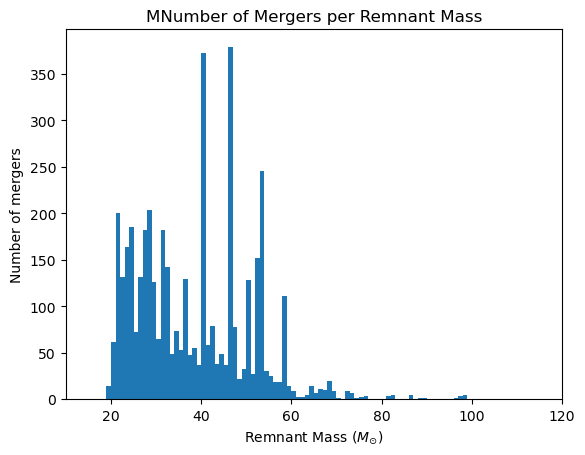

In [52]:
plt.hist(plot_mass, num_mergers)
plt.xlabel('Remnant ' r'Mass ($M_{\odot}$)')
plt.ylabel('Number of mergers')
plt.xlim([10, 120])
plt.title('MNumber of Mergers per Remnant Mass')
plt.show()

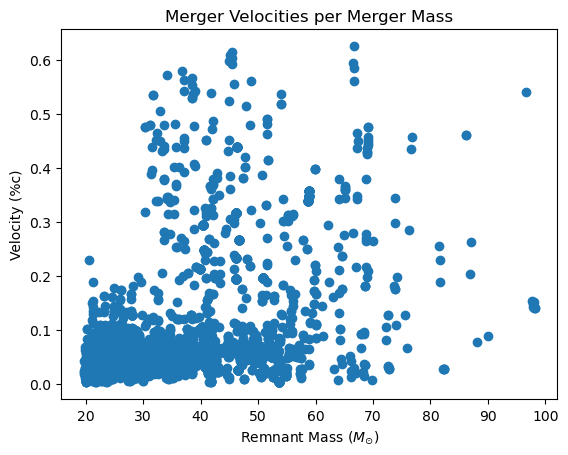

In [49]:
plt.scatter(plot_mass, vel_mag)
plt.xlabel('Remnant ' r'Mass ($M_{\odot}$)')
plt.ylabel('Velocity (%c)')
plt.title('Merger Velocities per Merger Mass')
plt.show()

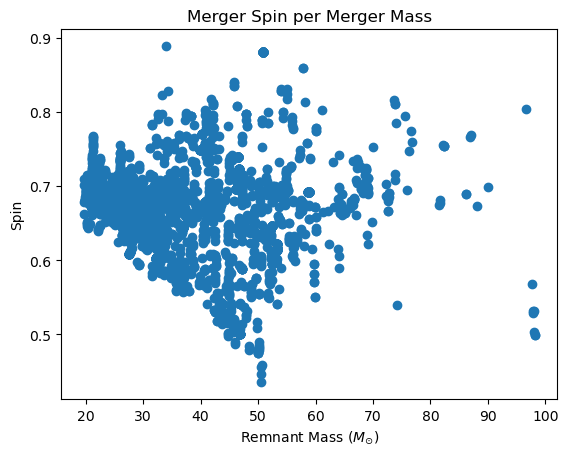

In [53]:
plt.scatter(plot_mass, spin_mag)
plt.xlabel('Remnant ' r'Mass ($M_{\odot}$)')
plt.ylabel('Spin')
plt.title('Merger Spin per Merger Mass')
plt.show()